In [4]:
from google.colab import drive
drive.mount('/content/gdrive/')

Mounted at /content/gdrive/


# data 불러오기

In [1]:
path = '/content/gdrive/MyDrive/소융캡/dataset_1m/'

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf
from scipy import io
import torch
import scipy.sparse as sp

import os
%matplotlib inline
from tensorflow.keras import Model
from tensorflow.keras.layers import Input, Embedding, Reshape, Dot, Flatten, concatenate, Dense, Dropout, BatchNormalization
from tensorflow.keras.callbacks import ModelCheckpoint
from keras.models import Sequential
from keras.layers import Dense, LeakyReLU
from keras.optimizers import Adam
from tensorflow.keras.utils import model_to_dot
from IPython.display import SVG
from numpy.linalg import svd

In [5]:
ratings = pd.read_csv(path + "ratings.dat", sep="::", engine="python",
                      names=["UserID", "MovieID", "Rating", "Timestamp"])

In [6]:
# users = pd.read_csv(path + "users.dat", sep="::", engine="python",
#                     names=["UserID", "Gender", "Age", "Occupation", "Zip-code"])

In [7]:
movies = pd.read_csv(path + "movies.dat", sep="::", engine="python", encoding="ISO-8859-1",
                     names=["MovieID", "Title", "Genres"])

In [8]:
ratings

,UserID,MovieID,Rating,Timestamp
0,1,1193,5,978300760
1,1,661,3,978302109
2,1,914,3,978301968
3,1,3408,4,978300275
4,1,2355,5,978824291
...,...,...,...,...
1000204,6040,1091,1,956716541
1000205,6040,1094,5,956704887
1000206,6040,562,5,956704746
1000207,6040,1096,4,956715648


In [9]:
movies

,MovieID,Title,Genres
0,1,Toy Story (1995),Animation|Children's|Comedy
1,2,Jumanji (1995),Adventure|Children's|Fantasy
2,3,Grumpier Old Men (1995),Comedy|Romance
3,4,Waiting to Exhale (1995),Comedy|Drama
4,5,Father of the Bride Part II (1995),Comedy
...,...,...,...
3878,3948,Meet the Parents (2000),Comedy
3879,3949,Requiem for a Dream (2000),Drama
3880,3950,Tigerland (2000),Drama
3881,3951,Two Family House (2000),Drama


# GAN 들어가기 앞서

## 데이터 전처리

In [10]:
#평점 df
movie_id_list = movies['MovieID'].tolist()
ratings_df = ratings.pivot_table(index='UserID', columns='MovieID', values='Rating', fill_value = 0)
ratings_df = ratings_df.reindex(columns=movie_id_list, fill_value=0)

In [11]:
#결측 df
missing_df = ratings_df.applymap(lambda x: 1 if x > 0 else 0)

## train test split

In [12]:
from sklearn.model_selection import train_test_split

X = missing_df
y = ratings_df

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=2020)

X_train.shape, X_test.shape, y_train.shape, y_test.shape

((4832, 3883), (1208, 3883), (4832, 3883), (1208, 3883))

# GAN _svd


In [ ]:
ratings_df

MovieID,1,2,3,4,5,6,7,8,9,10,...,3943,3944,3945,3946,3947,3948,3949,3950,3951,3952
UserID,,,,,,,,,,,,,,,,,,,,,
1,5,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,2,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6036,0,0,0,2,0,3,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6037,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6038,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
U, S, Vt = svd(ratings_df)

print(U.shape, S.shape, Vt.shape)
print('U matrix:\n',np.round(U, 3))
print('Sigma Value:\n',np.round(S, 3))
print('V transpose matrix:\n',np.round(Vt, 3))

# S를 대각 행렬로 변환
S = np.diag(S)

# 상위 r개의 특이값만 유지합니다. (r은 행렬 A의 랭크입니다.)
r = 3883
S = S[:r, :r]
U = U[:, :r]
Vt = Vt[:r, :]

# U, S, V를 사용하여 원래 데이터로 복원
reconstructed_A = np.dot(U, np.dot(S, Vt))

# # 특정 값 이하의 원소들을 0으로 만듭니다. (여기서는 5를 기준으로 예시로 듭니다.)
# threshold = 0.1
# reconstructed_A[reconstructed_A <= threshold] = 0

# 매트릭스의 모든 값을 반올림합니다.
rounded_matrix = np.round(reconstructed_A).astype(int)


(6040, 6040) (3883,) (3883, 3883)
U matrix:
 [[-0.005  0.002  0.003 ...  0.014 -0.011 -0.019]
 [-0.009 -0.003  0.    ... -0.001 -0.008 -0.006]
 [-0.005 -0.003 -0.003 ... -0.001 -0.022 -0.003]
 ...
 [-0.001  0.002 -0.    ...  0.738  0.009 -0.011]
 [-0.007  0.019 -0.011 ... -0.01   0.287 -0.012]
 [-0.019  0.041 -0.003 ...  0.001 -0.007  0.07 ]]
Sigma Value:
 [1893.211  671.344  574.853 ...    0.       0.       0.   ]
V transpose matrix:
 [[-0.07  -0.024 -0.014 ... -0.003 -0.001 -0.013]
 [-0.021 -0.03  -0.017 ...  0.002  0.002  0.005]
 [ 0.03  -0.01   0.013 ...  0.002  0.004  0.022]
 ...
 [ 0.    -0.     0.    ... -0.    -0.     0.   ]
 [ 0.     0.     0.    ... -0.    -0.     0.   ]
 [ 0.    -0.     0.    ...  0.    -0.    -0.   ]]


In [ ]:
df_reconstructed_matrix = pd.DataFrame(rounded_matrix, columns = ratings_df.columns)
df_reconstructed_matrix.index = range(1, 1+len(df_reconstructed_matrix))
df_reconstructed_matrix = df_reconstructed_matrix.rename_axis("UserID")

In [ ]:
df_reconstructed_matrix

MovieID,1,2,3,4,5,6,7,8,9,10,...,3943,3944,3945,3946,3947,3948,3949,3950,3951,3952
UserID,,,,,,,,,,,,,,,,,,,,,
1,5,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,2,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6036,0,0,0,2,0,3,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6037,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6038,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
are_equal = ratings_df.equals(df_reconstructed_matrix)

if not are_equal:
    # 두 DataFrame이 다른 경우, 어떤 부분이 다른지 확인
    differences = ratings_df != df_reconstructed_matrix

    print("두 DataFrame이 다른 부분:")
    print(differences)

else:
  print("equal")

equal


## Vt

In [ ]:
U

array([[-0.00471786,  0.00164551,  0.00267141, ..., -0.01637631,
         0.00285075, -0.02206743],
       [-0.00928856, -0.00269782,  0.00038215, ..., -0.00013882,
        -0.00334078, -0.00816758],
       [-0.00501018, -0.00334292, -0.00334366, ...,  0.01078547,
         0.02759695,  0.00859207],
       ...,
       [-0.00138885,  0.00181339, -0.00011879, ...,  0.00954331,
         0.00067514,  0.01573447],
       [-0.00700793,  0.0187647 , -0.01071225, ..., -0.03058211,
         0.01059176,  0.00385385],
       [-0.01896102,  0.04080244, -0.00304316, ...,  0.00668368,
         0.00490516, -0.00349886]])

In [ ]:
U_matrix = pd.DataFrame(U, columns = ratings_df.columns)
U_matrix.index = range(1, 1+len(U_matrix))

In [ ]:
U_matrix

MovieID,1,2,3,4,5,6,7,8,9,10,...,3943,3944,3945,3946,3947,3948,3949,3950,3951,3952
1,-0.004718,0.001646,0.002671,0.001373,0.018726,-0.008714,0.005197,-0.004361,-0.018942,-0.013255,...,-0.001387,0.010715,0.031451,0.001116,-0.004299,-0.004437,-0.017111,-0.016376,0.002851,-0.022067
2,-0.009289,-0.002698,0.000382,-0.007095,-0.006765,-0.030726,0.002807,0.007203,0.001452,0.000866,...,-0.011008,0.006716,0.018128,0.004272,-0.006518,0.003748,0.006363,-0.000139,-0.003341,-0.008168
3,-0.005010,-0.003343,-0.003344,-0.003035,0.011767,-0.005247,-0.012518,-0.005198,0.002928,-0.001422,...,0.008895,-0.034004,-0.019195,-0.004698,0.001691,-0.020079,-0.007025,0.010785,0.027597,0.008592
4,-0.002677,-0.001297,-0.007675,-0.007271,0.002077,-0.005713,-0.003652,-0.000168,-0.003683,-0.000187,...,-0.005731,-0.003986,-0.002505,0.020051,-0.025492,0.023402,0.004771,0.007148,0.039059,-0.016647
5,-0.008896,0.003825,0.022099,-0.018478,-0.004815,0.015998,0.010902,0.007355,0.005812,-0.004060,...,-0.012375,-0.004276,-0.000531,0.003081,0.010698,-0.005228,0.007384,-0.012762,0.000130,-0.003633
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6036,-0.033984,0.026138,0.001081,0.002955,-0.018296,0.035779,0.039479,0.033072,-0.008027,0.024348,...,-0.002081,-0.003421,-0.003076,0.001976,-0.001029,-0.000309,0.004943,0.003384,0.001414,-0.003599
6037,-0.013905,0.027102,-0.011332,-0.019723,-0.000334,-0.005549,0.004914,-0.007649,-0.005285,0.001473,...,0.001366,-0.000281,-0.009177,-0.004137,0.009987,-0.006286,0.008775,-0.009036,0.002597,-0.013495
6038,-0.001389,0.001813,-0.000119,0.000556,0.004883,-0.000453,-0.001107,0.001264,0.001435,-0.000075,...,0.001318,-0.004414,-0.000294,0.003827,-0.025235,-0.013081,-0.015479,0.009543,0.000675,0.015734
6039,-0.007008,0.018765,-0.010712,0.008583,0.021981,-0.004233,0.018020,-0.012139,0.013724,-0.012571,...,0.009122,0.006349,0.004399,-0.012141,0.006913,-0.002586,-0.003357,-0.030582,0.010592,0.003854


In [ ]:
S #대각행렬

array([[1.89321056e+03, 0.00000000e+00, 0.00000000e+00, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [0.00000000e+00, 6.71343565e+02, 0.00000000e+00, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [0.00000000e+00, 0.00000000e+00, 5.74852760e+02, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       ...,
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
        1.34879835e-13, 0.00000000e+00, 0.00000000e+00],
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
        0.00000000e+00, 1.34879835e-13, 0.00000000e+00],
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
        0.00000000e+00, 0.00000000e+00, 5.21321407e-14]])

In [ ]:
S_matrix = pd.DataFrame(S, columns = ratings_df.columns)
S_matrix.index = range(1, 1+len(S_matrix))

In [ ]:
S_matrix

MovieID,1,2,3,4,5,6,7,8,9,10,...,3943,3944,3945,3946,3947,3948,3949,3950,3951,3952
1,1893.210559,0.000000,0.00000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
2,0.000000,671.343565,0.00000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
3,0.000000,0.000000,574.85276,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
4,0.000000,0.000000,0.00000,518.084225,0.000000,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
5,0.000000,0.000000,0.00000,0.000000,444.854781,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3879,0.000000,0.000000,0.00000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.348798e-13,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
3880,0.000000,0.000000,0.00000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000e+00,1.348798e-13,0.000000e+00,0.000000e+00,0.000000e+00
3881,0.000000,0.000000,0.00000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000e+00,0.000000e+00,1.348798e-13,0.000000e+00,0.000000e+00
3882,0.000000,0.000000,0.00000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000e+00,0.000000e+00,0.000000e+00,1.348798e-13,0.000000e+00


In [ ]:
Vt

array([[-7.01371394e-02, -2.35438150e-02, -1.37658393e-02, ...,
        -2.61526344e-03, -1.16635687e-03, -1.32565863e-02],
       [-2.09401541e-02, -2.97924550e-02, -1.67038987e-02, ...,
         1.87440015e-03,  2.26511244e-03,  5.02213333e-03],
       [ 3.01647236e-02, -1.01890706e-02,  1.25724193e-02, ...,
         1.78319162e-03,  3.52091700e-03,  2.23576838e-02],
       ...,
       [ 0.00000000e+00, -8.77557189e-33,  2.31347136e-33, ...,
        -2.32116524e-32, -9.59278291e-32,  8.85178532e-33],
       [ 0.00000000e+00,  4.47354677e-33,  1.18143917e-32, ...,
        -1.87416296e-32, -1.43532817e-32,  1.25704999e-33],
       [ 0.00000000e+00, -3.02272940e-17,  2.46165067e-17, ...,
         2.08747126e-16, -2.80264628e-17, -1.29569616e-17]])

In [ ]:
Vt_matrix = pd.DataFrame(Vt, columns = ratings_df.columns)
Vt_matrix.index = range(1, 1+len(Vt_matrix))

In [ ]:
Vt_matrix

MovieID,1,2,3,4,5,6,7,8,9,10,...,3943,3944,3945,3946,3947,3948,3949,3950,3951,3952
1,-0.070137,-2.354382e-02,-1.376584e-02,-5.323396e-03,-9.716514e-03,-3.647701e-02,-1.650216e-02,-2.073570e-03,-3.307241e-03,-3.226286e-02,...,-2.868828e-03,-1.750356e-04,-5.070047e-04,-2.040892e-03,-1.963591e-03,-2.534057e-02,-1.291874e-02,-2.615263e-03,-1.166357e-03,-1.325659e-02
2,-0.020940,-2.979245e-02,-1.670390e-02,-2.962760e-03,-1.348858e-02,-2.883657e-02,-9.294363e-03,-2.153673e-03,-8.420669e-03,-5.404987e-02,...,2.982643e-03,1.762087e-04,-9.970160e-04,-2.372289e-03,3.205551e-03,-1.211868e-02,5.580257e-03,1.874400e-03,2.265112e-03,5.022133e-03
3,0.030165,-1.018907e-02,1.257242e-02,1.235569e-02,1.247469e-02,1.082548e-02,2.385216e-02,6.005952e-04,-2.060385e-03,-1.835195e-02,...,4.129865e-03,3.745209e-04,-7.264226e-05,1.581075e-03,-2.018143e-03,3.962501e-02,2.233269e-02,1.783192e-03,3.520917e-03,2.235768e-02
4,-0.004862,3.109033e-02,2.714274e-02,1.507195e-02,2.888498e-02,-4.199448e-02,4.401997e-02,4.120836e-03,3.532661e-03,6.075868e-03,...,-2.575274e-03,4.816028e-04,4.616878e-04,-2.204460e-04,4.056944e-04,-1.649750e-02,-1.359998e-02,-3.654285e-04,-1.109103e-03,-1.275768e-02
5,0.124778,9.580785e-03,5.832904e-03,-2.627695e-03,4.311423e-03,-7.956227e-02,1.207404e-02,2.851460e-03,-1.034408e-02,-2.418556e-02,...,-1.957933e-03,2.434527e-04,1.843148e-03,-4.112052e-03,-6.185812e-03,1.199396e-02,-1.410865e-02,-5.268348e-03,-8.658513e-04,-1.589169e-02
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3879,0.000000,-8.495051e-20,-4.454729e-20,-8.047641e-20,-1.640119e-19,-9.442327e-21,-5.872618e-20,-8.541740e-22,-2.457872e-19,-2.852039e-20,...,1.214163e-20,9.011447e-19,3.959524e-20,7.551629e-20,1.161258e-19,-4.987255e-20,-4.281699e-20,-7.064788e-20,-6.870093e-20,5.690609e-20
3880,0.000000,-5.966906e-33,1.014300e-32,-3.142463e-32,-2.621526e-32,9.615594e-33,8.737191e-33,1.079275e-31,-4.581233e-32,8.454144e-33,...,4.369794e-32,-7.250121e-32,-2.095809e-31,-1.383158e-31,7.524220e-32,2.169943e-35,-2.091731e-32,-2.033729e-32,1.155081e-31,6.325700e-32
3881,0.000000,-8.775572e-33,2.313471e-33,1.418095e-32,-2.022676e-32,8.771871e-33,-2.388513e-32,-5.370894e-32,-3.839351e-32,-3.592971e-33,...,-4.662076e-32,2.048303e-31,7.575915e-32,-1.027304e-32,-3.091799e-32,-2.920079e-33,-7.445430e-33,-2.321165e-32,-9.592783e-32,8.851785e-33
3882,0.000000,4.473547e-33,1.181439e-32,9.695944e-34,-2.557748e-32,6.473392e-33,-4.061992e-33,1.584469e-32,2.197541e-32,6.659440e-33,...,-7.934380e-33,-5.089519e-32,-4.227567e-32,1.397492e-32,-3.870071e-32,-6.544849e-33,-2.696159e-32,-1.874163e-32,-1.435328e-32,1.257050e-33


In [ ]:
latent_dim = 3883
output_dim = 3883
epochs = 50
batch_size = 128
lr_d = 0.0001
lr_g = 0.00005
n_iter_D = 2
n_iter_G = 1

In [ ]:
from keras.engine.base_layer_utils import V2_DTYPE_BEHAVIOR
# 생성자 모델
Generator = Sequential()
Generator.add(Dense(128, input_shape=(latent_dim,), activation='linear'))
Generator.add(BatchNormalization())

Generator.add(Dense(512, activation='linear'))
Generator.add(BatchNormalization())
Generator.add(Dropout(0.3))

Generator.add(Dense(2048, activation='linear'))
Generator.add(BatchNormalization())
Generator.add(Dropout(0.3))

#output_dim보다 커야함
Generator.add(Dense(4096, activation='linear'))
Generator.add(BatchNormalization())

Generator.add(Dense(output_dim, activation='linear'))


# 판별자 모델
Discriminator = Sequential()
Discriminator.add(Dense(1028, input_shape=(output_dim,), activation='linear'))
Discriminator.add(BatchNormalization())

Discriminator.add(Dense(512, activation='linear'))
Discriminator.add(BatchNormalization())
Discriminator.add(Dropout(0.3))

Discriminator.add(Dense(256, activation='linear'))
Discriminator.add(BatchNormalization())
Discriminator.add(Dropout(0.3))

Discriminator.add(Dense(128, activation='linear'))
Discriminator.add(BatchNormalization())
Discriminator.add(Dropout(0.3))

Discriminator.add(Dense(1, activation='sigmoid'))


Doptimizer = tf.keras.optimizers.Adam(lr_d)
Goptimizer = tf.keras.optimizers.Adam(lr_g)


def get_noise(batch_size,latent_dim):
    return tf.random.normal([batch_size,latent_dim])

loss_D_list = []
loss_G_list = []
loss_GD_list = []

for epoch in tf.range(epochs):

    batch_input = ratings_df.sample(n=batch_size)
    U_batch, S_batch, Vt_batch = np.linalg.svd(batch_input, full_matrices=False)

    #missing = batch_input.applymap(lambda x: 1 if x > 0 else 0)

    #inputs = tf.Variable(batch_input.values, tf.float32)

    #missing_array = tf.Variable(missing.values, tf.float32)

    #inputs = tf.cast(inputs, tf.float32)

    #missing_array = tf.cast(missing_array, tf.float32)

    inputs = Vt_batch

    with tf.GradientTape(persistent=True) as t1, tf.GradientTape(persistent=True) as t2:


      for iter in range(n_iter_G):
        generated_data = Generator(get_noise(batch_size,latent_dim))
        #G = generated_data * missing_array
        G = generated_data
        Z = Discriminator(G)
        loss_G = -tf.reduce_mean(tf.math.log(Z))
        Ggradients = t2.gradient(loss_G,Generator.trainable_variables)
        #inf 방지??
        Ggradients = [tf.clip_by_value(grad, -1.0, 1.0) for grad in Ggradients]
        Goptimizer.apply_gradients(zip(Ggradients, Generator.trainable_variables))

      for iter in range(n_iter_D):
        generated_data = Generator(get_noise(batch_size,latent_dim))
        #G = generated_data * missing_array
        G = generated_data
        Z = Discriminator(G)
        R = Discriminator(inputs)
        # 둘 다 minimize
        loss_D = -tf.reduce_mean(tf.math.log(R) + tf.math.log(1 - Z))
        #loss_G = -tf.reduce_mean(tf.math.log(Z))
        Dgradients = t1.gradient(loss_D, Discriminator.trainable_variables)
        #inf 방지??
        Dgradients = [tf.clip_by_value(grad, -1.0, 1.0) for grad in Dgradients]
        Doptimizer.apply_gradients(zip(Dgradients, Discriminator.trainable_variables))

    loss_D_list.append(loss_D)
    loss_G_list.append(loss_G)
    loss_GD_list.append(loss_D+loss_G)

    print(f'Epoch: {epoch}, Discriminator Loss: {loss_D}, Generator Loss: {loss_G}, GAN Loss: {loss_D+loss_G}')
    #print(f"epoch: {epoch} d_loss: {loss_D} g_loss: {loss_G}")

Epoch: 0, Discriminator Loss: 1.558531641960144, Generator Loss: 0.8550402522087097, GAN Loss: 2.413571834564209
Epoch: 1, Discriminator Loss: 1.6127036809921265, Generator Loss: 0.9215916395187378, GAN Loss: 2.5342953205108643
Epoch: 2, Discriminator Loss: 1.6648186445236206, Generator Loss: 0.9465539455413818, GAN Loss: 2.611372470855713
Epoch: 3, Discriminator Loss: 1.7024140357971191, Generator Loss: 0.7832050323486328, GAN Loss: 2.485619068145752
Epoch: 4, Discriminator Loss: 1.5774261951446533, Generator Loss: 0.8720192909240723, GAN Loss: 2.4494454860687256
Epoch: 5, Discriminator Loss: 1.6858892440795898, Generator Loss: 0.802450954914093, GAN Loss: 2.488340139389038
Epoch: 6, Discriminator Loss: 1.5991172790527344, Generator Loss: 0.7901281714439392, GAN Loss: 2.3892455101013184
Epoch: 7, Discriminator Loss: 1.6124688386917114, Generator Loss: 0.8093838691711426, GAN Loss: 2.4218525886535645
Epoch: 8, Discriminator Loss: 1.6052708625793457, Generator Loss: 0.78675377368927, GA

epoch 50 : 3분 25초

두 손실 함수 중 하나만 감소하는 것을 선택하는 것은 상황에 따라 다릅니다. 예를 들어, loss_g만 감소하면서 loss_d가 증가하는 경우, 생성자가 더 이상 학습할 부분이 없어지거나 과적합(overfitting)이 발생할 가능성이 높습니다. 따라서 이러한 상황에서는 loss_d를 개선하기 위한 추가적인 학습 전략이 필요합니다.

반면에, loss_d만 감소하면서 loss_g가 증가하는 경우, 생성자가 더 많은 학습을 진행해야 하며, 이러한 상황에서는 생성자의 학습률(learning rate)을 조절하여 개선할 수 있습니다.

loss의 주기성은 g와 d의 레이어 개수가 다르면 발생할 수 있다.

In [ ]:
Vt

array([[-7.01371394e-02, -2.35438150e-02, -1.37658393e-02, ...,
        -2.61526344e-03, -1.16635687e-03, -1.32565863e-02],
       [-2.09401541e-02, -2.97924550e-02, -1.67038987e-02, ...,
         1.87440015e-03,  2.26511244e-03,  5.02213333e-03],
       [ 3.01647236e-02, -1.01890706e-02,  1.25724193e-02, ...,
         1.78319162e-03,  3.52091700e-03,  2.23576838e-02],
       ...,
       [ 0.00000000e+00, -8.77557189e-33,  2.31347136e-33, ...,
        -2.32116524e-32, -9.59278291e-32,  8.85178532e-33],
       [ 0.00000000e+00,  4.47354677e-33,  1.18143917e-32, ...,
        -1.87416296e-32, -1.43532817e-32,  1.25704999e-33],
       [ 0.00000000e+00, -3.02272940e-17,  2.46165067e-17, ...,
         2.08747126e-16, -2.80264628e-17, -1.29569616e-17]])

In [ ]:
generated_data

<tf.Tensor: shape=(128, 3883), dtype=float32, numpy=
array([[-0.362603  ,  0.58366185,  0.4177105 , ...,  0.04204588,
        -0.07561605, -0.22536317],
       [ 0.43178326, -0.407386  ,  0.77078694, ..., -0.30584994,
         0.06757852,  0.17712785],
       [-0.1808695 ,  0.8304375 , -0.16615011, ..., -0.19688381,
         0.16715029, -0.07108185],
       ...,
       [-0.22491495,  0.3572654 ,  0.12431914, ...,  0.59619695,
        -0.7616857 ,  0.03405258],
       [ 0.02481274, -0.4790083 ,  0.01975312, ...,  0.9870454 ,
         0.12812085, -0.48845127],
       [-0.04535731,  0.3056607 ,  0.7142078 , ...,  0.6316761 ,
         0.07194794,  0.26549295]], dtype=float32)>

In [ ]:
generated_data_matrix = pd.DataFrame(generated_data, columns = ratings_df.columns)
generated_data_matrix.index = range(1, 1+len(generated_data_matrix))

In [ ]:
generated_data_matrix

MovieID,1,2,3,4,5,6,7,8,9,10,...,3943,3944,3945,3946,3947,3948,3949,3950,3951,3952
1,-0.362603,0.583662,0.417711,0.466944,-0.182565,0.171051,-0.222893,-0.168506,-0.011762,-0.034905,...,0.776747,-0.209082,-0.552523,-0.365241,0.218408,-0.054760,0.004195,0.042046,-0.075616,-0.225363
2,0.431783,-0.407386,0.770787,0.408628,-0.278952,0.385196,0.348598,0.714600,0.172741,0.512796,...,0.020826,-0.093545,-0.208827,-0.000635,-0.475530,0.203321,0.076118,-0.305850,0.067579,0.177128
3,-0.180870,0.830437,-0.166150,0.034361,-0.207019,-0.358295,0.094473,-0.347514,-0.445048,0.548675,...,0.205132,0.528378,0.301942,-0.421137,-0.184713,-0.224968,-0.132778,-0.196884,0.167150,-0.071082
4,0.965713,0.189916,-0.293955,0.079751,0.462588,-0.001191,0.296552,0.572552,-0.417655,-0.117073,...,0.201023,-0.237573,0.756208,-0.723807,-0.606407,-0.320208,-0.111190,-0.035279,-0.306129,0.330931
5,-0.447226,-0.128383,0.089485,0.216283,-0.374549,-0.136528,-0.052900,0.075338,-0.485725,-0.521356,...,0.491033,0.135231,-0.578469,0.018499,-0.498742,-0.609514,-0.650749,-0.463678,0.386536,-0.199299
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
124,-0.043362,0.037695,-0.594718,-0.010596,-0.001767,-0.531215,-0.354310,0.468199,0.278157,0.122168,...,-0.421799,-0.527788,-0.213011,-0.005213,-1.086310,-0.405687,0.185818,0.233027,-0.055163,0.126657
125,-0.661451,0.110613,-0.152845,-0.485371,-0.382112,-0.060550,-0.312115,0.209184,0.383189,0.003472,...,0.164520,-0.458310,-0.835644,-0.141695,0.138768,-0.112412,-0.480577,0.481506,-0.683376,0.559849
126,-0.224915,0.357265,0.124319,-0.203228,0.236167,-0.322644,-1.767228,0.352881,-0.459387,0.110760,...,-0.218954,0.409966,-0.310858,0.280926,0.285793,0.455819,-0.198310,0.596197,-0.761686,0.034053
127,0.024813,-0.479008,0.019753,0.124268,0.560984,0.528215,-0.147308,0.723279,0.111531,-0.246917,...,0.048603,0.189674,0.426002,-0.072004,0.167347,0.681884,-0.669657,0.987045,0.128121,-0.488451


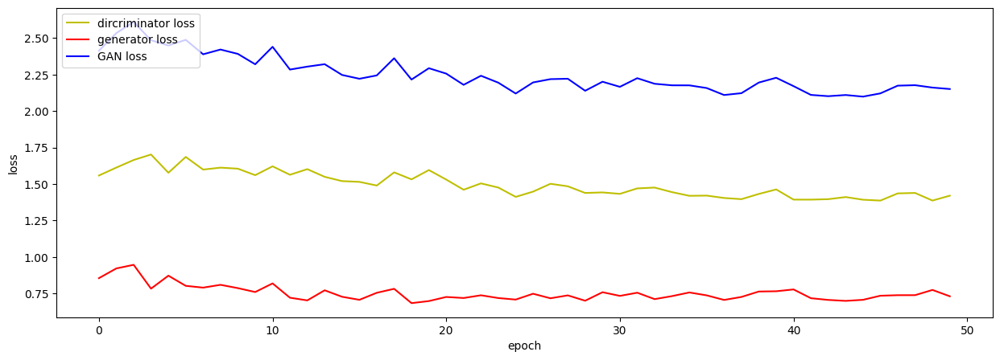

In [ ]:
import matplotlib.pyplot as plt

fig, loss_ax = plt.subplots(figsize = (15,5))

loss_ax.plot(loss_D_list, 'y', label = 'dircriminator loss')
loss_ax.plot(loss_G_list, 'r', label = 'generator loss')
loss_ax.plot(loss_GD_list, 'b', label = 'GAN loss')

loss_ax.set_xlabel('epoch')
loss_ax.set_ylabel('loss')
loss_ax.legend(loc='upper left')

plt.show()

In [ ]:
# 모델 저장
Generator.save('/content/gdrive/MyDrive/소융캡/generator_ratings.h5')

In [ ]:
batch_size = 3883
latent_dim = 3883

In [ ]:
def get_noise(batch_size,latent_dim):
    return tf.random.normal([batch_size,latent_dim])

In [ ]:
fake_Vt = Generator(get_noise(batch_size,latent_dim))

In [ ]:
df_fakeVt = pd.DataFrame(fake_Vt, columns = ratings_df.columns)
df_fakeVt.index = range(1, 1+len(df_fakeVt))

In [ ]:
Vt_matrix

NameError: ignored

In [ ]:
df_fakeVt

MovieID,1,2,3,4,5,6,7,8,9,10,...,3943,3944,3945,3946,3947,3948,3949,3950,3951,3952
1,-0.000810,-0.454233,-0.354708,-0.307448,0.291808,-0.521166,-0.800427,-0.145189,-0.771409,-0.043573,...,-0.124956,-0.019066,-0.184025,0.086565,-0.264361,-0.237906,0.749173,-0.568288,1.028411,-0.392934
2,0.174562,-0.451464,0.855959,0.124375,-0.129948,-0.511378,0.057879,-0.303995,0.155292,-0.066147,...,0.137406,-0.111037,0.032591,-0.389384,0.288321,-0.339230,0.580681,-0.484831,0.236771,-0.260543
3,-0.418676,-0.255214,0.050075,-0.085013,0.267096,-0.326894,-0.865970,0.315076,0.056134,0.033178,...,-1.039413,0.219400,0.382397,0.532479,0.052117,0.119451,-0.986068,0.152457,0.032560,-0.367711
4,-0.786855,0.083224,0.174658,0.147819,-0.039192,0.601896,-0.461354,-0.650710,-0.381773,0.159183,...,-0.525759,0.803934,0.224928,-0.954667,0.290934,0.072476,0.088090,-0.132139,-0.059228,-0.025676
5,-0.543142,-0.472164,-0.393234,-0.183978,-0.360059,0.367255,-0.044535,0.358448,0.329833,0.102299,...,-0.693341,-0.326950,0.530384,0.428211,-0.052680,0.679714,-0.151968,0.848689,-0.667242,-0.216806
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3879,-0.304909,0.237657,0.011250,0.285391,-0.826745,-0.226508,-0.241888,0.181190,0.002471,0.247446,...,0.355230,-0.497547,-0.312348,-0.067217,-0.742379,-0.206678,-0.460588,-0.177483,0.361538,0.317486
3880,-0.627919,-0.103436,-0.634430,0.346181,-0.890987,-0.163050,0.197706,-0.478704,0.548253,-0.243126,...,0.637888,-0.286187,0.568647,-0.593807,-0.307920,-0.185991,0.372634,-0.140280,-0.433070,-0.283431
3881,-0.172627,-0.117906,-0.697993,-0.050381,0.061335,0.649999,-0.663274,-0.169500,0.799909,-0.014043,...,-0.209241,0.146723,-0.085840,0.009904,0.058314,0.551615,-0.082007,0.329211,-0.381582,-0.241626
3882,-0.012096,-0.546828,-0.514423,-0.113374,0.284590,0.321423,0.330394,-0.737804,0.018965,-0.374668,...,-0.832887,-0.207733,-0.174769,0.415813,0.268641,0.680449,0.002693,-0.106688,0.138262,-0.863159


In [ ]:
reconstructed_A = np.dot(U, np.dot(S, Vt))

# 매트릭스의 모든 값을 반올림합니다.
rounded_matrix = np.round(reconstructed_A).astype(int)

In [ ]:
df_reconstructed_matrix = pd.DataFrame(rounded_matrix, columns = ratings_df.columns)
df_reconstructed_matrix.index = range(1, 1+len(df_reconstructed_matrix))
df_reconstructed_matrix = df_reconstructed_matrix.rename_axis("UserID")

In [ ]:
reconstructed_fakeA = np.dot(U, np.dot(S, fake_Vt))

# 매트릭스의 모든 값을 반올림합니다.
rounded_matrix_fake = np.round(reconstructed_fakeA).astype(int)

In [ ]:
df_reconstructed_matrix_fake = pd.DataFrame(rounded_matrix_fake, columns = ratings_df.columns)
df_reconstructed_matrix_fake.index = range(1, 1+len(df_reconstructed_matrix_fake))
df_reconstructed_matrix_fake = df_reconstructed_matrix_fake.rename_axis("UserID")

In [ ]:
df_reconstructed_matrix

MovieID,1,2,3,4,5,6,7,8,9,10,...,3943,3944,3945,3946,3947,3948,3949,3950,3951,3952
UserID,,,,,,,,,,,,,,,,,,,,,
1,5,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,2,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6036,0,0,0,2,0,3,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6037,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6038,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
df_reconstructed_matrix_fake

MovieID,1,2,3,4,5,6,7,8,9,10,...,3943,3944,3945,3946,3947,3948,3949,3950,3951,3952
UserID,,,,,,,,,,,,,,,,,,,,,
1,-5,-14,5,0,0,-10,6,-6,8,3,...,5,0,-1,11,-1,11,-2,2,-15,-1
2,21,-5,-16,3,-24,-6,8,4,-38,-14,...,11,10,-20,22,7,-15,-6,-9,-41,15
3,3,22,-3,-6,-22,12,-19,0,6,1,...,-9,6,-5,10,10,-1,-4,33,-21,8
4,6,-1,-15,6,-2,3,31,-4,20,-3,...,11,-10,5,5,-2,8,0,1,-3,9
5,-3,-17,9,15,-7,6,2,-16,31,-29,...,19,-25,-31,23,8,24,22,-18,15,9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6036,4,-8,29,-36,-34,18,43,-18,66,-22,...,34,62,-10,-12,35,11,-88,19,-61,-1
6037,18,35,-8,5,25,-26,46,34,61,3,...,-14,-14,31,12,-5,-24,-10,-12,-46,-9
6038,5,0,-10,8,-4,11,4,5,0,-14,...,10,0,14,-11,1,7,0,11,-12,6


##결측벡터

In [ ]:
latent_dim = 100
output_dim = 3883
epochs = 50
batch_size = 128
lr_d = 0.00005
lr_g = 0.00003
n_iter_D = 2
n_iter_G = 1

In [ ]:
# 생성자 모델
Generator_fake = Sequential()
Generator_fake.add(Dense(128, input_shape=(latent_dim,), activation=LeakyReLU(0.2)))
Generator_fake.add(BatchNormalization())

Generator_fake.add(Dense(512, activation=LeakyReLU(0.2)))
Generator_fake.add(BatchNormalization())
Generator_fake.add(Dropout(0.3))

Generator_fake.add(Dense(2048, activation=LeakyReLU(0.2)))
Generator_fake.add(BatchNormalization())
Generator_fake.add(Dropout(0.3))

#output_dim보다 커야함
Generator_fake.add(Dense(4096, activation=LeakyReLU(0.2)))
Generator_fake.add(BatchNormalization())

Generator_fake.add(Dense(output_dim, activation='relu'))


# 판별자 모델
Discriminator = Sequential()
Discriminator.add(Dense(1028, input_shape=(output_dim,), activation=LeakyReLU(0.2)))
Discriminator.add(BatchNormalization())

Discriminator.add(Dense(512, activation=LeakyReLU(0.2)))
Discriminator.add(BatchNormalization())
Discriminator.add(Dropout(0.3))

Discriminator.add(Dense(256, activation=LeakyReLU(0.2)))
Discriminator.add(BatchNormalization())
Discriminator.add(Dropout(0.3))

Discriminator.add(Dense(128, activation=LeakyReLU(0.2)))
Discriminator.add(BatchNormalization())
Discriminator.add(Dropout(0.3))

Discriminator.add(Dense(1, activation='sigmoid'))


Doptimizer = tf.keras.optimizers.Adam(lr_d)
Goptimizer = tf.keras.optimizers.Adam(lr_g)


def get_noise(batch_size,latent_dim):
    return tf.random.normal([batch_size,latent_dim])

loss_D_list = []
loss_G_list = []
loss_GD_list = []

for epoch in tf.range(epochs):
    batch_input = X_train.sample(n=batch_size)

    inputs = tf.Variable(batch_input.values, tf.float32)
    inputs = tf.cast(inputs, tf.float32)

    #with tf.GradientTape() as t1, tf.GradientTape() as t2:
    with tf.GradientTape(persistent=True) as t1, tf.GradientTape(persistent=True) as t2:


      for iter in range(n_iter_G):
        generated_data = Generator_fake(get_noise(batch_size,latent_dim))
        Z = Discriminator(generated_data)
        loss_G = -tf.reduce_mean(tf.math.log(Z))
        Ggradients = t2.gradient(loss_G,Generator_fake.trainable_variables)
        #inf 방지??
        Ggradients = [tf.clip_by_value(grad, -1.0, 1.0) for grad in Ggradients]
        Goptimizer.apply_gradients(zip(Ggradients, Generator_fake.trainable_variables))

      for iter in range(n_iter_D):
        generated_data = Generator_fake(get_noise(batch_size,latent_dim))
        Z = Discriminator(generated_data)
        R = Discriminator(inputs)
        # 둘 다 minimize
        loss_D = -tf.reduce_mean(tf.math.log(R) + tf.math.log(1 - Z))
        #loss_G = -tf.reduce_mean(tf.math.log(Z))
        Dgradients = t1.gradient(loss_D, Discriminator.trainable_variables)
        #inf 방지??
        Dgradients = [tf.clip_by_value(grad, -1.0, 1.0) for grad in Dgradients]
        Doptimizer.apply_gradients(zip(Dgradients, Discriminator.trainable_variables))

    loss_D_list.append(loss_D)
    loss_G_list.append(loss_G)
    loss_GD_list.append(loss_D+loss_G)

    print(f'Epoch: {epoch}, Discriminator Loss: {loss_D}, Generator Loss: {loss_G}, GAN Loss: {loss_D+loss_G}')
    #print(f"epoch: {epoch} d_loss: {loss_D} g_loss: {loss_G}")

Epoch: 0, Discriminator Loss: 1.397957682609558, Generator Loss: 0.7137259244918823, GAN Loss: 2.1116836071014404
Epoch: 1, Discriminator Loss: 1.3458890914916992, Generator Loss: 0.6871767044067383, GAN Loss: 2.0330657958984375
Epoch: 2, Discriminator Loss: 1.3122663497924805, Generator Loss: 0.6740025281906128, GAN Loss: 1.9862688779830933
Epoch: 3, Discriminator Loss: 1.247708797454834, Generator Loss: 0.6673983335494995, GAN Loss: 1.9151071310043335
Epoch: 4, Discriminator Loss: 1.2217624187469482, Generator Loss: 0.6601306200027466, GAN Loss: 1.8818930387496948
Epoch: 5, Discriminator Loss: 1.1734110116958618, Generator Loss: 0.6601518392562866, GAN Loss: 1.8335628509521484
Epoch: 6, Discriminator Loss: 1.1680281162261963, Generator Loss: 0.6610754728317261, GAN Loss: 1.8291035890579224
Epoch: 7, Discriminator Loss: 1.0921735763549805, Generator Loss: 0.6665648221969604, GAN Loss: 1.758738398551941
Epoch: 8, Discriminator Loss: 1.0608985424041748, Generator Loss: 0.675410389900207

In [ ]:
df_missing_create = pd.DataFrame(generated_data, columns = ratings_df.columns)
df_missing_create.index = range(10001, 10001+len(df_missing_create))
df_missing_create = df_missing_create.rename_axis("UserID")

In [ ]:
df_missing_create

MovieID,1,2,3,4,5,6,7,8,9,10,...,3943,3944,3945,3946,3947,3948,3949,3950,3951,3952
UserID,,,,,,,,,,,,,,,,,,,,,
10001,0.052894,0.072499,0.000000,0.011392,0.079475,0.0,0.121645,0.0,0.0,0.0,...,0.0,0.000000,0.0,0.123803,0.000000,0.134008,0.000000,0.089309,0.0,0.0
10002,0.018050,0.062481,0.000000,0.000000,0.000000,0.0,0.048570,0.0,0.0,0.0,...,0.0,0.000000,0.0,0.056442,0.021269,0.075194,0.013829,0.007808,0.0,0.0
10003,0.070938,0.103690,0.000000,0.000000,0.000000,0.0,0.115592,0.0,0.0,0.0,...,0.0,0.000000,0.0,0.031524,0.000000,0.012207,0.000000,0.000000,0.0,0.0
10004,0.034336,0.110779,0.000000,0.002103,0.057980,0.0,0.045976,0.0,0.0,0.0,...,0.0,0.000000,0.0,0.058656,0.000000,0.048557,0.000000,0.050203,0.0,0.0
10005,0.078531,0.107682,0.006003,0.001625,0.063278,0.0,0.079874,0.0,0.0,0.0,...,0.0,0.000000,0.0,0.030137,0.000000,0.090128,0.000000,0.080171,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10124,0.087349,0.077433,0.000000,0.025608,0.070746,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.000000,0.0,0.000000,0.000000,0.158446,0.000000,0.000000,0.0,0.0
10125,0.000000,0.017432,0.000000,0.010580,0.038829,0.0,0.003575,0.0,0.0,0.0,...,0.0,0.000000,0.0,0.019865,0.000000,0.004551,0.000000,0.000000,0.0,0.0
10126,0.000000,0.121238,0.000000,0.000000,0.061820,0.0,0.017710,0.0,0.0,0.0,...,0.0,0.000000,0.0,0.012842,0.000000,0.126013,0.000000,0.031034,0.0,0.0


In [ ]:
max_val = df_missing_create.max().max()
print(max_val)

0.59962416


In [ ]:
zero_cols = (df_missing_create == 0).all(axis=0).sum()
print(zero_cols)

912


In [ ]:
df_missing = df_missing_create.copy()

In [ ]:
df_missing.to_csv(path + 'df_missing.csv', index=False)

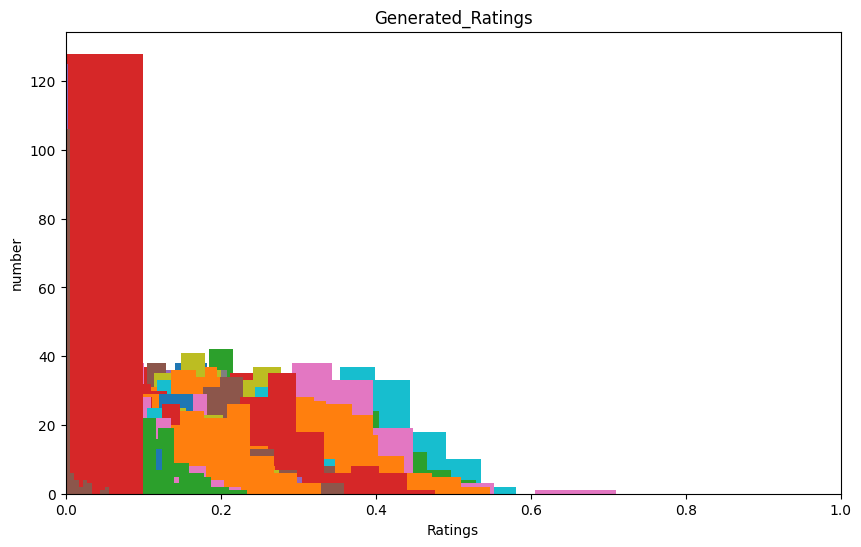

In [ ]:
#df.replace(0, float('nan'), inplace = True)
plt.figure(figsize=(10, 6))
for column_name in df_missing.columns:
  plt.hist(df_missing[column_name])
plt.xlim(0, 1)
plt.xlabel('Ratings') # x축 라벨 설정
plt.ylabel('number') # y축 라벨 설정
plt.title('Generated_Ratings') # 그래프 제목 설정
plt.show() # 그래프 출력

<Axes: xlabel='MovieID', ylabel='UserID'>

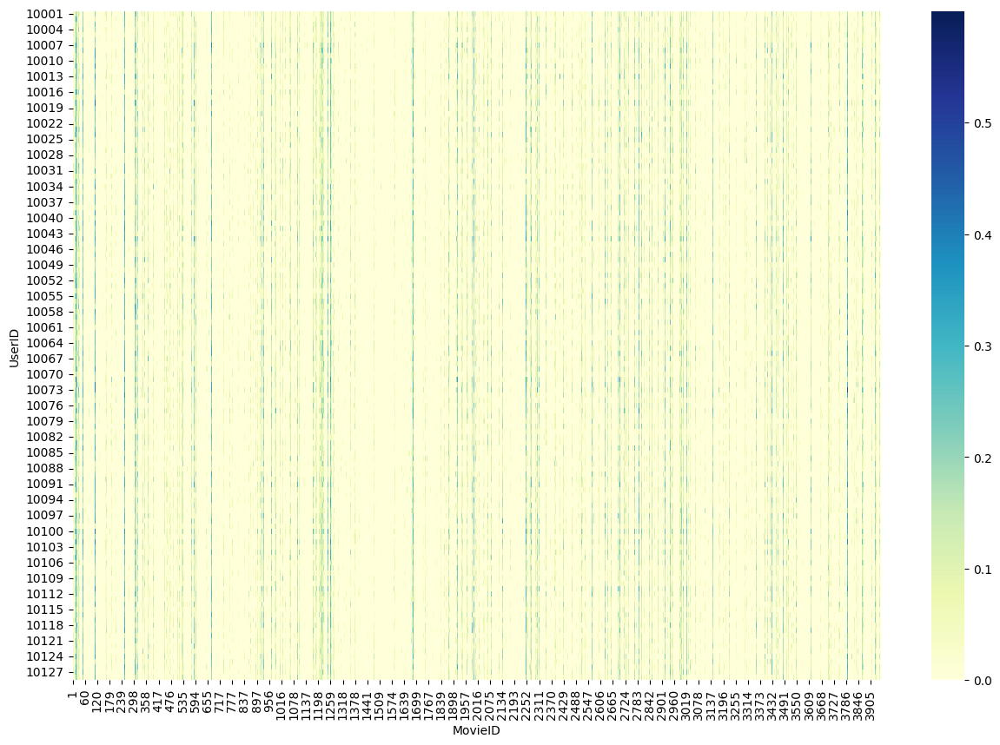

In [ ]:
fig, ax = plt.subplots(figsize=(15, 10))
sns.heatmap(df_missing, cmap='YlGnBu', ax=ax)

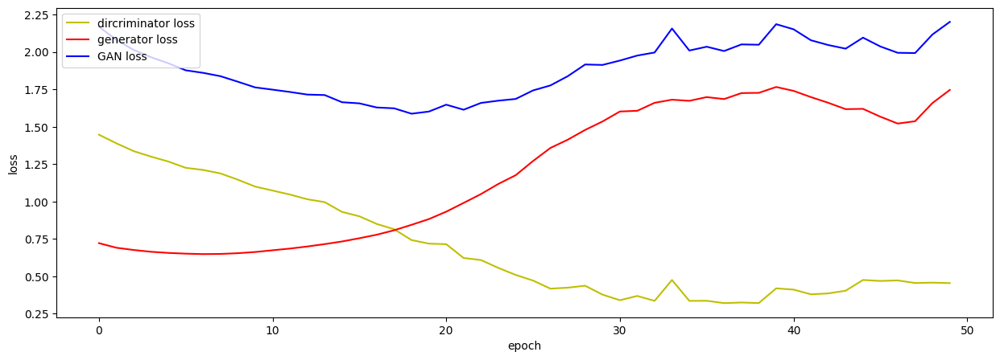

In [ ]:
import matplotlib.pyplot as plt

fig, loss_ax = plt.subplots(figsize = (15,5))

loss_ax.plot(loss_D_list, 'y', label = 'dircriminator loss')
loss_ax.plot(loss_G_list, 'r', label = 'generator loss')
loss_ax.plot(loss_GD_list, 'b', label = 'GAN loss')

loss_ax.set_xlabel('epoch')
loss_ax.set_ylabel('loss')
loss_ax.legend(loc='upper left')

plt.show()

In [ ]:
# 모델 저장
Generator_fake.save('/content/gdrive/MyDrive/소융캡/generator_missing.h5')

## 둘이 합치기

In [ ]:
df = pd.read_csv(path + 'df.csv')
df_missing = pd.read_csv(path + 'df_missing.csv')

In [ ]:
df

,1,2,3,4,5,6,7,8,9,10,...,3943,3944,3945,3946,3947,3948,3949,3950,3951,3952
0,3.183490,0.935007,1.648902,0.0,0.0,2.156809,1.039504,0.941542,0.0,1.922148,...,0.0,0.0,0.0,0.830314,0.0,1.315674,0.105796,0.0,0.0,0.0
1,4.033639,0.948156,2.067377,0.0,0.0,2.876275,1.194977,1.293240,0.0,2.407170,...,0.0,0.0,0.0,1.016418,0.0,1.460905,0.000000,0.0,0.0,0.0
2,3.240699,1.046382,1.871159,0.0,0.0,2.349153,1.123688,1.005807,0.0,2.139540,...,0.0,0.0,0.0,0.807247,0.0,1.406264,0.000000,0.0,0.0,0.0
3,3.164995,0.872687,1.697020,0.0,0.0,2.227464,1.071367,0.841108,0.0,2.024266,...,0.0,0.0,0.0,0.835464,0.0,1.417332,0.014005,0.0,0.0,0.0
4,4.575909,1.231814,2.323828,0.0,0.0,3.141922,1.430309,1.366636,0.0,2.867755,...,0.0,0.0,0.0,1.206033,0.0,1.968708,0.000000,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
123,3.735405,1.131685,1.960139,0.0,0.0,2.530974,1.062864,1.094206,0.0,2.316194,...,0.0,0.0,0.0,1.131987,0.0,1.414476,0.111323,0.0,0.0,0.0
124,3.420942,0.987566,1.677600,0.0,0.0,2.362683,1.105213,0.825324,0.0,2.060761,...,0.0,0.0,0.0,0.919750,0.0,1.362141,0.063923,0.0,0.0,0.0
125,4.884240,1.289308,2.502110,0.0,0.0,3.526764,1.554880,1.260745,0.0,3.095705,...,0.0,0.0,0.0,1.192717,0.0,1.910210,0.000000,0.0,0.0,0.0
126,4.608130,1.236723,2.431184,0.0,0.0,3.308710,1.357902,1.352042,0.0,2.942385,...,0.0,0.0,0.0,1.022922,0.0,1.795195,0.000000,0.0,0.0,0.0


missing_df에 ['1':'0'] = [1000209 : 21384031] = [1:21] 비율로 존재

In [ ]:
values_flattened = df_missing.values.flatten()
top_values = sorted(set(values_flattened), reverse=True)[:25000]

In [ ]:
values_flattened = np.where(np.isin(values_flattened, top_values), 1, 0)

# 1차원 배열을 다시 128 * 3706 크기의 데이터프레임으로 변환
df_missing_final = pd.DataFrame(values_flattened.reshape(128, 3706), index=df.index, columns=df.columns)

In [ ]:
df_missing_final

,1,2,3,4,5,6,7,8,9,10,...,3943,3944,3945,3946,3947,3948,3949,3950,3951,3952
0,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,1,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
123,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
124,0,0,1,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
125,0,1,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
126,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
df_final = df_missing_final * df

In [ ]:
df_final = np.ceil(df_final)
df_final[df_final > 5] = 5

In [ ]:
counts = df_final.stack().value_counts()

In [ ]:
counts

0.0    459047
2.0      7030
1.0      3753
3.0      3462
4.0       802
5.0       274
dtype: int64

In [ ]:
df_final = df_final.astype(int)

In [ ]:
df_final

,1,2,3,4,5,6,7,8,9,10,...,3943,3944,3945,3946,3947,3948,3949,3950,3951,3952
0,0,0,2,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,2,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,2,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,3,0,0,0,0,0,0,3,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
123,0,0,2,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
124,0,0,2,0,0,3,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
125,0,2,3,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
126,0,0,3,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


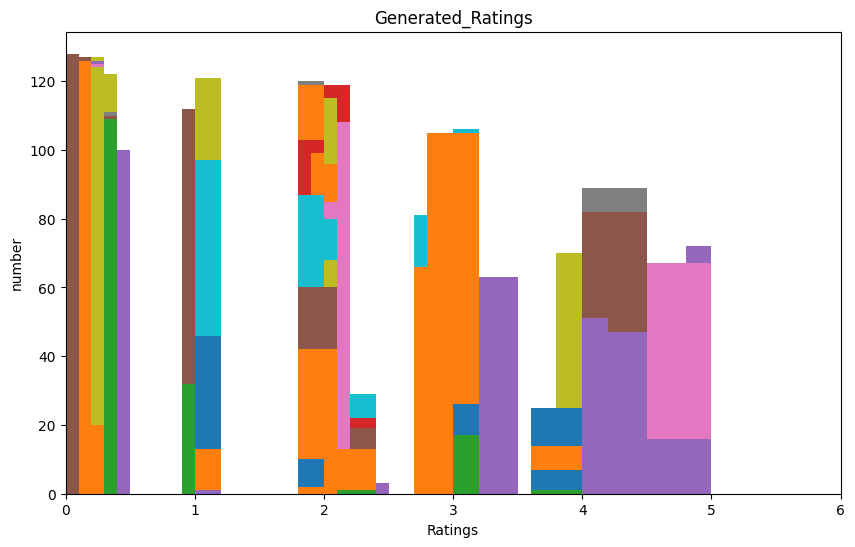

In [ ]:
#df.replace(0, float('nan'), inplace = True)
plt.figure(figsize=(10, 6))
for column_name in df_final.columns:
  plt.hist(df_final[column_name])
plt.xlim(0, 6)
plt.xlabel('Ratings') # x축 라벨 설정
plt.ylabel('number') # y축 라벨 설정
plt.title('Generated_Ratings') # 그래프 제목 설정
plt.show() # 그래프 출력

In [ ]:
df_final.index.name = 'UserID'
df_final.columns.name = 'MovieID'
df_final.name = 'Rating'

In [ ]:
df_fake = df_final.reset_index().melt(id_vars='UserID', value_name='Rating', var_name='MovieID').dropna()

In [ ]:
df_fake = df_fake[df_fake['Rating'] != 0]

In [ ]:
df_fake

,UserID,MovieID,Rating
13,13,1,4
33,33,1,4
44,44,1,4
72,72,1,3
73,73,1,4
...,...,...,...
473908,52,3949,1
473930,74,3949,1
473931,75,3949,1
473952,96,3949,1


In [ ]:
df_fake.to_csv(path + 'df_fake.csv', index=False)

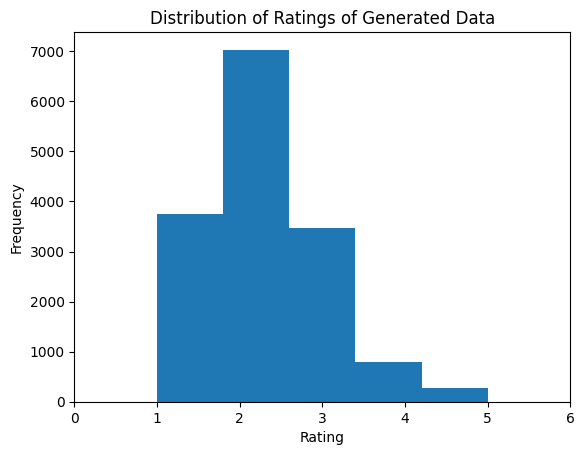

In [ ]:
#df.replace(0, float('nan'), inplace = True)
plt.xlim(0, 6)
colors = ['red', 'green', 'blue', 'orange', 'purple']
plt.hist(df_fake['Rating'], bins = 5)
plt.xlabel('Rating')
plt.ylabel('Frequency')
plt.title('Distribution of Ratings of Generated Data')
plt.show()

## 양 늘리기 (batch size 조정)


In [ ]:
from tensorflow.keras.models import load_model
generator_ratings = load_model('/content/gdrive/MyDrive/소융캡/generator_ratings.h5')
generator_missing = load_model('/content/gdrive/MyDrive/소융캡/generator_missing.h5')

In [ ]:
batch_size = 4096
latent_dim = 100

In [ ]:
def get_noise(batch_size,latent_dim):
    return tf.random.normal([batch_size,latent_dim])

In [ ]:
fake_ratings = generator_ratings(get_noise(batch_size,latent_dim))
fake_missing = generator_missing(get_noise(batch_size,latent_dim))

In [ ]:
df_ratings_create = pd.DataFrame(fake_ratings, columns = ratings_df.columns)
df_ratings_create.index = range(10001, 10001+len(df_ratings_create))
df_ratings_create = df_ratings_create.rename_axis("UserID")

In [ ]:
max_val = df_ratings_create.max().max()
print(max_val)

6.61111


In [ ]:
df_missing_create = pd.DataFrame(fake_missing, columns = ratings_df.columns)
df_missing_create.index = range(10001, 10001+len(df_missing_create))
df_missing_create = df_missing_create.rename_axis("UserID")

In [ ]:
max_val = df_missing_create.max().max()
print(max_val)

0.6485951


missing_df에 ['1':'0'] = [1000209 : 21384031] = [1:21] 비율로 존재

In [ ]:
values_flattened = df_missing_create.values.flatten()  # DataFrame을 1차원 배열로 변환합니다
top_values = sorted(set(values_flattened), reverse=True)[:1000000]

In [ ]:
values_flattened = np.where(np.isin(values_flattened, top_values), 1, 0)

# 1차원 배열을 다시 batchsize * 3883 크기의 데이터프레임으로 변환
df_missing_final = pd.DataFrame(values_flattened.reshape(batch_size, 3883), index=df_missing_create.index, columns=df_missing_create.columns)

In [ ]:
counts = df_missing_final.stack().value_counts()

In [ ]:
counts

0    14853978
1     1050790
dtype: int64

In [ ]:
df_final = df_missing_final * df_ratings_create

In [ ]:
df_final = np.ceil(df_final)
df_final[df_final > 5] = 5

In [ ]:
counts = df_final.stack().value_counts()

In [ ]:
counts

0.0    15203263
2.0      311998
1.0      229117
3.0      119768
4.0       34341
5.0        6281
dtype: int64

In [ ]:
df_final = df_final.astype(int)

In [ ]:
df_final

MovieID,1,2,3,4,5,6,7,8,9,10,...,3943,3944,3945,3946,3947,3948,3949,3950,3951,3952
UserID,,,,,,,,,,,,,,,,,,,,,
10001,3,0,3,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10002,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10003,3,0,3,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10004,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10005,3,0,3,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14092,2,0,2,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
14093,3,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
14094,0,0,3,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
df_final.index.name = 'UserID'
df_final.columns.name = 'MovieID'
df_final.name = 'Rating'

In [ ]:
df_fake = df_final.reset_index().melt(id_vars='UserID', value_name='Rating', var_name='MovieID').dropna()

In [ ]:
df_fake = df_fake[df_fake['Rating'] != 0]

In [ ]:
df_fake

,UserID,MovieID,Rating
0,10001,1,3
2,10003,1,3
4,10005,1,3
6,10007,1,2
8,10009,1,3
...,...,...,...
15883407,13216,3947,1
15883416,13225,3947,1
15883696,13505,3947,1
15883739,13548,3947,1


In [ ]:
df_fake.to_csv(path + 'df_fake.csv', index=False)

In [ ]:
df_fake_read = pd.read_csv(path + 'df_fake.csv')

In [ ]:
df_fake_read

,UserID,MovieID,Rating
0,10001,1,3
1,10003,1,3
2,10005,1,3
3,10007,1,2
4,10009,1,3
...,...,...,...
701500,13216,3947,1
701501,13225,3947,1
701502,13505,3947,1
701503,13548,3947,1


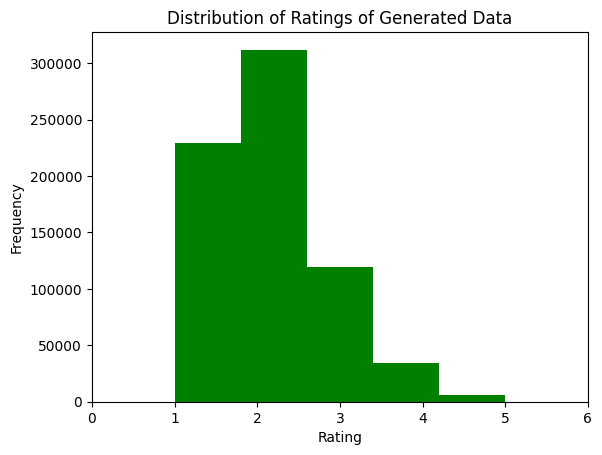

In [ ]:
#df.replace(0, float('nan'), inplace = True)
plt.xlim(0, 6)
plt.hist(df_fake['Rating'], bins = 5, color = 'green')
plt.xlabel('Rating')
plt.ylabel('Frequency')
plt.title('Distribution of Ratings of Generated Data')
plt.show()

# GAN

##평점벡터

In [ ]:
latent_dim = 100
output_dim = 3883
epochs = 50
batch_size = 4832
lr_d = 0.00005
lr_g = 0.00003
n_iter_D = 1
n_iter_G = 1

In [ ]:
# 생성자 모델
Generator = Sequential()
Generator.add(Dense(128, input_shape=(latent_dim,), activation=LeakyReLU(0.2)))
Generator.add(BatchNormalization())

Generator.add(Dense(512, activation=LeakyReLU(0.2)))
Generator.add(BatchNormalization())
Generator.add(Dropout(0.3))

Generator.add(Dense(2048, activation=LeakyReLU(0.2)))
Generator.add(BatchNormalization())
Generator.add(Dropout(0.3))

#output_dim보다 커야함
Generator.add(Dense(4096, activation=LeakyReLU(0.2)))
Generator.add(BatchNormalization())

Generator.add(Dense(output_dim, activation='relu'))


# 판별자 모델
Discriminator = Sequential()
Discriminator.add(Dense(1028, input_shape=(output_dim,), activation=LeakyReLU(0.2)))
Discriminator.add(BatchNormalization())

Discriminator.add(Dense(512, activation=LeakyReLU(0.2)))
Discriminator.add(BatchNormalization())
Discriminator.add(Dropout(0.3))

Discriminator.add(Dense(256, activation=LeakyReLU(0.2)))
Discriminator.add(BatchNormalization())
Discriminator.add(Dropout(0.3))

Discriminator.add(Dense(128, activation=LeakyReLU(0.2)))
Discriminator.add(BatchNormalization())
Discriminator.add(Dropout(0.3))

Discriminator.add(Dense(1, activation='sigmoid'))


Doptimizer = tf.keras.optimizers.Adam(lr_d)
Goptimizer = tf.keras.optimizers.Adam(lr_g)


def get_noise(batch_size,latent_dim):
    return tf.random.normal([batch_size,latent_dim])

loss_D_list = []
loss_G_list = []
loss_GD_list = []

for epoch in tf.range(epochs):
    batch_input = y_train.sample(n=batch_size)
    missing = batch_input.applymap(lambda x: 1 if x > 0 else 0)

    inputs = tf.Variable(batch_input.values, tf.float32)
    missing_array = tf.Variable(missing.values, tf.float32)
    inputs = tf.cast(inputs, tf.float32)
    missing_array = tf.cast(missing_array, tf.float32)

    #with tf.GradientTape() as t1, tf.GradientTape() as t2:
    with tf.GradientTape(persistent=True) as t1, tf.GradientTape(persistent=True) as t2:


      for iter in range(n_iter_G):
        generated_data = Generator(get_noise(batch_size,latent_dim))
        G = generated_data * missing_array
        Z = Discriminator(G)
        loss_G = -tf.reduce_mean(tf.math.log(Z))
        Ggradients = t2.gradient(loss_G,Generator.trainable_variables)
        #inf 방지??
        Ggradients = [tf.clip_by_value(grad, -1.0, 1.0) for grad in Ggradients]
        Goptimizer.apply_gradients(zip(Ggradients, Generator.trainable_variables))

      for iter in range(n_iter_D):
        generated_data = Generator(get_noise(batch_size,latent_dim))
        G = generated_data * missing_array
        Z = Discriminator(G)
        R = Discriminator(inputs)
        # 둘 다 minimize
        loss_D = -tf.reduce_mean(tf.math.log(R) + tf.math.log(1 - Z))
        #loss_G = -tf.reduce_mean(tf.math.log(Z))
        Dgradients = t1.gradient(loss_D, Discriminator.trainable_variables)
        #inf 방지??
        Dgradients = [tf.clip_by_value(grad, -1.0, 1.0) for grad in Dgradients]
        Doptimizer.apply_gradients(zip(Dgradients, Discriminator.trainable_variables))

    loss_D_list.append(loss_D)
    loss_G_list.append(loss_G)
    loss_GD_list.append(loss_D+loss_G)

    print(f'Epoch: {epoch}, Discriminator Loss: {loss_D}, Generator Loss: {loss_G}, GAN Loss: {loss_D+loss_G}')
    #print(f"epoch: {epoch} d_loss: {loss_D} g_loss: {loss_G}")

Epoch: 0, Discriminator Loss: 1.1079343557357788, Generator Loss: 0.6870059370994568, GAN Loss: 1.7949402332305908
Epoch: 1, Discriminator Loss: 1.008490800857544, Generator Loss: 0.684457004070282, GAN Loss: 1.6929478645324707
Epoch: 2, Discriminator Loss: 0.9452075958251953, Generator Loss: 0.6813852787017822, GAN Loss: 1.6265928745269775
Epoch: 3, Discriminator Loss: 0.9032135009765625, Generator Loss: 0.6775972247123718, GAN Loss: 1.580810785293579
Epoch: 4, Discriminator Loss: 0.8747212886810303, Generator Loss: 0.6731292605400085, GAN Loss: 1.5478506088256836
Epoch: 5, Discriminator Loss: 0.8558549880981445, Generator Loss: 0.667873203754425, GAN Loss: 1.5237281322479248
Epoch: 6, Discriminator Loss: 0.843583881855011, Generator Loss: 0.6615837216377258, GAN Loss: 1.5051676034927368
Epoch: 7, Discriminator Loss: 0.8371709585189819, Generator Loss: 0.6547951698303223, GAN Loss: 1.4919661283493042
Epoch: 8, Discriminator Loss: 0.8358517289161682, Generator Loss: 0.6467297077178955,

epoch 50 : 3분 25초

두 손실 함수 중 하나만 감소하는 것을 선택하는 것은 상황에 따라 다릅니다. 예를 들어, loss_g만 감소하면서 loss_d가 증가하는 경우, 생성자가 더 이상 학습할 부분이 없어지거나 과적합(overfitting)이 발생할 가능성이 높습니다. 따라서 이러한 상황에서는 loss_d를 개선하기 위한 추가적인 학습 전략이 필요합니다.

반면에, loss_d만 감소하면서 loss_g가 증가하는 경우, 생성자가 더 많은 학습을 진행해야 하며, 이러한 상황에서는 생성자의 학습률(learning rate)을 조절하여 개선할 수 있습니다.

loss의 주기성은 g와 d의 레이어 개수가 다르면 발생할 수 있다.

In [ ]:
generated_data = Generator(get_noise(batch_size,latent_dim))

In [ ]:
df_ratings_create = pd.DataFrame(generated_data, columns = ratings_df.columns)
df_ratings_create.index = range(10001, 10001+len(df_ratings_create))
df_ratings_create = df_ratings_create.rename_axis("UserID")

In [ ]:
df_ratings_create

MovieID,1,2,3,4,5,6,7,8,9,10,...,3943,3944,3945,3946,3947,3948,3949,3950,3951,3952
UserID,,,,,,,,,,,,,,,,,,,,,
10001,0.524319,1.455803,0.0,1.815855,0.0,2.949776,1.212914,1.565138,0.0,2.165531,...,1.721542,0.114791,0.0,1.045452,1.077629,0.0,1.506165,0.945577,1.066031,1.805900
10002,0.380308,1.806943,0.0,1.953139,0.0,3.348657,1.306660,1.653089,0.0,2.341942,...,2.141980,0.000000,0.0,1.377290,1.067330,0.0,1.905860,1.060036,1.372307,2.204735
10003,0.608846,1.784067,0.0,1.745231,0.0,3.380811,1.333338,1.738602,0.0,2.539726,...,2.125800,0.078475,0.0,1.254907,1.202394,0.0,1.778304,1.051065,1.165994,2.172038
10004,0.461179,1.212651,0.0,1.443106,0.0,2.570038,1.034311,1.261982,0.0,1.848196,...,1.699439,0.061212,0.0,0.956869,0.927403,0.0,1.383542,0.911860,0.894407,1.807063
10005,0.530076,1.596479,0.0,1.616733,0.0,2.968170,1.111831,1.496934,0.0,2.185694,...,1.555606,0.177062,0.0,1.194885,1.088614,0.0,1.525578,1.044446,0.875417,1.998247
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14828,0.429269,1.223641,0.0,1.366770,0.0,2.447961,0.765355,1.299850,0.0,1.547176,...,1.411927,0.049451,0.0,0.926450,0.902410,0.0,1.166341,0.789967,0.884848,1.514755
14829,0.707903,1.434296,0.0,1.471291,0.0,2.725392,1.139170,1.551826,0.0,2.101180,...,1.382407,0.186873,0.0,1.081924,1.156459,0.0,1.493351,0.775066,0.886376,1.772556
14830,0.646580,1.664699,0.0,1.747057,0.0,3.270150,1.520567,1.690311,0.0,2.331577,...,1.826836,0.083272,0.0,1.276916,1.188113,0.0,1.652082,1.014038,1.062720,2.029816


In [ ]:
max_val = df_ratings_create.max().max()
print(max_val)

6.733419


In [ ]:
zero_cols = (df_ratings_create == 0).all(axis=0).sum()
print(zero_cols)

1097


In [ ]:
df = df_ratings_create.copy()

In [ ]:
#저장
df.to_csv(path + 'df1.csv', index=False)

In [ ]:
df1 = pd.read_csv(path + "df1.csv")

In [ ]:
df1

,1,2,3,4,5,6,7,8,9,10,...,3943,3944,3945,3946,3947,3948,3949,3950,3951,3952
0,4.170675,0.0,3.426849,2.987852,1.885616,0.697231,0.010030,0.000000,0.209767,2.060371,...,2.663805,0.217377,0.536345,2.845673,0.0,1.751488,3.032351,0.0,2.834946,3.742786
1,4.212559,0.0,3.516029,3.202918,1.735626,0.753253,0.277761,0.167930,0.324644,2.315302,...,2.476068,0.242783,0.750102,2.986611,0.0,2.200967,3.374759,0.0,3.160069,3.857338
2,2.762691,0.0,2.406533,1.981527,1.074633,0.518163,0.193772,0.000000,0.170708,1.520749,...,1.848574,0.105979,0.351658,1.951380,0.0,1.448307,1.934589,0.0,1.975851,2.516751
3,4.725677,0.0,3.717033,2.937557,1.748105,0.895152,0.195084,0.022706,0.436300,2.186052,...,2.464764,0.183450,0.524074,2.984312,0.0,1.937213,3.096065,0.0,3.141900,4.034593
4,4.177773,0.0,3.170686,3.269654,1.669626,0.771929,0.199591,0.186966,0.386281,2.261222,...,2.526880,0.179387,0.477820,2.671085,0.0,2.157297,3.135060,0.0,2.814315,3.847074
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4827,4.001986,0.0,2.847567,2.670664,1.317112,0.819963,0.209155,0.122400,0.517264,1.996981,...,2.124464,0.460961,0.576364,2.746654,0.0,1.750121,2.740919,0.0,2.502673,3.179631
4828,3.282225,0.0,3.074066,2.218766,0.984255,0.675148,0.000000,0.067327,0.094801,2.022424,...,1.865754,0.044981,0.635559,2.423964,0.0,1.631673,2.382858,0.0,2.372641,3.079810
4829,3.756860,0.0,3.184695,2.743967,1.537539,0.764780,0.000000,0.096546,0.403457,1.934378,...,2.080751,0.097735,0.747148,2.514422,0.0,1.951229,2.795939,0.0,2.551382,3.154736
4830,4.532990,0.0,3.521552,3.327230,1.874230,0.733372,0.284301,0.149166,0.307086,2.447977,...,2.608537,0.100426,0.902218,3.037988,0.0,2.320524,3.278746,0.0,3.161000,4.156858


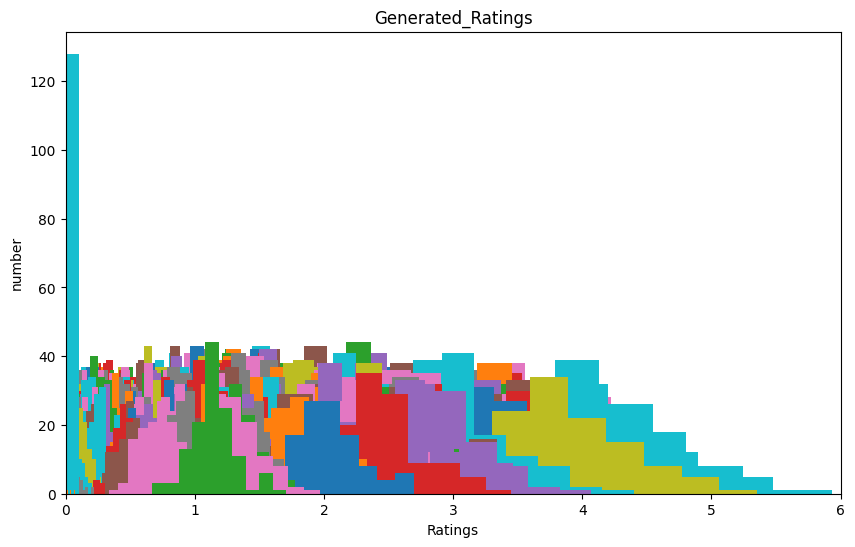

In [ ]:
#df.replace(0, float('nan'), inplace = True)
plt.figure(figsize=(10, 6))
for column_name in df.columns:
  plt.hist(df[column_name])
plt.xlim(0, 6)
plt.xlabel('Ratings') # x축 라벨 설정
plt.ylabel('number') # y축 라벨 설정
plt.title('Generated_Ratings') # 그래프 제목 설정
plt.show() # 그래프 출력

<Axes: xlabel='MovieID', ylabel='UserID'>

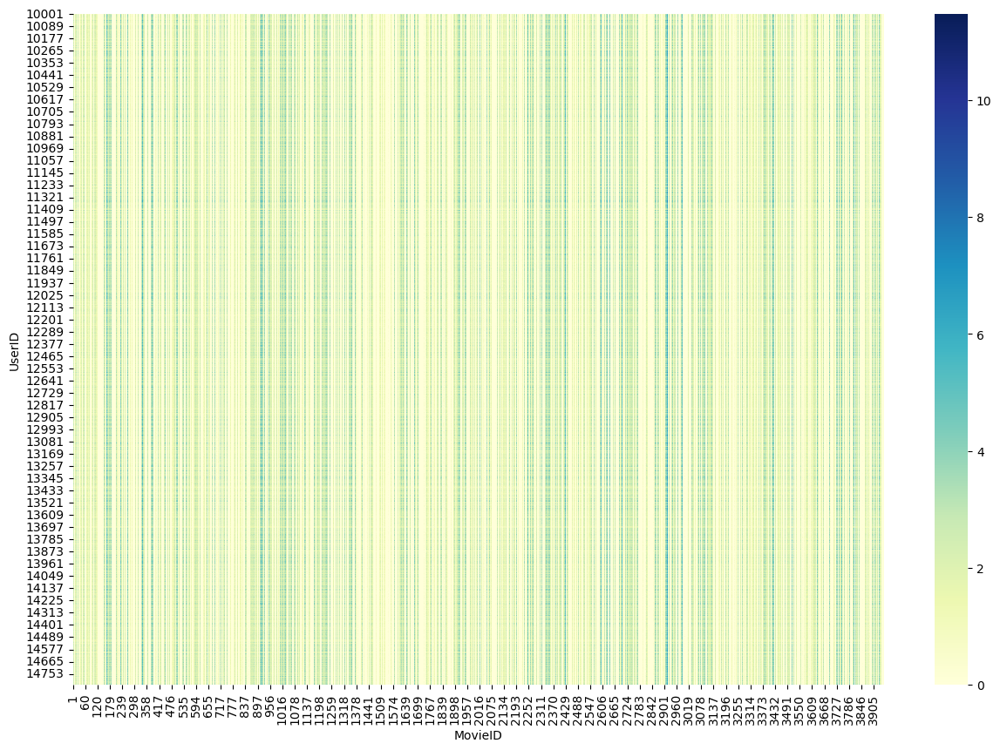

In [ ]:
fig, ax = plt.subplots(figsize=(15, 10))
sns.heatmap(df, cmap='YlGnBu', ax=ax)

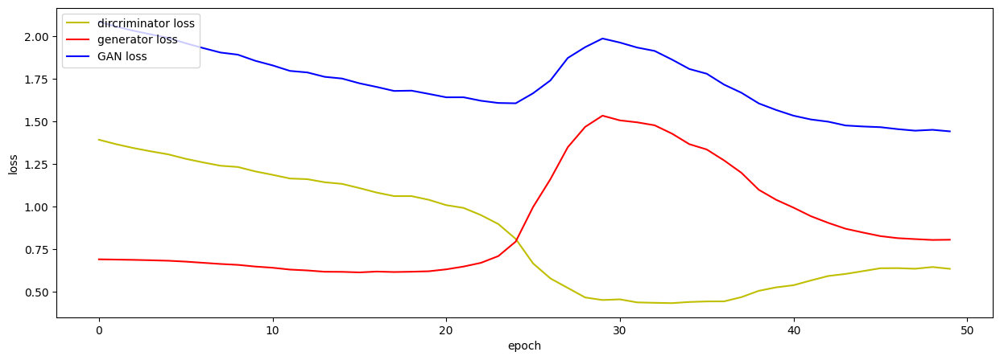

In [ ]:
import matplotlib.pyplot as plt

fig, loss_ax = plt.subplots(figsize = (15,5))

loss_ax.plot(loss_D_list, 'y', label = 'dircriminator loss')
loss_ax.plot(loss_G_list, 'r', label = 'generator loss')
loss_ax.plot(loss_GD_list, 'b', label = 'GAN loss')

loss_ax.set_xlabel('epoch')
loss_ax.set_ylabel('loss')
loss_ax.legend(loc='upper left')

plt.show()

In [ ]:
# 모델 저장
Generator.save('/content/gdrive/MyDrive/소융캡/generator_ratings.h5')

### row col 재구성한 gan

In [ ]:
reshaped_y_train = y_train.unstack().reset_index().pivot(index='MovieID', columns='UserID', values=0)

In [ ]:
reshaped_y_train

UserID,1,3,4,5,7,8,9,10,12,13,...,6027,6028,6030,6031,6032,6033,6035,6036,6038,6039
MovieID,,,,,,,,,,,,,,,,,,,,,
1,5,0,0,0,0,4,5,5,0,0,...,0,0,0,0,4,0,4,0,0,0
2,0,0,0,0,0,0,0,5,0,3,...,0,0,4,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
4,0,0,0,0,0,3,0,0,0,0,...,0,0,0,0,0,0,2,2,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3948,0,0,0,0,0,0,3,4,0,0,...,0,0,0,0,0,0,0,0,0,0
3949,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3950,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
latent_dim = 4832
output_dim = 4832
epochs = 50
batch_size = 3883
lr_d = 0.00005
lr_g = 0.00003
n_iter_D = 1
n_iter_G = 1

In [ ]:
# 생성자 모델
Generator = Sequential()
Generator.add(Dense(128, input_shape=(latent_dim,), activation=LeakyReLU(0.2)))
Generator.add(BatchNormalization())

Generator.add(Dense(512, activation=LeakyReLU(0.2)))
Generator.add(BatchNormalization())
Generator.add(Dropout(0.3))

Generator.add(Dense(2048, activation=LeakyReLU(0.2)))
Generator.add(BatchNormalization())
Generator.add(Dropout(0.3))

#output_dim보다 커야함
Generator.add(Dense(4096, activation=LeakyReLU(0.2)))
Generator.add(BatchNormalization())

Generator.add(Dense(output_dim, activation='relu'))


# 판별자 모델
Discriminator = Sequential()
Discriminator.add(Dense(1028, input_shape=(output_dim,), activation=LeakyReLU(0.2)))
Discriminator.add(BatchNormalization())

Discriminator.add(Dense(512, activation=LeakyReLU(0.2)))
Discriminator.add(BatchNormalization())
Discriminator.add(Dropout(0.3))

Discriminator.add(Dense(256, activation=LeakyReLU(0.2)))
Discriminator.add(BatchNormalization())
Discriminator.add(Dropout(0.3))

Discriminator.add(Dense(128, activation=LeakyReLU(0.2)))
Discriminator.add(BatchNormalization())
Discriminator.add(Dropout(0.3))

Discriminator.add(Dense(1, activation='sigmoid'))


Doptimizer = tf.keras.optimizers.Adam(lr_d)
Goptimizer = tf.keras.optimizers.Adam(lr_g)


def get_noise(batch_size,latent_dim):
    return tf.random.normal([batch_size,latent_dim])

loss_D_list = []
loss_G_list = []
loss_GD_list = []

for epoch in tf.range(epochs):
    batch_input = reshaped_y_train.sample(n=batch_size)
    missing = batch_input.applymap(lambda x: 1 if x > 0 else 0)

    inputs = tf.Variable(batch_input.values, tf.float32)
    missing_array = tf.Variable(missing.values, tf.float32)
    inputs = tf.cast(inputs, tf.float32)
    missing_array = tf.cast(missing_array, tf.float32)

    #with tf.GradientTape() as t1, tf.GradientTape() as t2:
    with tf.GradientTape(persistent=True) as t1, tf.GradientTape(persistent=True) as t2:


      for iter in range(n_iter_G):
        generated_data = Generator(get_noise(batch_size,latent_dim))
        G = generated_data * missing_array
        Z = Discriminator(G)
        loss_G = -tf.reduce_mean(tf.math.log(Z))
        Ggradients = t2.gradient(loss_G,Generator.trainable_variables)
        #inf 방지??
        Ggradients = [tf.clip_by_value(grad, -1.0, 1.0) for grad in Ggradients]
        Goptimizer.apply_gradients(zip(Ggradients, Generator.trainable_variables))

      for iter in range(n_iter_D):
        generated_data = Generator(get_noise(batch_size,latent_dim))
        G = generated_data * missing_array
        Z = Discriminator(G)
        R = Discriminator(inputs)
        # 둘 다 minimize
        loss_D = -tf.reduce_mean(tf.math.log(R) + tf.math.log(1 - Z))
        #loss_G = -tf.reduce_mean(tf.math.log(Z))
        Dgradients = t1.gradient(loss_D, Discriminator.trainable_variables)
        #inf 방지??
        Dgradients = [tf.clip_by_value(grad, -1.0, 1.0) for grad in Dgradients]
        Doptimizer.apply_gradients(zip(Dgradients, Discriminator.trainable_variables))

    loss_D_list.append(loss_D)
    loss_G_list.append(loss_G)
    loss_GD_list.append(loss_D+loss_G)

    print(f'Epoch: {epoch}, Discriminator Loss: {loss_D}, Generator Loss: {loss_G}, GAN Loss: {loss_D+loss_G}')
    #print(f"epoch: {epoch} d_loss: {loss_D} g_loss: {loss_G}")

Epoch: 0, Discriminator Loss: 1.3535127639770508, Generator Loss: 0.6926878690719604, GAN Loss: 2.046200752258301
Epoch: 1, Discriminator Loss: 1.2175531387329102, Generator Loss: 0.6875461339950562, GAN Loss: 1.9050992727279663
Epoch: 2, Discriminator Loss: 1.143021583557129, Generator Loss: 0.6830010414123535, GAN Loss: 1.8260226249694824
Epoch: 3, Discriminator Loss: 1.0961453914642334, Generator Loss: 0.6783899068832397, GAN Loss: 1.7745352983474731
Epoch: 4, Discriminator Loss: 1.0647602081298828, Generator Loss: 0.6730617880821228, GAN Loss: 1.7378220558166504
Epoch: 5, Discriminator Loss: 1.0435994863510132, Generator Loss: 0.6673425436019897, GAN Loss: 1.710942029953003
Epoch: 6, Discriminator Loss: 1.0292582511901855, Generator Loss: 0.661170482635498, GAN Loss: 1.6904287338256836
Epoch: 7, Discriminator Loss: 1.0206661224365234, Generator Loss: 0.6538156867027283, GAN Loss: 1.6744818687438965
Epoch: 8, Discriminator Loss: 1.0173543691635132, Generator Loss: 0.6464399099349976

In [ ]:
reshaped_generated_data = Generator(get_noise(batch_size,latent_dim))

In [ ]:
df_ratings_reshaped = pd.DataFrame(reshaped_generated_data, columns = reshaped_y_train.columns)
df_ratings_reshaped.index = range(10001, 10001+len(df_ratings_reshaped))
df_ratings_reshaped = df_ratings_reshaped.rename_axis("MovieID")

In [ ]:
df_ratings_reshaped

UserID,1,3,4,5,7,8,9,10,12,13,...,6027,6028,6030,6031,6032,6033,6035,6036,6038,6039
MovieID,,,,,,,,,,,,,,,,,,,,,
10001,0.0,0.0,0.961033,0.0,0.0,2.074495,1.130113,1.826847,0.0,2.311021,...,0.0,1.023563,2.915741,0.451557,0.0,0.0,1.885470,0.0,0.0,2.168503
10002,0.0,0.0,0.742263,0.0,0.0,1.823542,0.799475,1.605872,0.0,2.068417,...,0.0,1.148188,2.596710,0.550795,0.0,0.0,1.253349,0.0,0.0,1.675881
10003,0.0,0.0,0.977622,0.0,0.0,2.172151,0.968567,1.973766,0.0,2.610642,...,0.0,1.475963,3.312919,0.336177,0.0,0.0,1.528884,0.0,0.0,2.314213
10004,0.0,0.0,0.859423,0.0,0.0,2.669894,1.091357,2.368603,0.0,2.769110,...,0.0,1.383413,3.336182,0.462207,0.0,0.0,1.868139,0.0,0.0,2.528857
10005,0.0,0.0,0.581018,0.0,0.0,1.781309,0.740290,1.240701,0.0,1.764277,...,0.0,0.833237,2.342025,0.362168,0.0,0.0,1.330129,0.0,0.0,1.706862
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13879,0.0,0.0,0.971727,0.0,0.0,2.151061,0.970649,1.919435,0.0,2.482452,...,0.0,1.390680,3.168185,0.327689,0.0,0.0,1.620774,0.0,0.0,2.312809
13880,0.0,0.0,0.860963,0.0,0.0,2.884130,1.333799,2.427546,0.0,3.124654,...,0.0,1.488855,3.593979,0.456646,0.0,0.0,1.885849,0.0,0.0,2.685136
13881,0.0,0.0,0.926628,0.0,0.0,2.184783,1.033312,1.716668,0.0,2.416162,...,0.0,1.038272,2.914624,0.267478,0.0,0.0,1.650830,0.0,0.0,2.032338


In [ ]:
max_val = df_ratings_reshaped.max().max()
print(max_val)

7.7320385


In [ ]:
zero_cols = (df_ratings_reshaped == 0).all(axis=0).sum()
print(zero_cols)

1390


In [ ]:
df2 = df_ratings_reshaped.copy()

In [ ]:
#저장
df2.to_csv(path + 'df2.csv', index=False)

In [ ]:
df2 = pd.read_csv(path + "df2.csv")

In [ ]:
df2

,1,3,4,5,7,8,9,10,12,13,...,6027,6028,6030,6031,6032,6033,6035,6036,6038,6039
0,0.0,0.0,0.961033,0.0,0.0,2.074495,1.130113,1.826847,0.0,2.311021,...,0.0,1.023563,2.915741,0.451557,0.0,0.0,1.885470,0.0,0.0,2.168503
1,0.0,0.0,0.742263,0.0,0.0,1.823542,0.799475,1.605872,0.0,2.068417,...,0.0,1.148188,2.596710,0.550795,0.0,0.0,1.253349,0.0,0.0,1.675881
2,0.0,0.0,0.977622,0.0,0.0,2.172151,0.968567,1.973766,0.0,2.610642,...,0.0,1.475963,3.312919,0.336177,0.0,0.0,1.528884,0.0,0.0,2.314213
3,0.0,0.0,0.859423,0.0,0.0,2.669894,1.091357,2.368603,0.0,2.769110,...,0.0,1.383413,3.336182,0.462207,0.0,0.0,1.868139,0.0,0.0,2.528857
4,0.0,0.0,0.581018,0.0,0.0,1.781309,0.740290,1.240701,0.0,1.764277,...,0.0,0.833237,2.342025,0.362168,0.0,0.0,1.330129,0.0,0.0,1.706862
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3878,0.0,0.0,0.971727,0.0,0.0,2.151061,0.970649,1.919435,0.0,2.482452,...,0.0,1.390680,3.168185,0.327689,0.0,0.0,1.620774,0.0,0.0,2.312809
3879,0.0,0.0,0.860963,0.0,0.0,2.884129,1.333799,2.427545,0.0,3.124654,...,0.0,1.488855,3.593979,0.456646,0.0,0.0,1.885849,0.0,0.0,2.685136
3880,0.0,0.0,0.926628,0.0,0.0,2.184782,1.033312,1.716668,0.0,2.416161,...,0.0,1.038272,2.914624,0.267478,0.0,0.0,1.650830,0.0,0.0,2.032338
3881,0.0,0.0,1.096153,0.0,0.0,2.452625,0.982199,2.260628,0.0,2.491938,...,0.0,1.327625,3.535433,0.343824,0.0,0.0,1.470233,0.0,0.0,2.406944


In [ ]:
fig, ax = plt.subplots(figsize=(15, 10))
sns.heatmap(df2, cmap='YlGnBu', ax=ax)

In [ ]:
fig, ax = plt.subplots(figsize=(15, 10))
sns.heatmap(df, cmap='YlGnBu', ax=ax)

NameError: ignored

### 둘이 합

In [ ]:
df1 = pd.read_csv(path + "df1.csv")
df2 = pd.read_csv(path + "df2.csv")

In [ ]:
df2_new = df2.transpose()
df2_new = df2_new.set_index(df1.index)
df2_new.columns = df1.columns

In [ ]:
result = df1 * df2_new

In [ ]:
result

,1,2,3,4,5,6,7,8,9,10,...,3943,3944,3945,3946,3947,3948,3949,3950,3951,3952
0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.000000
1,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.000000
2,2.655036,0.0,2.352679,1.702971,0.624381,0.467502,0.167246,0.000000,0.146204,1.319183,...,2.029799,0.085546,0.290361,1.807776,0.0,1.407359,1.665610,0.0,2.165835,1.531873
3,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.000000
4,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4827,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.000000
4828,6.188537,0.0,4.699891,4.144962,1.309186,1.267526,0.000000,0.090013,0.147990,3.026443,...,2.929144,0.064520,0.856661,3.682217,0.0,2.644574,4.493709,0.0,3.488336,3.862182
4829,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.000000
4830,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.000000


<Axes: >

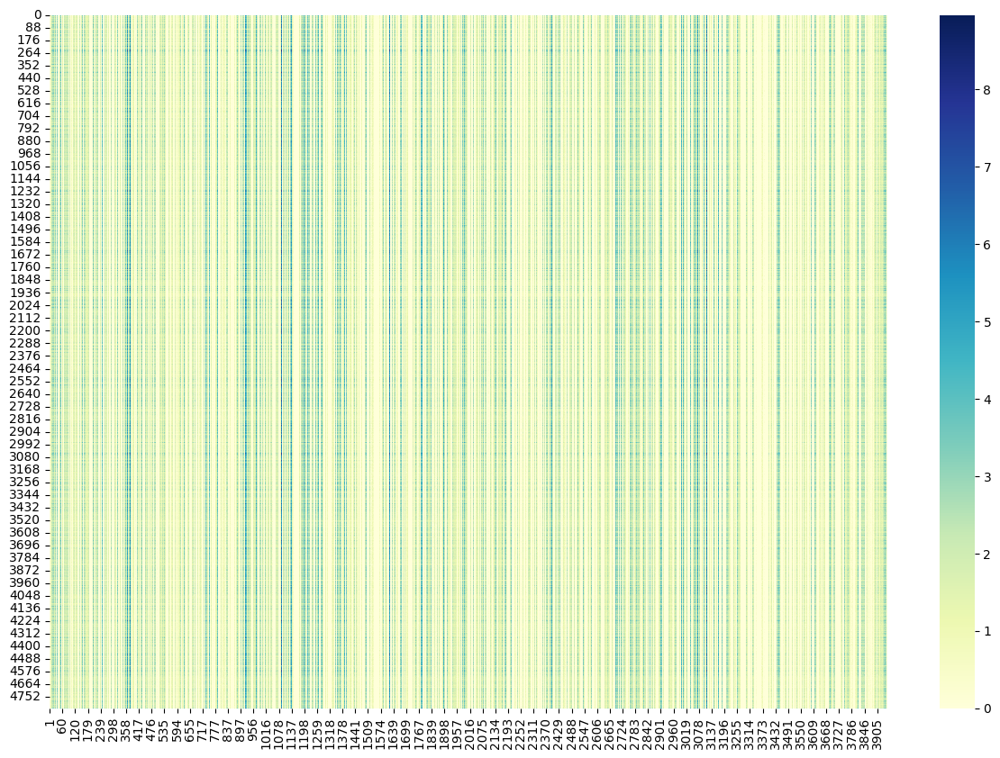

In [ ]:
fig, ax = plt.subplots(figsize=(15, 10))
sns.heatmap(df1, cmap='YlGnBu', ax=ax)

<Axes: >

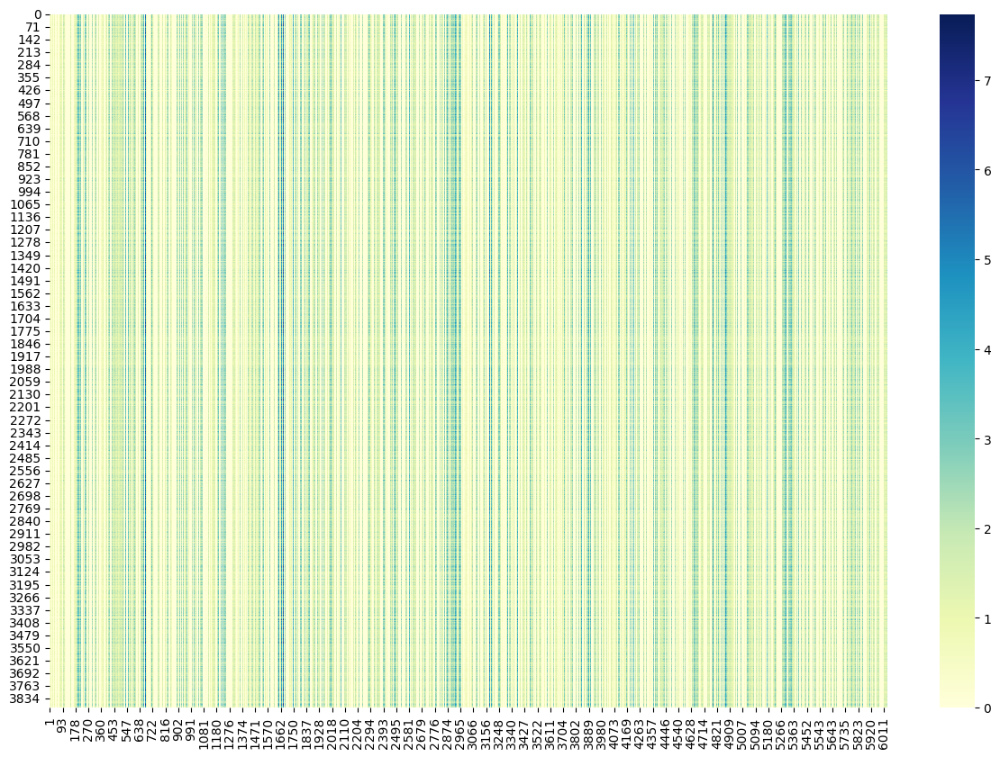

In [ ]:
fig, ax = plt.subplots(figsize=(15, 10))
sns.heatmap(df2, cmap='YlGnBu', ax=ax)

<Axes: >

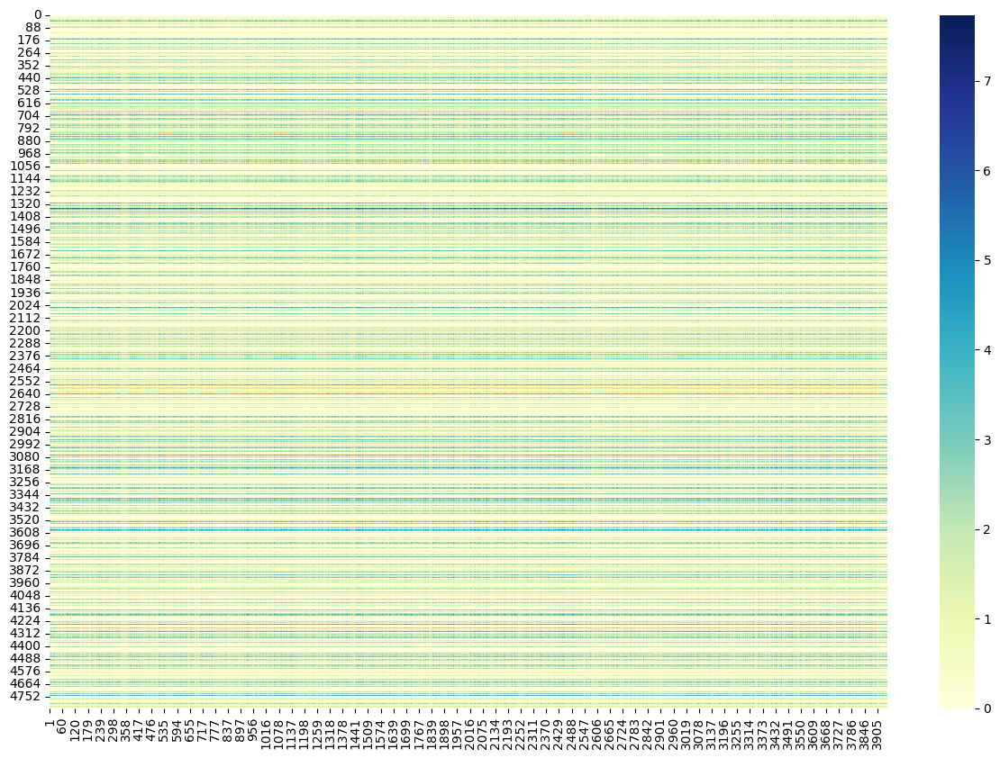

In [ ]:
fig, ax = plt.subplots(figsize=(15, 10))
sns.heatmap(df2_new, cmap='YlGnBu', ax=ax)

<Axes: >

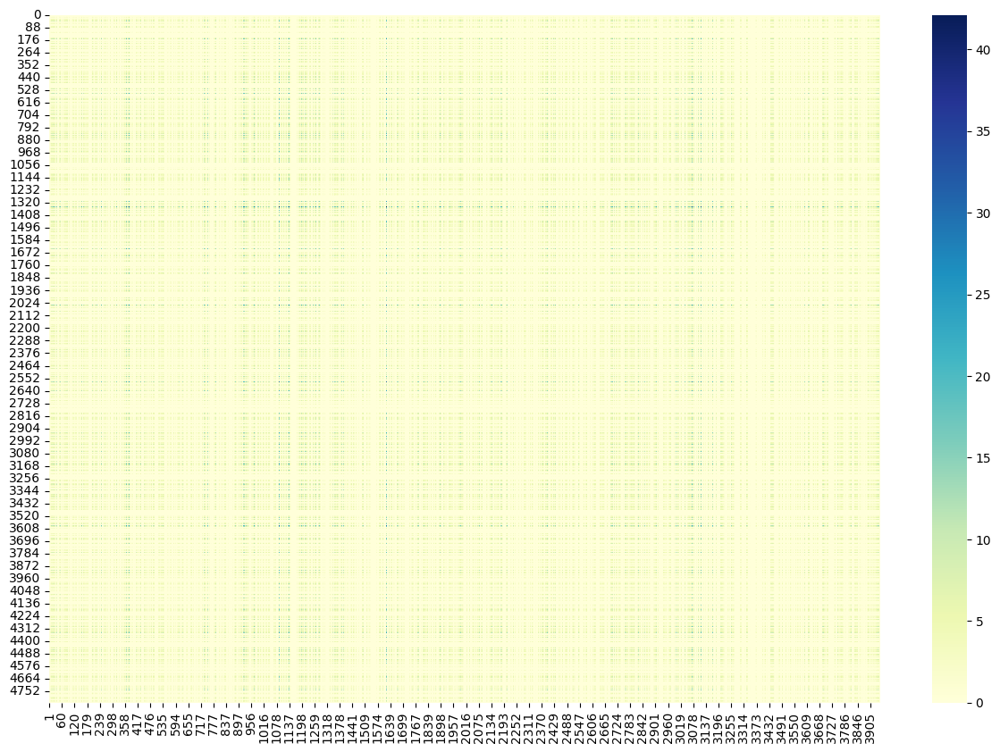

In [ ]:
fig, ax = plt.subplots(figsize=(15, 10))
sns.heatmap(result, cmap='YlGnBu', ax=ax)

<Axes: xlabel='MovieID', ylabel='UserID'>

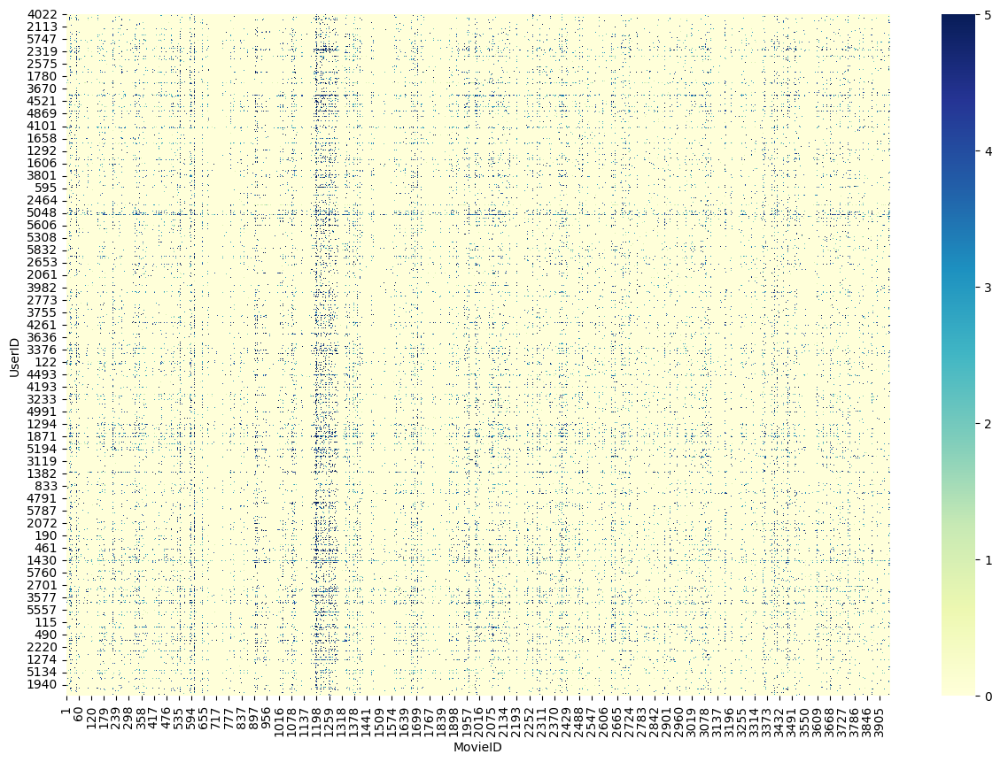

In [ ]:
fig, ax = plt.subplots(figsize=(15, 10))
sns.heatmap(y_train, cmap='YlGnBu', ax=ax)

### gan을 학습시킬 때 transpose를 번갈아 진행하며 여러 학습이 가능하도록 해보자

In [ ]:
latent_dim1 = 100 # 3883
output_dim1 = 3883
latent_dim2 = 100 # 4832
output_dim2 = 4832

epochs = 50

batch_size1 = 4832
batch_size2 = 3883

lr_d = 0.00006
lr_g = 0.00004


n_iter_D = 1
n_iter_G = 2

In [ ]:
# generator 번갈아 학습

# 생성자 모델
Generator1 = Sequential()
Generator1.add(Dense(128, input_shape=(latent_dim1,), activation=LeakyReLU(0.2)))
Generator1.add(BatchNormalization())

Generator1.add(Dense(512, activation=LeakyReLU(0.2)))
Generator1.add(BatchNormalization())
Generator1.add(Dropout(0.3))

Generator1.add(Dense(1024, activation=LeakyReLU(0.2)))
Generator1.add(BatchNormalization())
Generator1.add(Dropout(0.3))

#output_dim보다 커야함
Generator1.add(Dense(2048, activation=LeakyReLU(0.2)))
Generator1.add(BatchNormalization())

Generator1.add(Dense(output_dim1, activation='relu'))


# 생성자 모델
Generator2 = Sequential()
Generator2.add(Dense(128, input_shape=(latent_dim2,), activation=LeakyReLU(0.2)))
Generator2.add(BatchNormalization())

Generator2.add(Dense(512, activation=LeakyReLU(0.2)))
Generator2.add(BatchNormalization())
Generator2.add(Dropout(0.3))

Generator2.add(Dense(1024, activation=LeakyReLU(0.2)))
Generator2.add(BatchNormalization())
Generator2.add(Dropout(0.3))

#output_dim보다 커야함
Generator2.add(Dense(2048, activation=LeakyReLU(0.2)))
Generator2.add(BatchNormalization())

Generator2.add(Dense(output_dim2, activation='relu'))


# 판별자 모델
Discriminator = Sequential()
Discriminator.add(Dense(2048, input_shape=(output_dim1,), activation=LeakyReLU(0.2)))
Discriminator.add(BatchNormalization())

Discriminator.add(Dense(1024, activation=LeakyReLU(0.2)))
Discriminator.add(BatchNormalization())
Discriminator.add(Dropout(0.3))

Discriminator.add(Dense(512, activation=LeakyReLU(0.2)))
Discriminator.add(BatchNormalization())
Discriminator.add(Dropout(0.3))

Discriminator.add(Dense(128, activation=LeakyReLU(0.2)))
Discriminator.add(BatchNormalization())
Discriminator.add(Dropout(0.3))

Discriminator.add(Dense(1, activation='sigmoid'))


Doptimizer = tf.keras.optimizers.Adam(lr_d)
Goptimizer1 = tf.keras.optimizers.Adam(lr_g)
Goptimizer2 = tf.keras.optimizers.Adam(lr_g)


def get_noise(batch_size,latent_dim):
    return tf.random.normal([batch_size,latent_dim])

loss_D_list = []
loss_G_list = []
loss_GD_list = []

for epoch in tf.range(epochs):
    batch_input = y_train.sample(n=batch_size1)
    missing = batch_input.applymap(lambda x: 1 if x > 0 else 0)
    missing_reshaped = missing.transpose()

    inputs = tf.Variable(batch_input.values, tf.float32)
    missing_array = tf.Variable(missing.values, tf.float32)
    inputs = tf.cast(inputs, tf.float32)
    missing_array = tf.cast(missing_array, tf.float32)

    missing_array_reshaped = tf.Variable(missing_reshaped.values, tf.float32)
    missing_array_reshaped = tf.cast(missing_array_reshaped, tf.float32)

    check_g = True

    #with tf.GradientTape() as t1, tf.GradientTape() as t2:
    with tf.GradientTape(persistent=True) as t1, tf.GradientTape(persistent=True) as t2:

      for iter in range(n_iter_G):
        generated_data1 = Generator1(get_noise(batch_size1,latent_dim1))
        G1 = generated_data1 * missing_array

        generated_data2 = Generator2(get_noise(batch_size2,latent_dim2))
        G2 = generated_data2 * missing_array_reshaped
        G2 =tf.transpose(G2)

        # 요소별 곱 -> 요소별 합
        G = G1 * G2
        #G = G1 + G2

        Z = Discriminator(G)

        loss_G = -tf.reduce_mean(tf.math.log(Z))

        if check_g == True:
          Ggradients1 = t2.gradient(loss_G,Generator1.trainable_variables)
          #inf 방지??
          Ggradients1 = [tf.clip_by_value(grad, -1.0, 1.0) for grad in Ggradients1]
          Goptimizer1.apply_gradients(zip(Ggradients1, Generator1.trainable_variables))
          check_g = False

        else:
          Ggradients2 = t2.gradient(loss_G,Generator2.trainable_variables)
          #inf 방지??
          Ggradients2 = [tf.clip_by_value(grad, -1.0, 1.0) for grad in Ggradients2]
          Goptimizer2.apply_gradients(zip(Ggradients2, Generator2.trainable_variables))
          check_g = True

      for iter in range(n_iter_D):
        generated_data1 = Generator1(get_noise(batch_size1,latent_dim1))
        G1 = generated_data1 * missing_array

        generated_data2 = Generator2(get_noise(batch_size2,latent_dim2))
        G2 = generated_data2 * missing_array_reshaped
        G2 =tf.transpose(G2)

        # 요소별 곱 -> 요소별 합
        G = G1 * G2
        #G = G1 + G2


        Z = Discriminator(G)

        R = Discriminator(inputs)
        # 둘 다 minimize
        loss_D = -tf.reduce_mean(tf.math.log(R) + tf.math.log(1 - Z))
        #loss_G = -tf.reduce_mean(tf.math.log(Z))
        Dgradients = t1.gradient(loss_D, Discriminator.trainable_variables)
        #inf 방지??
        Dgradients = [tf.clip_by_value(grad, -1.0, 1.0) for grad in Dgradients]
        Doptimizer.apply_gradients(zip(Dgradients, Discriminator.trainable_variables))

    loss_D_list.append(loss_D)
    loss_G_list.append(loss_G)
    loss_GD_list.append(loss_D+loss_G)

    del t1
    del t2

    print(f'Epoch: {epoch}, Discriminator Loss: {loss_D}, Generator Loss: {loss_G}, GAN Loss: {loss_D+loss_G}')
    #print(f"epoch: {epoch} d_loss: {loss_D} g_loss: {loss_G}")

Epoch: 0, Discriminator Loss: 1.310590386390686, Generator Loss: 0.6930591464042664, GAN Loss: 2.0036494731903076
Epoch: 1, Discriminator Loss: 1.0033546686172485, Generator Loss: 0.6944495439529419, GAN Loss: 1.6978042125701904
Epoch: 2, Discriminator Loss: 0.8768455982208252, Generator Loss: 0.6968364715576172, GAN Loss: 1.5736820697784424
Epoch: 3, Discriminator Loss: 0.8098561763763428, Generator Loss: 0.6994412541389465, GAN Loss: 1.5092973709106445
Epoch: 4, Discriminator Loss: 0.7689293622970581, Generator Loss: 0.7023265957832336, GAN Loss: 1.4712560176849365
Epoch: 5, Discriminator Loss: 0.7416457533836365, Generator Loss: 0.7053928971290588, GAN Loss: 1.4470386505126953
Epoch: 6, Discriminator Loss: 0.7224392890930176, Generator Loss: 0.7085226774215698, GAN Loss: 1.4309619665145874
Epoch: 7, Discriminator Loss: 0.708114743232727, Generator Loss: 0.7117080688476562, GAN Loss: 1.4198228120803833
Epoch: 8, Discriminator Loss: 0.6971530318260193, Generator Loss: 0.71516942977905

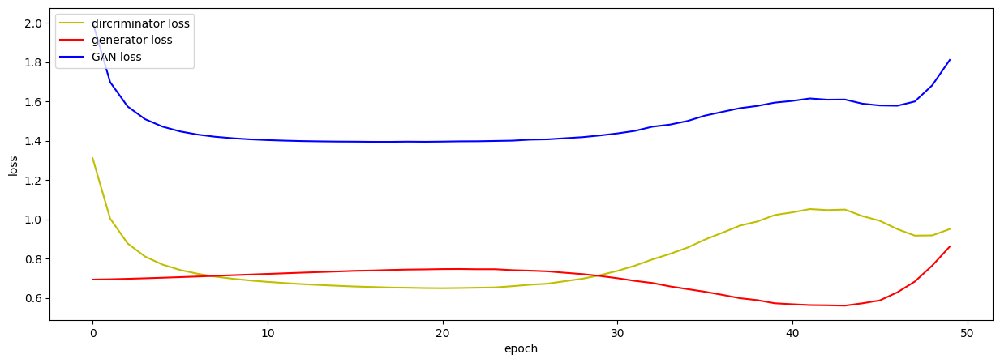

In [ ]:
import matplotlib.pyplot as plt

fig, loss_ax = plt.subplots(figsize = (15,5))

loss_ax.plot(loss_D_list, 'y', label = 'dircriminator loss')
loss_ax.plot(loss_G_list, 'r', label = 'generator loss')
loss_ax.plot(loss_GD_list, 'b', label = 'GAN loss')

loss_ax.set_xlabel('epoch')
loss_ax.set_ylabel('loss')
loss_ax.legend(loc='upper left')

plt.show()

In [ ]:
generated_data1 = Generator1(get_noise(batch_size1,latent_dim1))
generated_data2 = Generator2(get_noise(batch_size2,latent_dim2))
generated_data2 =tf.transpose(generated_data2)
#요소별 곱 -> 요소별 합
new_generated_data = generated_data1 * generated_data2
#new_generated_data = generated_data1 + generated_data2

In [ ]:
df_ratings_new = pd.DataFrame(new_generated_data, columns = y_train.columns)
df_ratings_new.index = range(10001, 10001+len(df_ratings_new))
df_ratings_new = df_ratings_new.rename_axis("MovieID")

In [ ]:
df_ratings_new

MovieID,1,2,3,4,5,6,7,8,9,10,...,3943,3944,3945,3946,3947,3948,3949,3950,3951,3952
MovieID,,,,,,,,,,,,,,,,,,,,,
10001,2.059282,2.038499,0.000000,0.353048,2.053779,0.0,0.0,0.0,0.059344,0.0,...,1.396570,0.0,0.135604,2.460016,1.097608,1.876772,2.501239,0.0,0.620882,2.887822
10002,1.340419,1.153743,0.071238,0.209844,1.175900,0.0,0.0,0.0,0.176192,0.0,...,0.710262,0.0,0.043591,1.567589,0.368553,0.822308,1.420321,0.0,0.273690,1.630116
10003,2.583295,2.614659,0.000000,0.416817,3.304379,0.0,0.0,0.0,0.000000,0.0,...,1.574869,0.0,0.299807,3.119053,1.252046,2.330564,2.672278,0.0,0.954420,3.269369
10004,3.286873,2.207474,0.000000,0.063561,2.699002,0.0,0.0,0.0,0.620362,0.0,...,1.349333,0.0,0.080299,2.852660,1.334260,2.177240,2.602467,0.0,0.788911,3.117193
10005,3.323672,2.403415,0.000000,0.352587,2.907479,0.0,0.0,0.0,0.260587,0.0,...,1.589441,0.0,0.061374,3.224448,1.484816,2.393210,2.852985,0.0,0.744189,3.181737
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14828,0.563580,0.046831,0.000000,0.000000,0.204465,0.0,0.0,0.0,0.000000,0.0,...,0.031756,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.009580
14829,2.163111,1.544480,0.000000,0.322821,2.306419,0.0,0.0,0.0,0.000000,0.0,...,1.006878,0.0,0.133666,1.833472,0.683516,1.833133,1.883148,0.0,0.718349,2.521543
14830,3.883090,2.631986,0.016889,0.440864,2.953846,0.0,0.0,0.0,0.068888,0.0,...,1.689108,0.0,0.157314,3.299504,1.379902,3.103256,3.200737,0.0,1.281618,4.469738


In [ ]:
max_val = df_ratings_new.max().max()
print(max_val)

12.6507015


In [ ]:
zero_cols = (df_ratings_new == 0).all(axis=0).sum()
print(zero_cols)

687


In [ ]:
#저장
df_ratings_new.to_csv(path + 'df_new.csv', index=False)

In [ ]:
#저장 _ 예비
df_ratings_new.to_csv(path + 'df_new1.csv', index=False)

In [ ]:
#저장 _ 예비
df_ratings_new.to_csv(path + 'df_new2.csv', index=False)

In [ ]:
#저장 _ 예비
df_ratings_new.to_csv(path + 'df_new3.csv', index=False)

In [ ]:
#저장_add
df_ratings_new.to_csv(path + 'df_new_add.csv', index=False)

### 불러오기

In [ ]:
#불러오기
df_ratings_new = pd.read_csv(path + "df_new.csv")

In [ ]:
#불러오기
df_ratings_new = pd.read_csv(path + "df_new1.csv")

In [ ]:
#불러오기
df_ratings_new = pd.read_csv(path + "df_new2.csv")

In [ ]:
#불러오기
df_ratings_new = pd.read_csv(path + "df_new3.csv")

In [ ]:
#불러오기_add
df_ratings_new = pd.read_csv(path + "df_new_add.csv")

In [ ]:
df_ratings_new.index.name = 'UserID'
df_ratings_new.columns.name = 'MovieID'
df_ratings_new.name = 'Rating'

In [ ]:
max_val = df_ratings_new.max().max()
print(max_val)

12.6507015


In [ ]:
zero_cols = (df_ratings_new == 0).all(axis=0).sum()
print(zero_cols)

687


<Axes: >

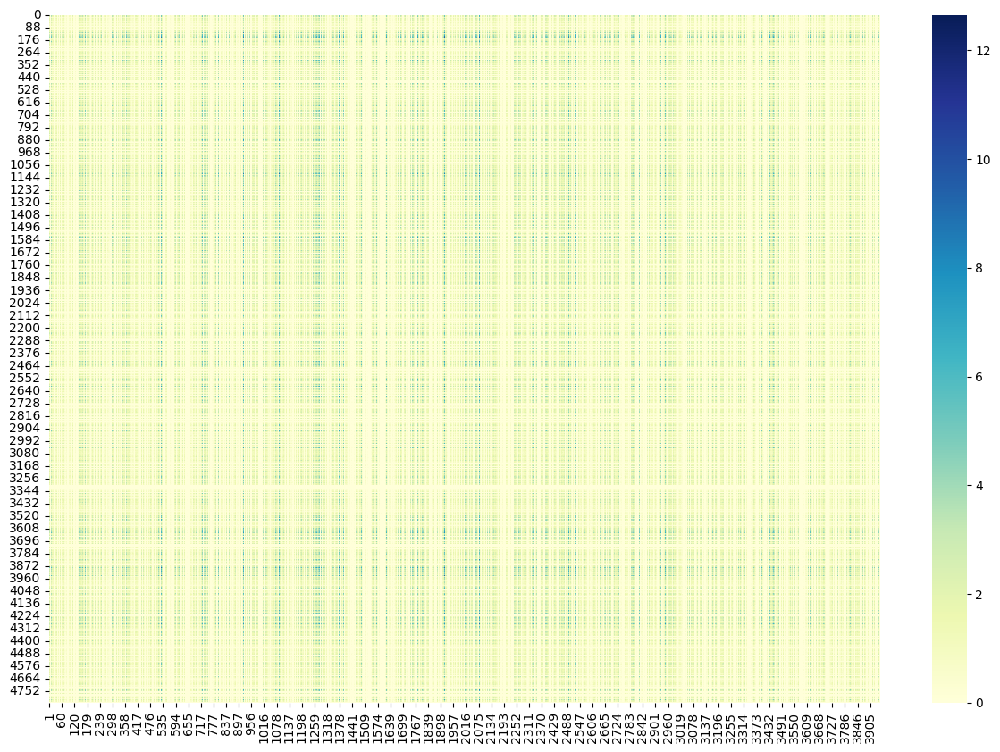

In [ ]:
fig, ax = plt.subplots(figsize=(15, 10))
sns.heatmap(df_ratings_new, cmap='YlGnBu', ax=ax)

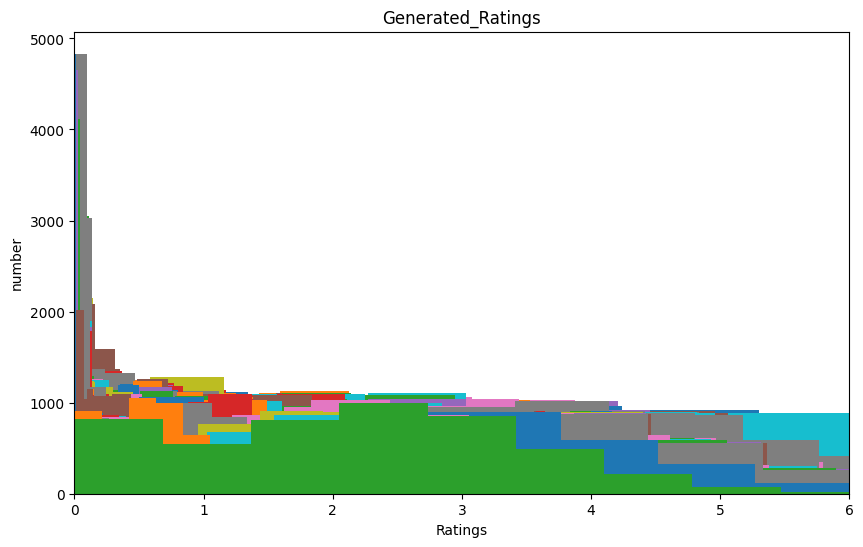

In [ ]:
#df.replace(0, float('nan'), inplace = True)
plt.figure(figsize=(10, 6))
for column_name in df_ratings_new.columns:
  plt.hist(df_ratings_new[column_name])
plt.xlim(0, 6)
plt.xlabel('Ratings') # x축 라벨 설정
plt.ylabel('number') # y축 라벨 설정
plt.title('Generated_Ratings') # 그래프 제목 설정
plt.show() # 그래프 출력

In [ ]:
#df_ratings_new = np.ceil(df_ratings_new) #ceil, floor, round
df_ratings_int = np.ceil(df_ratings_new)
df_ratings_int[df_ratings_int >  5] = 5

In [ ]:
counts = df_ratings_int.stack().value_counts()

In [ ]:
counts

0.0    7770019
1.0    5717580
2.0    3291452
3.0    1356581
4.0     440528
5.0     186496
dtype: int64

In [ ]:
counts = ratings_df.stack().value_counts()

In [ ]:
counts

0    22453111
4      348971
3      261197
5      226310
2      107557
1       56174
dtype: int64

In [ ]:
df_ratings_int = df_ratings_int.astype(int)

In [ ]:
df_ratings_int

,1,2,3,4,5,6,7,8,9,10,...,3943,3944,3945,3946,3947,3948,3949,3950,3951,3952
0,3,3,0,1,3,0,0,0,1,0,...,2,0,1,3,2,2,3,0,1,3
1,2,2,1,1,2,0,0,0,1,0,...,1,0,1,2,1,1,2,0,1,2
2,3,3,0,1,4,0,0,0,0,0,...,2,0,1,4,2,3,3,0,1,4
3,4,3,0,1,3,0,0,0,1,0,...,2,0,1,3,2,3,3,0,1,4
4,4,3,0,1,3,0,0,0,1,0,...,2,0,1,4,2,3,3,0,1,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4827,1,1,0,0,1,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,1
4828,3,2,0,1,3,0,0,0,0,0,...,2,0,1,2,1,2,2,0,1,3
4829,4,3,1,1,3,0,0,0,1,0,...,2,0,1,4,2,4,4,0,2,5
4830,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


<Axes: >

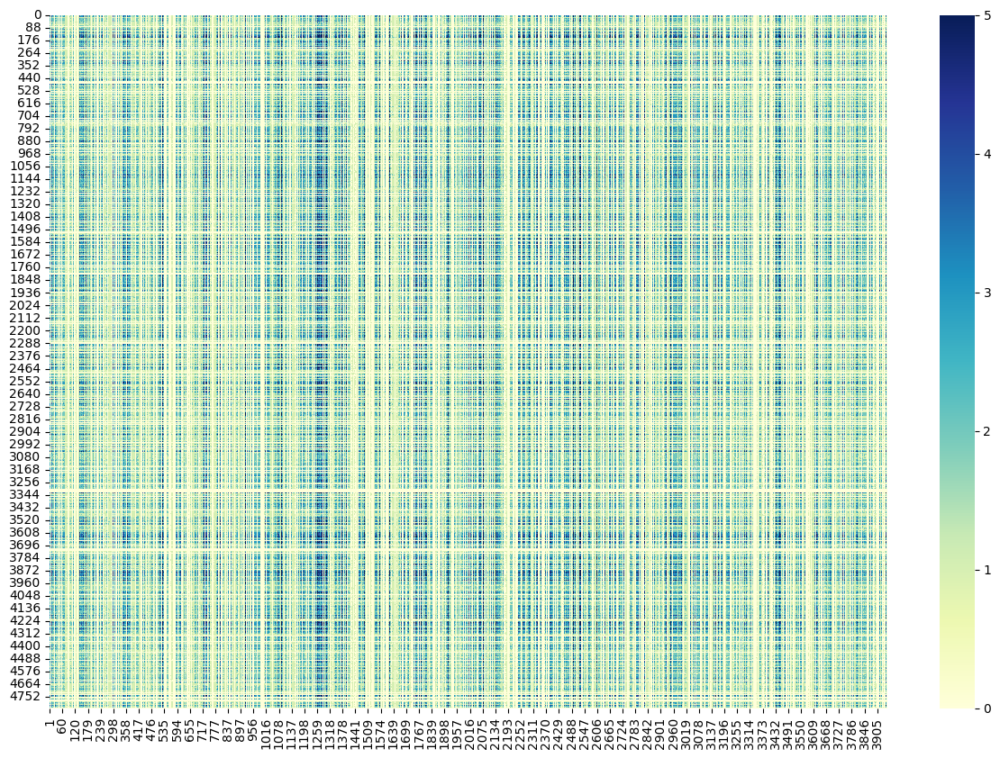

In [ ]:
fig, ax = plt.subplots(figsize=(15, 10))
sns.heatmap(df_ratings_int, cmap='YlGnBu', ax=ax)

In [ ]:
df_new = df_ratings_int.reset_index().melt(id_vars='UserID', value_name='Rating', var_name='MovieID').dropna()

In [ ]:
df_new = df_new[df_new['Rating'] != 0]

In [ ]:
df_new

,UserID,MovieID,Rating
0,0,1,3.0
1,1,1,2.0
2,2,1,3.0
3,3,1,4.0
4,4,1,4.0
...,...,...,...
18762650,4826,3952,2.0
18762651,4827,3952,1.0
18762652,4828,3952,3.0
18762653,4829,3952,5.0


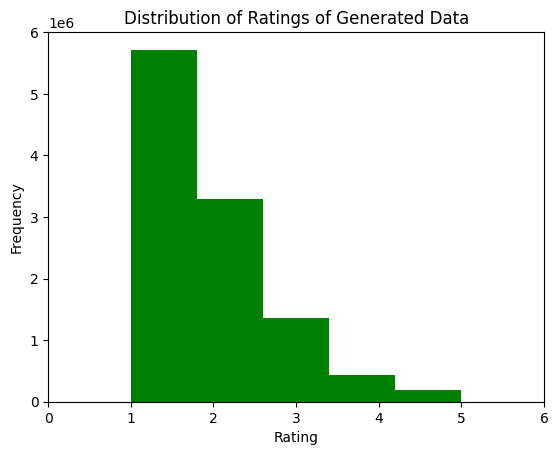

In [ ]:
#df.replace(0, float('nan'), inplace = True)
plt.xlim(0, 6)
plt.hist(df_new['Rating'], bins = 5, color = 'green')
plt.xlabel('Rating')
plt.ylabel('Frequency')
plt.title('Distribution of Ratings of Generated Data')
plt.show()

In [ ]:
df1 = pd.read_csv(path + "df1.csv")

In [ ]:
df1

,1,2,3,4,5,6,7,8,9,10,...,3943,3944,3945,3946,3947,3948,3949,3950,3951,3952
0,4.170675,0.0,3.426849,2.987852,1.885616,0.697231,0.010030,0.000000,0.209767,2.060371,...,2.663805,0.217377,0.536345,2.845673,0.0,1.751488,3.032351,0.0,2.834946,3.742786
1,4.212559,0.0,3.516029,3.202918,1.735626,0.753253,0.277761,0.167930,0.324644,2.315302,...,2.476068,0.242783,0.750102,2.986611,0.0,2.200967,3.374759,0.0,3.160069,3.857338
2,2.762691,0.0,2.406533,1.981527,1.074633,0.518163,0.193772,0.000000,0.170708,1.520749,...,1.848574,0.105979,0.351658,1.951380,0.0,1.448307,1.934589,0.0,1.975851,2.516751
3,4.725677,0.0,3.717033,2.937557,1.748105,0.895152,0.195084,0.022706,0.436300,2.186052,...,2.464764,0.183450,0.524074,2.984312,0.0,1.937213,3.096065,0.0,3.141900,4.034593
4,4.177773,0.0,3.170686,3.269654,1.669626,0.771929,0.199591,0.186966,0.386281,2.261222,...,2.526880,0.179387,0.477820,2.671085,0.0,2.157297,3.135060,0.0,2.814315,3.847074
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4827,4.001986,0.0,2.847567,2.670664,1.317112,0.819963,0.209155,0.122400,0.517264,1.996981,...,2.124464,0.460961,0.576364,2.746654,0.0,1.750121,2.740919,0.0,2.502673,3.179631
4828,3.282225,0.0,3.074066,2.218766,0.984255,0.675148,0.000000,0.067327,0.094801,2.022424,...,1.865754,0.044981,0.635559,2.423964,0.0,1.631673,2.382858,0.0,2.372641,3.079810
4829,3.756860,0.0,3.184695,2.743967,1.537539,0.764780,0.000000,0.096546,0.403457,1.934378,...,2.080751,0.097735,0.747148,2.514422,0.0,1.951229,2.795939,0.0,2.551382,3.154736
4830,4.532990,0.0,3.521552,3.327230,1.874230,0.733372,0.284301,0.149166,0.307086,2.447977,...,2.608537,0.100426,0.902218,3.037988,0.0,2.320524,3.278746,0.0,3.161000,4.156858


In [ ]:
df1 = np.ceil(df1)
df1[df1 > 5] = 5

In [ ]:
counts = df1.stack().value_counts()

In [ ]:
counts

0.0    7587704
2.0    4003833
1.0    3271135
3.0    2831717
4.0     845061
5.0     223206
dtype: int64

<Axes: xlabel='MovieID', ylabel='UserID'>

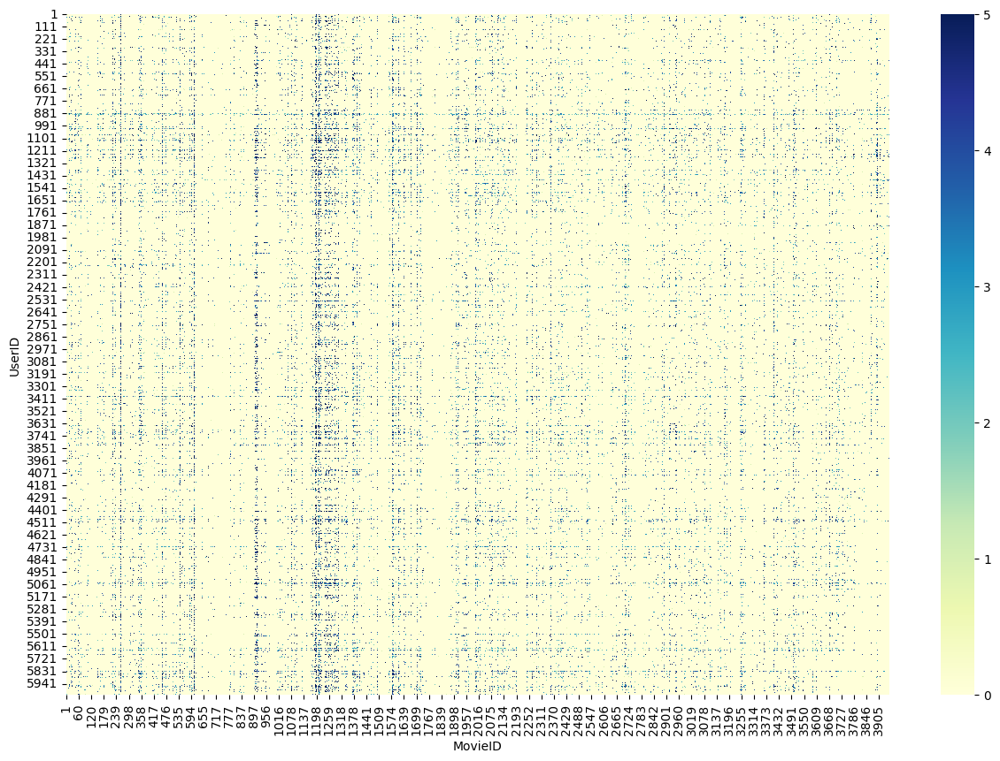

In [ ]:
fig, ax = plt.subplots(figsize=(15, 10))
sns.heatmap(ratings_df, cmap='YlGnBu', ax=ax)

<Axes: >

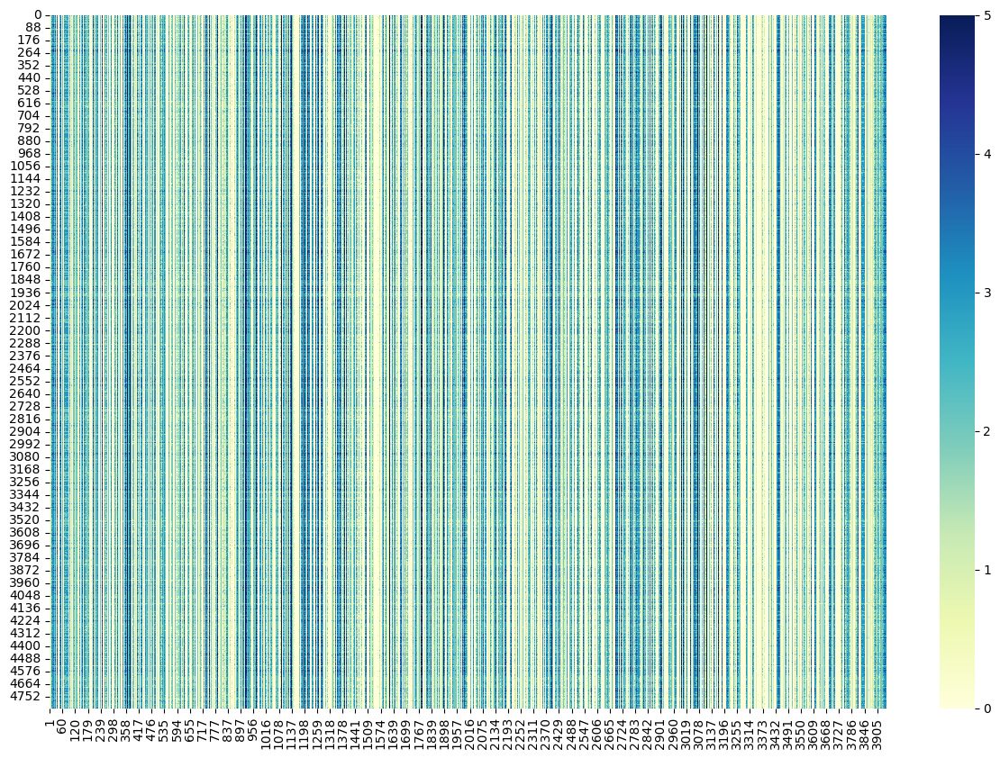

In [ ]:
fig, ax = plt.subplots(figsize=(15, 10))
sns.heatmap(df1, cmap='YlGnBu', ax=ax)

In [ ]:
from sklearn.metrics import mean_squared_error
from sklearn.metrics.pairwise import cosine_similarity


# 두 피벗 테이블 데이터프레임을 평탄화하여 배열로 변환
array1 = y_train.values.flatten()
array2 = df_ratings_new.values.flatten()

# 평균 제곱 오차 계산
mse1 = mean_squared_error(array1, array2)
# 두 매트릭스 A와 B 간의 코사인 유사도 계산
similarity_matrix = cosine_similarity(y_train, df_ratings_new)

In [ ]:
from sklearn.metrics import mean_squared_error

# 두 피벗 테이블 데이터프레임을 평탄화하여 배열로 변환
array1 = y_train.values.flatten()
array2 = df1.values.flatten()

# 평균 제곱 오차 계산
mse2 = mean_squared_error(array1, array2)

In [ ]:
mse1

1.0210982284227428

In [ ]:
mse1

1.6401556768083558

In [ ]:
mse2

3.4207491732513775

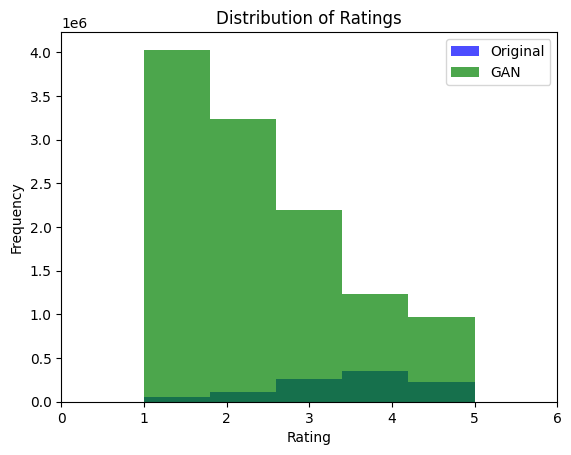

In [ ]:
#df.replace(0, float('nan'), inplace = True)
plt.xlim(0, 6)
plt.hist(ratings['Rating'], bins = 5, color = 'blue', alpha=0.7, label = 'Original')
plt.hist(df_new['Rating'], bins = 5, color = 'green', alpha = 0.7, label = 'GAN')
plt.xlabel('Rating')
plt.ylabel('Frequency')
plt.legend()
plt.title('Distribution of Ratings')
plt.show()

##결측벡터

In [ ]:
latent_dim = 100
output_dim = 3883
epochs = 50
batch_size = 4832
lr_d = 0.00005
lr_g = 0.00003
n_iter_D = 1
n_iter_G = 1

In [ ]:
# 생성자 모델
Generator_fake = Sequential()
Generator_fake.add(Dense(128, input_shape=(latent_dim,), activation=LeakyReLU(0.2)))
Generator_fake.add(BatchNormalization())

Generator_fake.add(Dense(512, activation=LeakyReLU(0.2)))
Generator_fake.add(BatchNormalization())
Generator_fake.add(Dropout(0.3))

Generator_fake.add(Dense(2048, activation=LeakyReLU(0.2)))
Generator_fake.add(BatchNormalization())
Generator_fake.add(Dropout(0.3))

#output_dim보다 커야함
Generator_fake.add(Dense(4096, activation=LeakyReLU(0.2)))
Generator_fake.add(BatchNormalization())

Generator_fake.add(Dense(output_dim, activation='relu'))


# 판별자 모델
Discriminator = Sequential()
Discriminator.add(Dense(1028, input_shape=(output_dim,), activation=LeakyReLU(0.2)))
Discriminator.add(BatchNormalization())

Discriminator.add(Dense(512, activation=LeakyReLU(0.2)))
Discriminator.add(BatchNormalization())
Discriminator.add(Dropout(0.3))

Discriminator.add(Dense(256, activation=LeakyReLU(0.2)))
Discriminator.add(BatchNormalization())
Discriminator.add(Dropout(0.3))

Discriminator.add(Dense(128, activation=LeakyReLU(0.2)))
Discriminator.add(BatchNormalization())
Discriminator.add(Dropout(0.3))

Discriminator.add(Dense(1, activation='sigmoid'))


Doptimizer = tf.keras.optimizers.Adam(lr_d)
Goptimizer = tf.keras.optimizers.Adam(lr_g)


def get_noise(batch_size,latent_dim):
    return tf.random.normal([batch_size,latent_dim])

loss_D_list = []
loss_G_list = []
loss_GD_list = []

for epoch in tf.range(epochs):
    batch_input = X_train.sample(n=batch_size)

    inputs = tf.Variable(batch_input.values, tf.float32)
    inputs = tf.cast(inputs, tf.float32)

    #with tf.GradientTape() as t1, tf.GradientTape() as t2:
    with tf.GradientTape(persistent=True) as t1, tf.GradientTape(persistent=True) as t2:


      for iter in range(n_iter_G):
        generated_data = Generator_fake(get_noise(batch_size,latent_dim))
        Z = Discriminator(generated_data)
        loss_G = -tf.reduce_mean(tf.math.log(Z))
        Ggradients = t2.gradient(loss_G,Generator_fake.trainable_variables)
        #inf 방지??
        Ggradients = [tf.clip_by_value(grad, -1.0, 1.0) for grad in Ggradients]
        Goptimizer.apply_gradients(zip(Ggradients, Generator_fake.trainable_variables))

      for iter in range(n_iter_D):
        generated_data = Generator_fake(get_noise(batch_size,latent_dim))
        Z = Discriminator(generated_data)
        R = Discriminator(inputs)
        # 둘 다 minimize
        loss_D = -tf.reduce_mean(tf.math.log(R) + tf.math.log(1 - Z))
        #loss_G = -tf.reduce_mean(tf.math.log(Z))
        Dgradients = t1.gradient(loss_D, Discriminator.trainable_variables)
        #inf 방지??
        Dgradients = [tf.clip_by_value(grad, -1.0, 1.0) for grad in Dgradients]
        Doptimizer.apply_gradients(zip(Dgradients, Discriminator.trainable_variables))

    loss_D_list.append(loss_D)
    loss_G_list.append(loss_G)
    loss_GD_list.append(loss_D+loss_G)

    print(f'Epoch: {epoch}, Discriminator Loss: {loss_D}, Generator Loss: {loss_G}, GAN Loss: {loss_D+loss_G}')
    #print(f"epoch: {epoch} d_loss: {loss_D} g_loss: {loss_G}")

Epoch: 0, Discriminator Loss: 1.4166033267974854, Generator Loss: 0.6763254404067993, GAN Loss: 2.092928886413574
Epoch: 1, Discriminator Loss: 1.409048318862915, Generator Loss: 0.6486455202102661, GAN Loss: 2.0576939582824707
Epoch: 2, Discriminator Loss: 1.4034217596054077, Generator Loss: 0.6252524256706238, GAN Loss: 2.0286741256713867
Epoch: 3, Discriminator Loss: 1.4018796682357788, Generator Loss: 0.6047573089599609, GAN Loss: 2.0066370964050293
Epoch: 4, Discriminator Loss: 1.402521014213562, Generator Loss: 0.5861242413520813, GAN Loss: 1.988645315170288
Epoch: 5, Discriminator Loss: 1.4072283506393433, Generator Loss: 0.5690364837646484, GAN Loss: 1.9762648344039917
Epoch: 6, Discriminator Loss: 1.4132122993469238, Generator Loss: 0.5522767305374146, GAN Loss: 1.9654890298843384
Epoch: 7, Discriminator Loss: 1.4185960292816162, Generator Loss: 0.5388864278793335, GAN Loss: 1.9574824571609497
Epoch: 8, Discriminator Loss: 1.4235612154006958, Generator Loss: 0.5263845920562744

In [ ]:
df_missing_create = pd.DataFrame(generated_data, columns = ratings_df.columns)
df_missing_create.index = range(10001, 10001+len(df_missing_create))
df_missing_create = df_missing_create.rename_axis("UserID")

In [ ]:
df_missing_create

MovieID,1,2,3,4,5,6,7,8,9,10,...,3943,3944,3945,3946,3947,3948,3949,3950,3951,3952
UserID,,,,,,,,,,,,,,,,,,,,,
10001,0.754186,0.473692,0.0,0.0,0.270983,0.000000,0.0,0.000000,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.008305,0.775502,0.691053,0.0,0.151335,0.076150
10002,0.800731,0.461221,0.0,0.0,0.300253,0.039978,0.0,0.000000,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.044576,0.739649,0.742151,0.0,0.059943,0.017481
10003,0.817349,0.405904,0.0,0.0,0.256918,0.014523,0.0,0.000000,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.077688,0.771516,0.556402,0.0,0.015448,0.000000
10004,0.774685,0.401650,0.0,0.0,0.261858,0.000000,0.0,0.000000,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.000000,0.618500,0.622157,0.0,0.034631,0.021958
10005,0.838507,0.578494,0.0,0.0,0.302907,0.000000,0.0,0.000000,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.050765,0.852864,0.747998,0.0,0.140994,0.088596
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14828,0.689045,0.344311,0.0,0.0,0.237483,0.000000,0.0,0.000000,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.000000,0.535619,0.554896,0.0,0.129396,0.018416
14829,0.906556,0.666395,0.0,0.0,0.335636,0.000000,0.0,0.000000,0.0,0.002429,...,0.0,0.0,0.0,0.0,0.000000,0.801130,0.869432,0.0,0.135980,0.048669
14830,0.791937,0.500349,0.0,0.0,0.362395,0.000000,0.0,0.000000,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.015836,0.635916,0.753163,0.0,0.083183,0.002978


In [ ]:
max_val = df_missing_create.max().max()
print(max_val)

2.0147886


In [ ]:
zero_cols = (df_missing_create == 0).all(axis=0).sum()
print(zero_cols)

624


In [ ]:
df_missing = df_missing_create.copy()

In [ ]:
df_missing.to_csv(path + 'df_missing.csv', index=False)

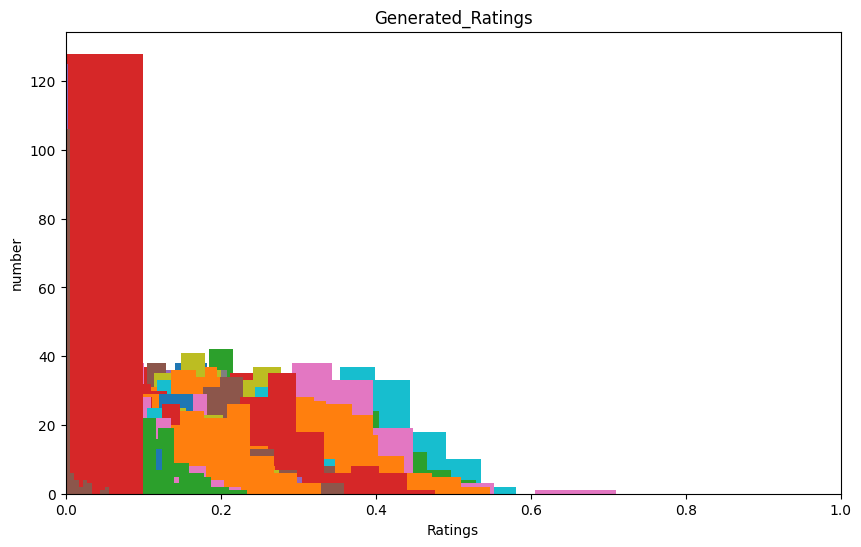

In [ ]:
#df.replace(0, float('nan'), inplace = True)
plt.figure(figsize=(10, 6))
for column_name in df_missing.columns:
  plt.hist(df_missing[column_name])
plt.xlim(0, 1)
plt.xlabel('Ratings') # x축 라벨 설정
plt.ylabel('number') # y축 라벨 설정
plt.title('Generated_Ratings') # 그래프 제목 설정
plt.show() # 그래프 출력

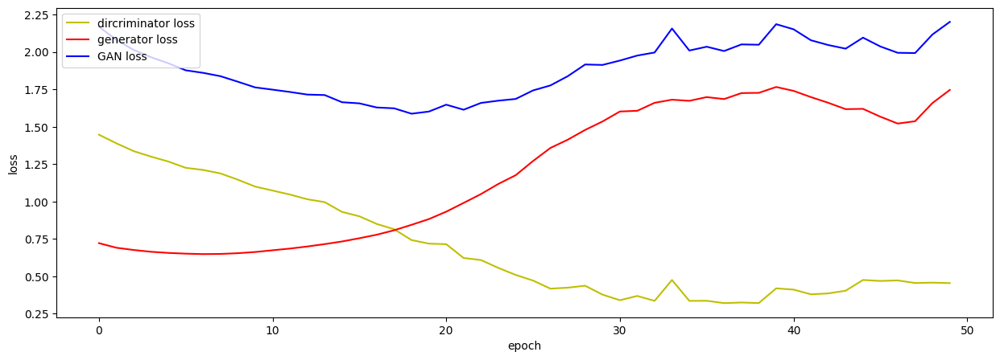

In [ ]:
import matplotlib.pyplot as plt

fig, loss_ax = plt.subplots(figsize = (15,5))

loss_ax.plot(loss_D_list, 'y', label = 'dircriminator loss')
loss_ax.plot(loss_G_list, 'r', label = 'generator loss')
loss_ax.plot(loss_GD_list, 'b', label = 'GAN loss')

loss_ax.set_xlabel('epoch')
loss_ax.set_ylabel('loss')
loss_ax.legend(loc='upper left')

plt.show()

In [ ]:
# 모델 저장
Generator_fake.save('/content/gdrive/MyDrive/소융캡/generator_missing.h5')

## 둘이 합치기

In [ ]:
df = pd.read_csv(path + 'df1.csv')
df_missing = pd.read_csv(path + 'df_missing.csv')

missing_df에 ['1':'0'] = [1000209 : 21384031] = [1:21] 비율로 존재

In [ ]:
values_flattened = df_missing.values.flatten()
top_values = sorted(set(values_flattened), reverse=True)[:1500000]

In [ ]:
values_flattened = np.where(np.isin(values_flattened, top_values), 1, 0)

# 1차원 배열을 다시 128 * 3706 크기의 데이터프레임으로 변환
df_missing_final = pd.DataFrame(values_flattened.reshape(4832, 3883), index=df.index, columns=df.columns)

In [ ]:
df_missing_final

,1,2,3,4,5,6,7,8,9,10,...,3943,3944,3945,3946,3947,3948,3949,3950,3951,3952
0,1,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,1,0,0,0
1,1,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,1,0,0,0
2,1,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,1,0,0,0
3,1,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,1,0,0,0
4,1,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4827,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,1,0,0,0
4828,1,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,1,0,0,0
4829,1,1,0,0,1,0,0,0,0,0,...,0,0,0,0,0,1,1,0,0,0
4830,1,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,1,0,0,0


In [ ]:
df_final = df_missing_final * df

In [ ]:
df_final = np.ceil(df_final)
df_final[df_final > 5] = 5

In [ ]:
counts = df_final.stack().value_counts()

In [ ]:
counts

0.0    17708576
2.0      483059
1.0      298327
3.0      214780
4.0       52446
5.0        5468
dtype: int64

In [ ]:
df_final = df_final.astype(int)

In [ ]:
df_final

,1,2,3,4,5,6,7,8,9,10,...,3943,3944,3945,3946,3947,3948,3949,3950,3951,3952
0,1,2,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,2,0,0,0
1,1,2,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,2,0,0,0
2,1,2,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,2,0,0,0
3,1,2,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,2,0,0,0
4,1,2,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,2,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4827,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,2,0,0,0
4828,1,2,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,2,0,0,0
4829,1,2,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,2,0,0,0
4830,1,2,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,2,0,0,0


<Axes: >

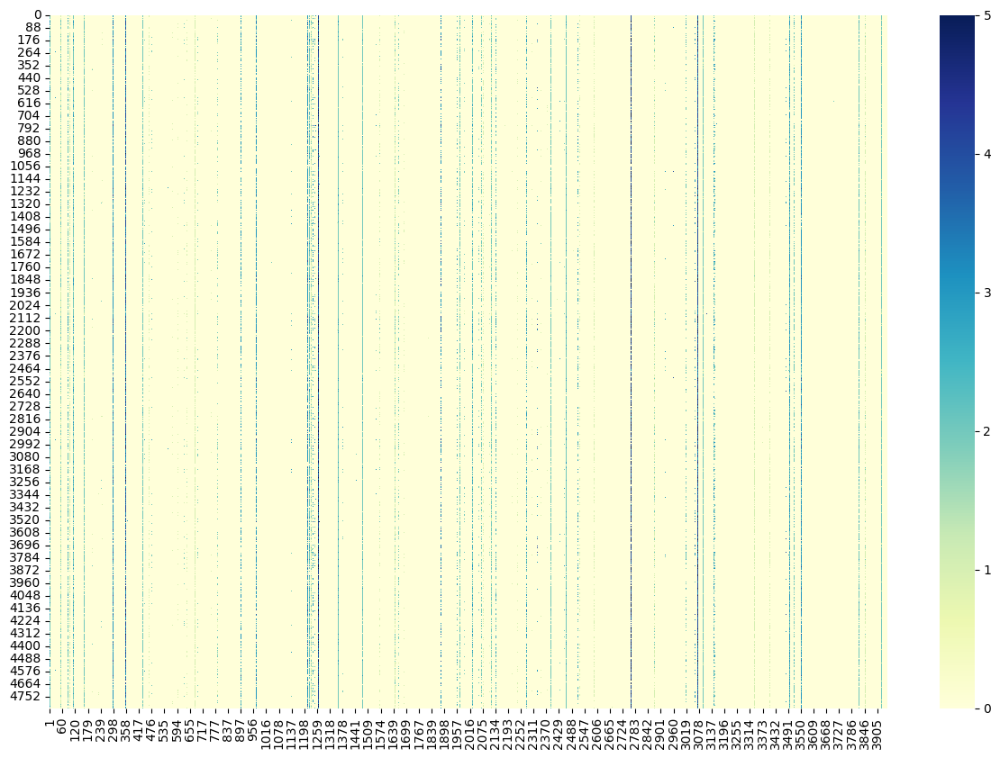

In [ ]:
fig, ax = plt.subplots(figsize=(15, 10))
sns.heatmap(df_final, cmap='YlGnBu', ax=ax)

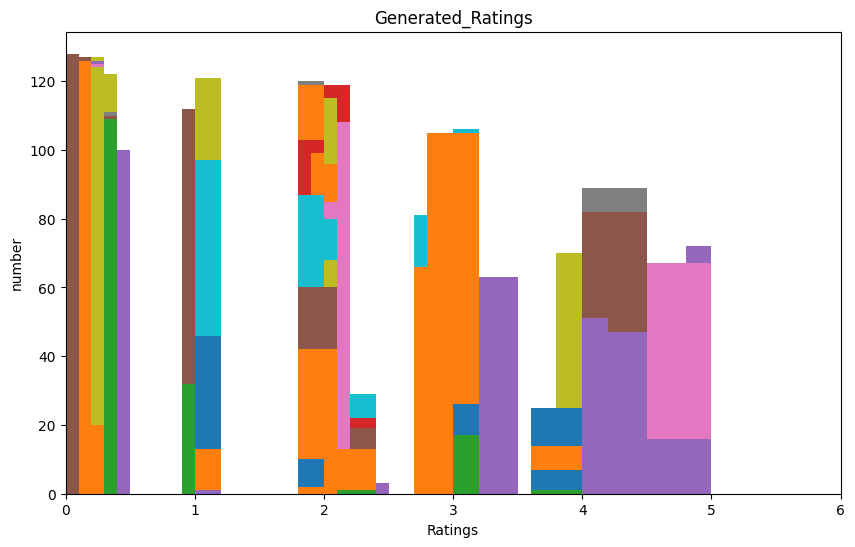

In [ ]:
#df.replace(0, float('nan'), inplace = True)
plt.figure(figsize=(10, 6))
for column_name in df_final.columns:
  plt.hist(df_final[column_name])
plt.xlim(0, 6)
plt.xlabel('Ratings') # x축 라벨 설정
plt.ylabel('number') # y축 라벨 설정
plt.title('Generated_Ratings') # 그래프 제목 설정
plt.show() # 그래프 출력

In [ ]:
df_final.index.name = 'UserID'
df_final.columns.name = 'MovieID'
df_final.name = 'Rating'

In [ ]:
df_fake = df_final.reset_index().melt(id_vars='UserID', value_name='Rating', var_name='MovieID').dropna()

In [ ]:
df_fake = df_fake[df_fake['Rating'] != 0]

In [ ]:
df_fake

,UserID,MovieID,Rating
0,0,1,1
1,1,1,1
2,2,1,1
3,3,1,1
4,4,1,1
...,...,...,...
18748155,4827,3949,2
18748156,4828,3949,2
18748157,4829,3949,2
18748158,4830,3949,2


In [ ]:
df_fake.to_csv(path + 'df_fake_original.csv', index=False)

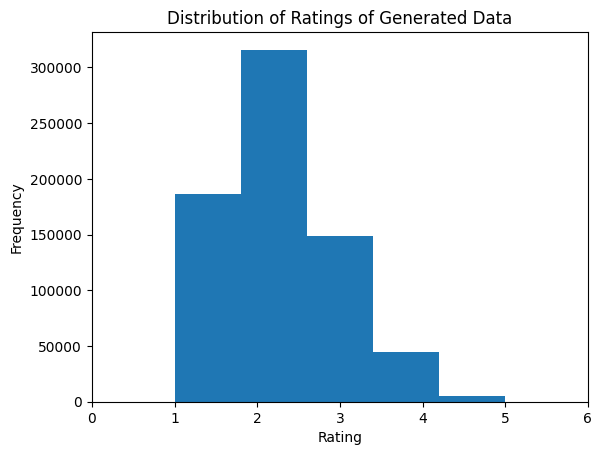

In [ ]:
#df.replace(0, float('nan'), inplace = True)
plt.xlim(0, 6)
colors = ['red', 'green', 'blue', 'orange', 'purple']
plt.hist(df_fake['Rating'], bins = 5)
plt.xlabel('Rating')
plt.ylabel('Frequency')
plt.title('Distribution of Ratings of Generated Data')
plt.show()

## 양 늘리기 (batch size 조정)


In [ ]:
from tensorflow.keras.models import load_model
generator_ratings = load_model('/content/gdrive/MyDrive/소융캡/generator_ratings.h5')
generator_missing = load_model('/content/gdrive/MyDrive/소융캡/generator_missing.h5')

In [ ]:
batch_size = 4096
latent_dim = 100

In [ ]:
def get_noise(batch_size,latent_dim):
    return tf.random.normal([batch_size,latent_dim])

In [ ]:
fake_ratings = generator_ratings(get_noise(batch_size,latent_dim))
fake_missing = generator_missing(get_noise(batch_size,latent_dim))

In [ ]:
df_ratings_create = pd.DataFrame(fake_ratings, columns = ratings_df.columns)
df_ratings_create.index = range(10001, 10001+len(df_ratings_create))
df_ratings_create = df_ratings_create.rename_axis("UserID")

In [ ]:
max_val = df_ratings_create.max().max()
print(max_val)

6.61111


In [ ]:
df_missing_create = pd.DataFrame(fake_missing, columns = ratings_df.columns)
df_missing_create.index = range(10001, 10001+len(df_missing_create))
df_missing_create = df_missing_create.rename_axis("UserID")

In [ ]:
max_val = df_missing_create.max().max()
print(max_val)

0.6485951


missing_df에 ['1':'0'] = [1000209 : 21384031] = [1:21] 비율로 존재

In [ ]:
values_flattened = df_missing_create.values.flatten()  # DataFrame을 1차원 배열로 변환합니다
top_values = sorted(set(values_flattened), reverse=True)[:1000000]

In [ ]:
values_flattened = np.where(np.isin(values_flattened, top_values), 1, 0)

# 1차원 배열을 다시 batchsize * 3883 크기의 데이터프레임으로 변환
df_missing_final = pd.DataFrame(values_flattened.reshape(batch_size, 3883), index=df_missing_create.index, columns=df_missing_create.columns)

In [ ]:
counts = df_missing_final.stack().value_counts()

In [ ]:
counts

0    14853978
1     1050790
dtype: int64

In [ ]:
df_final = df_missing_final * df_ratings_create

In [ ]:
df_final = np.ceil(df_final)
df_final[df_final > 5] = 5

In [ ]:
counts = df_final.stack().value_counts()

In [ ]:
counts

0.0    15203263
2.0      311998
1.0      229117
3.0      119768
4.0       34341
5.0        6281
dtype: int64

In [ ]:
df_final = df_final.astype(int)

In [ ]:
df_final

MovieID,1,2,3,4,5,6,7,8,9,10,...,3943,3944,3945,3946,3947,3948,3949,3950,3951,3952
UserID,,,,,,,,,,,,,,,,,,,,,
10001,3,0,3,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10002,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10003,3,0,3,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10004,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10005,3,0,3,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14092,2,0,2,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
14093,3,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
14094,0,0,3,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
df_final.index.name = 'UserID'
df_final.columns.name = 'MovieID'
df_final.name = 'Rating'

In [ ]:
df_fake = df_final.reset_index().melt(id_vars='UserID', value_name='Rating', var_name='MovieID').dropna()

In [ ]:
df_fake = df_fake[df_fake['Rating'] != 0]

In [ ]:
df_fake

,UserID,MovieID,Rating
0,10001,1,3
2,10003,1,3
4,10005,1,3
6,10007,1,2
8,10009,1,3
...,...,...,...
15883407,13216,3947,1
15883416,13225,3947,1
15883696,13505,3947,1
15883739,13548,3947,1


In [ ]:
df_fake.to_csv(path + 'df_fake.csv', index=False)

In [ ]:
df_fake_read = pd.read_csv(path + 'df_fake.csv')

In [ ]:
df_fake_read

,UserID,MovieID,Rating
0,10001,1,3
1,10003,1,3
2,10005,1,3
3,10007,1,2
4,10009,1,3
...,...,...,...
701500,13216,3947,1
701501,13225,3947,1
701502,13505,3947,1
701503,13548,3947,1


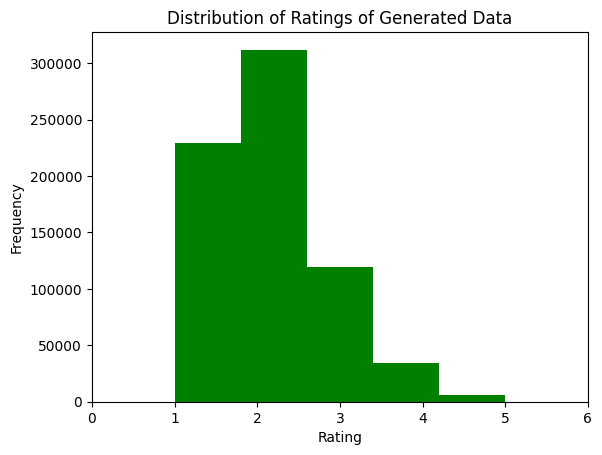

In [ ]:
#df.replace(0, float('nan'), inplace = True)
plt.xlim(0, 6)
plt.hist(df_fake['Rating'], bins = 5, color = 'green')
plt.xlabel('Rating')
plt.ylabel('Frequency')
plt.title('Distribution of Ratings of Generated Data')
plt.show()

# 주제 GAN

## rating matrix

In [ ]:
latent_dim1 = 100 # 3883
output_dim1 = 3883
latent_dim2 = 100 # 4832
output_dim2 = 4832

epochs = 50

batch_size1 = 4832
batch_size2 = 3883

lr_d = 0.00006
lr_g = 0.00004


n_iter_D = 1
n_iter_G = 2

In [ ]:
# generator 번갈아 학습

# 생성자 모델
Generator1 = Sequential()
Generator1.add(Dense(128, input_shape=(latent_dim1,), activation=LeakyReLU(0.2)))
Generator1.add(BatchNormalization())

Generator1.add(Dense(512, activation=LeakyReLU(0.2)))
Generator1.add(BatchNormalization())
Generator1.add(Dropout(0.3))

Generator1.add(Dense(1024, activation=LeakyReLU(0.2)))
Generator1.add(BatchNormalization())
Generator1.add(Dropout(0.3))

#output_dim보다 커야함
Generator1.add(Dense(2048, activation=LeakyReLU(0.2)))
Generator1.add(BatchNormalization())

Generator1.add(Dense(output_dim1, activation='relu'))


# 생성자 모델
Generator2 = Sequential()
Generator2.add(Dense(128, input_shape=(latent_dim2,), activation=LeakyReLU(0.2)))
Generator2.add(BatchNormalization())

Generator2.add(Dense(512, activation=LeakyReLU(0.2)))
Generator2.add(BatchNormalization())
Generator2.add(Dropout(0.3))

Generator2.add(Dense(1024, activation=LeakyReLU(0.2)))
Generator2.add(BatchNormalization())
Generator2.add(Dropout(0.3))

#output_dim보다 커야함
Generator2.add(Dense(2048, activation=LeakyReLU(0.2)))
Generator2.add(BatchNormalization())

Generator2.add(Dense(output_dim2, activation='relu'))


# 판별자 모델
Discriminator = Sequential()
Discriminator.add(Dense(2048, input_shape=(output_dim1,), activation=LeakyReLU(0.2)))
Discriminator.add(BatchNormalization())

Discriminator.add(Dense(1024, activation=LeakyReLU(0.2)))
Discriminator.add(BatchNormalization())
Discriminator.add(Dropout(0.3))

Discriminator.add(Dense(512, activation=LeakyReLU(0.2)))
Discriminator.add(BatchNormalization())
Discriminator.add(Dropout(0.3))

Discriminator.add(Dense(128, activation=LeakyReLU(0.2)))
Discriminator.add(BatchNormalization())
Discriminator.add(Dropout(0.3))

Discriminator.add(Dense(1, activation='sigmoid'))


Doptimizer = tf.keras.optimizers.Adam(lr_d)
Goptimizer1 = tf.keras.optimizers.Adam(lr_g)
Goptimizer2 = tf.keras.optimizers.Adam(lr_g)


def get_noise(batch_size,latent_dim):
    return tf.random.normal([batch_size,latent_dim])

loss_D_list = []
loss_G_list = []
loss_GD_list = []

for epoch in tf.range(epochs):
    batch_input = y_train.sample(n=batch_size1)
    missing = batch_input.applymap(lambda x: 1 if x > 0 else 0)
    missing_reshaped = missing.transpose()

    inputs = tf.Variable(batch_input.values, tf.float32)
    missing_array = tf.Variable(missing.values, tf.float32)
    inputs = tf.cast(inputs, tf.float32)
    missing_array = tf.cast(missing_array, tf.float32)

    missing_array_reshaped = tf.Variable(missing_reshaped.values, tf.float32)
    missing_array_reshaped = tf.cast(missing_array_reshaped, tf.float32)

    check_g = True

    #with tf.GradientTape() as t1, tf.GradientTape() as t2:
    with tf.GradientTape(persistent=True) as t1, tf.GradientTape(persistent=True) as t2:

      for iter in range(n_iter_G):
        generated_data1 = Generator1(get_noise(batch_size1,latent_dim1))
        G1 = generated_data1 * missing_array

        generated_data2 = Generator2(get_noise(batch_size2,latent_dim2))
        G2 = generated_data2 * missing_array_reshaped
        G2 =tf.transpose(G2)

        # 요소별 곱 -> 요소별 합
        G = G1 * G2
        #G = G1 + G2

        Z = Discriminator(G)

        loss_G = -tf.reduce_mean(tf.math.log(Z))

        if check_g == True:
          Ggradients1 = t2.gradient(loss_G,Generator1.trainable_variables)
          #inf 방지??
          Ggradients1 = [tf.clip_by_value(grad, -1.0, 1.0) for grad in Ggradients1]
          Goptimizer1.apply_gradients(zip(Ggradients1, Generator1.trainable_variables))
          check_g = False

        else:
          Ggradients2 = t2.gradient(loss_G,Generator2.trainable_variables)
          #inf 방지??
          Ggradients2 = [tf.clip_by_value(grad, -1.0, 1.0) for grad in Ggradients2]
          Goptimizer2.apply_gradients(zip(Ggradients2, Generator2.trainable_variables))
          check_g = True

      for iter in range(n_iter_D):
        generated_data1 = Generator1(get_noise(batch_size1,latent_dim1))
        G1 = generated_data1 * missing_array

        generated_data2 = Generator2(get_noise(batch_size2,latent_dim2))
        G2 = generated_data2 * missing_array_reshaped
        G2 =tf.transpose(G2)

        # 요소별 곱 -> 요소별 합
        G = G1 * G2
        #G = G1 + G2


        Z = Discriminator(G)

        R = Discriminator(inputs)
        # 둘 다 minimize
        loss_D = -tf.reduce_mean(tf.math.log(R) + tf.math.log(1 - Z))
        #loss_G = -tf.reduce_mean(tf.math.log(Z))
        Dgradients = t1.gradient(loss_D, Discriminator.trainable_variables)
        #inf 방지??
        Dgradients = [tf.clip_by_value(grad, -1.0, 1.0) for grad in Dgradients]
        Doptimizer.apply_gradients(zip(Dgradients, Discriminator.trainable_variables))

    loss_D_list.append(loss_D)
    loss_G_list.append(loss_G)
    loss_GD_list.append(loss_D+loss_G)

    del t1
    del t2

    print(f'Epoch: {epoch}, Discriminator Loss: {loss_D}, Generator Loss: {loss_G}, GAN Loss: {loss_D+loss_G}')
    #print(f"epoch: {epoch} d_loss: {loss_D} g_loss: {loss_G}")

Epoch: 0, Discriminator Loss: 1.310590386390686, Generator Loss: 0.6930591464042664, GAN Loss: 2.0036494731903076
Epoch: 1, Discriminator Loss: 1.0033546686172485, Generator Loss: 0.6944495439529419, GAN Loss: 1.6978042125701904
Epoch: 2, Discriminator Loss: 0.8768455982208252, Generator Loss: 0.6968364715576172, GAN Loss: 1.5736820697784424
Epoch: 3, Discriminator Loss: 0.8098561763763428, Generator Loss: 0.6994412541389465, GAN Loss: 1.5092973709106445
Epoch: 4, Discriminator Loss: 0.7689293622970581, Generator Loss: 0.7023265957832336, GAN Loss: 1.4712560176849365
Epoch: 5, Discriminator Loss: 0.7416457533836365, Generator Loss: 0.7053928971290588, GAN Loss: 1.4470386505126953
Epoch: 6, Discriminator Loss: 0.7224392890930176, Generator Loss: 0.7085226774215698, GAN Loss: 1.4309619665145874
Epoch: 7, Discriminator Loss: 0.708114743232727, Generator Loss: 0.7117080688476562, GAN Loss: 1.4198228120803833
Epoch: 8, Discriminator Loss: 0.6971530318260193, Generator Loss: 0.71516942977905

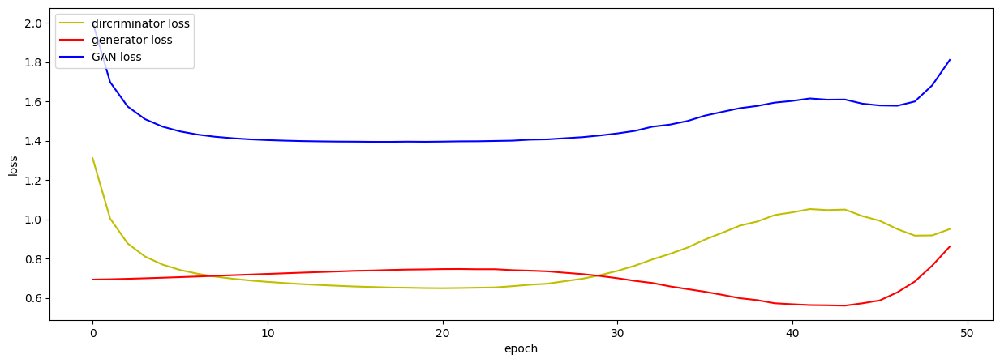

In [ ]:
import matplotlib.pyplot as plt

fig, loss_ax = plt.subplots(figsize = (15,5))

loss_ax.plot(loss_D_list, 'y', label = 'dircriminator loss')
loss_ax.plot(loss_G_list, 'r', label = 'generator loss')
loss_ax.plot(loss_GD_list, 'b', label = 'GAN loss')

loss_ax.set_xlabel('epoch')
loss_ax.set_ylabel('loss')
loss_ax.legend(loc='upper left')

plt.show()

In [ ]:
generated_data1 = Generator1(get_noise(batch_size1,latent_dim1))
generated_data2 = Generator2(get_noise(batch_size2,latent_dim2))
generated_data2 =tf.transpose(generated_data2)
#요소별 곱 -> 요소별 합
new_generated_data = generated_data1 * generated_data2
#new_generated_data = generated_data1 + generated_data2

In [ ]:
df_ratings_new = pd.DataFrame(new_generated_data, columns = y_train.columns)
df_ratings_new.index = range(10001, 10001+len(df_ratings_new))
df_ratings_new = df_ratings_new.rename_axis("MovieID")

In [ ]:
df_ratings_new

MovieID,1,2,3,4,5,6,7,8,9,10,...,3943,3944,3945,3946,3947,3948,3949,3950,3951,3952
MovieID,,,,,,,,,,,,,,,,,,,,,
10001,2.059282,2.038499,0.000000,0.353048,2.053779,0.0,0.0,0.0,0.059344,0.0,...,1.396570,0.0,0.135604,2.460016,1.097608,1.876772,2.501239,0.0,0.620882,2.887822
10002,1.340419,1.153743,0.071238,0.209844,1.175900,0.0,0.0,0.0,0.176192,0.0,...,0.710262,0.0,0.043591,1.567589,0.368553,0.822308,1.420321,0.0,0.273690,1.630116
10003,2.583295,2.614659,0.000000,0.416817,3.304379,0.0,0.0,0.0,0.000000,0.0,...,1.574869,0.0,0.299807,3.119053,1.252046,2.330564,2.672278,0.0,0.954420,3.269369
10004,3.286873,2.207474,0.000000,0.063561,2.699002,0.0,0.0,0.0,0.620362,0.0,...,1.349333,0.0,0.080299,2.852660,1.334260,2.177240,2.602467,0.0,0.788911,3.117193
10005,3.323672,2.403415,0.000000,0.352587,2.907479,0.0,0.0,0.0,0.260587,0.0,...,1.589441,0.0,0.061374,3.224448,1.484816,2.393210,2.852985,0.0,0.744189,3.181737
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14828,0.563580,0.046831,0.000000,0.000000,0.204465,0.0,0.0,0.0,0.000000,0.0,...,0.031756,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.009580
14829,2.163111,1.544480,0.000000,0.322821,2.306419,0.0,0.0,0.0,0.000000,0.0,...,1.006878,0.0,0.133666,1.833472,0.683516,1.833133,1.883148,0.0,0.718349,2.521543
14830,3.883090,2.631986,0.016889,0.440864,2.953846,0.0,0.0,0.0,0.068888,0.0,...,1.689108,0.0,0.157314,3.299504,1.379902,3.103256,3.200737,0.0,1.281618,4.469738


In [ ]:
max_val = df_ratings_new.max().max()
print(max_val)

12.6507015


In [ ]:
zero_cols = (df_ratings_new == 0).all(axis=0).sum()
print(zero_cols)

687


In [ ]:
#저장
df_ratings_new.to_csv(path + 'df_new.csv', index=False)

In [ ]:
#저장 _ 예비
df_ratings_new.to_csv(path + 'df_new1.csv', index=False)

In [ ]:
#저장 _ 예비
df_ratings_new.to_csv(path + 'df_new2.csv', index=False)

In [ ]:
#저장 _ 예비
df_ratings_new.to_csv(path + 'df_new3.csv', index=False)

In [ ]:
#저장_add
df_ratings_new.to_csv(path + 'df_new_add.csv', index=False)

### 불러오기

In [ ]:
#불러오기
df_ratings_new = pd.read_csv(path + "df_new.csv")

In [ ]:
#불러오기
df_ratings_new = pd.read_csv(path + "df_new1.csv")

In [ ]:
#불러오기
df_ratings_new = pd.read_csv(path + "df_new2.csv")

In [ ]:
#불러오기
df_ratings_new = pd.read_csv(path + "df_new3.csv")

In [ ]:
#불러오기_add
df_ratings_new = pd.read_csv(path + "df_new_add.csv")

In [ ]:
df_ratings_new.index.name = 'UserID'
df_ratings_new.columns.name = 'MovieID'
df_ratings_new.name = 'Rating'

In [ ]:
max_val = df_ratings_new.max().max()
print(max_val)

12.6507015


In [ ]:
zero_cols = (df_ratings_new == 0).all(axis=0).sum()
print(zero_cols)

687


<Axes: >

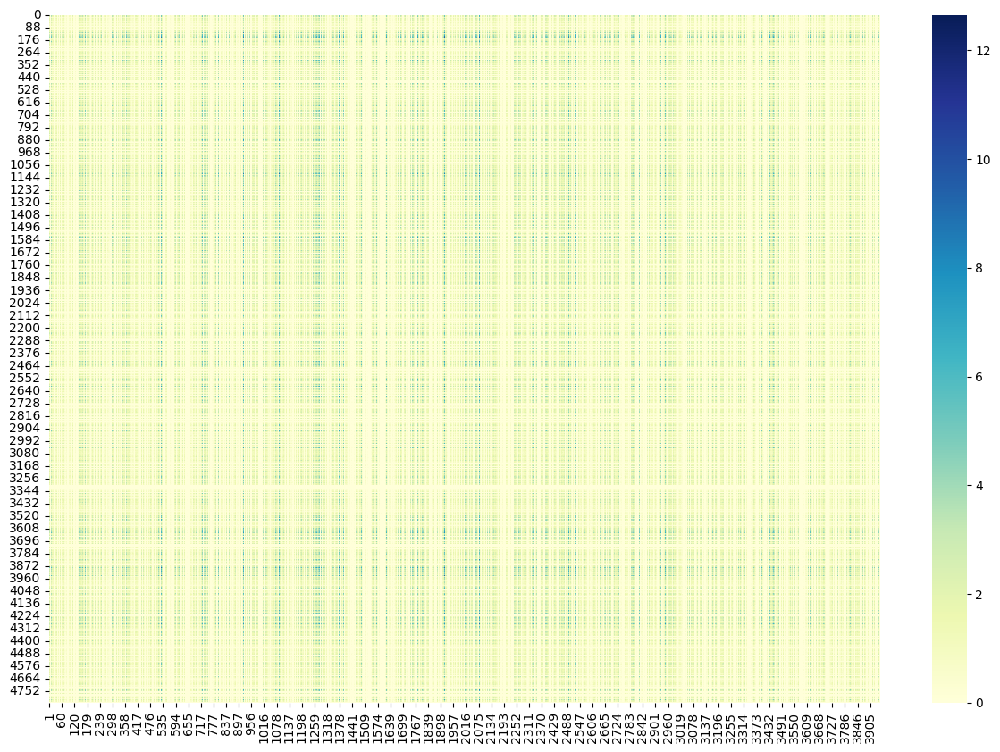

In [ ]:
fig, ax = plt.subplots(figsize=(15, 10))
sns.heatmap(df_ratings_new, cmap='YlGnBu', ax=ax)

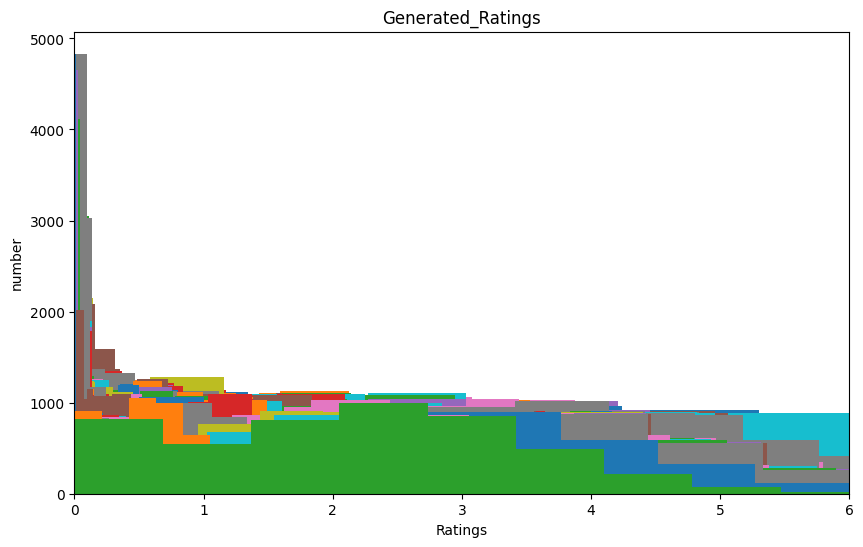

In [ ]:
#df.replace(0, float('nan'), inplace = True)
plt.figure(figsize=(10, 6))
for column_name in df_ratings_new.columns:
  plt.hist(df_ratings_new[column_name])
plt.xlim(0, 6)
plt.xlabel('Ratings') # x축 라벨 설정
plt.ylabel('number') # y축 라벨 설정
plt.title('Generated_Ratings') # 그래프 제목 설정
plt.show() # 그래프 출력

In [ ]:
#df_ratings_new = np.ceil(df_ratings_new) #ceil, floor, round
df_ratings_int = np.ceil(df_ratings_new)
df_ratings_int[df_ratings_int >  5] = 5

In [ ]:
counts = df_ratings_int.stack().value_counts()

In [ ]:
counts

0.0    7770019
1.0    5717580
2.0    3291452
3.0    1356581
4.0     440528
5.0     186496
dtype: int64

In [ ]:
counts = ratings_df.stack().value_counts()

In [ ]:
counts

0    22453111
4      348971
3      261197
5      226310
2      107557
1       56174
dtype: int64

In [ ]:
df_ratings_int = df_ratings_int.astype(int)

In [ ]:
df_ratings_int

,1,2,3,4,5,6,7,8,9,10,...,3943,3944,3945,3946,3947,3948,3949,3950,3951,3952
0,3,3,0,1,3,0,0,0,1,0,...,2,0,1,3,2,2,3,0,1,3
1,2,2,1,1,2,0,0,0,1,0,...,1,0,1,2,1,1,2,0,1,2
2,3,3,0,1,4,0,0,0,0,0,...,2,0,1,4,2,3,3,0,1,4
3,4,3,0,1,3,0,0,0,1,0,...,2,0,1,3,2,3,3,0,1,4
4,4,3,0,1,3,0,0,0,1,0,...,2,0,1,4,2,3,3,0,1,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4827,1,1,0,0,1,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,1
4828,3,2,0,1,3,0,0,0,0,0,...,2,0,1,2,1,2,2,0,1,3
4829,4,3,1,1,3,0,0,0,1,0,...,2,0,1,4,2,4,4,0,2,5
4830,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


<Axes: >

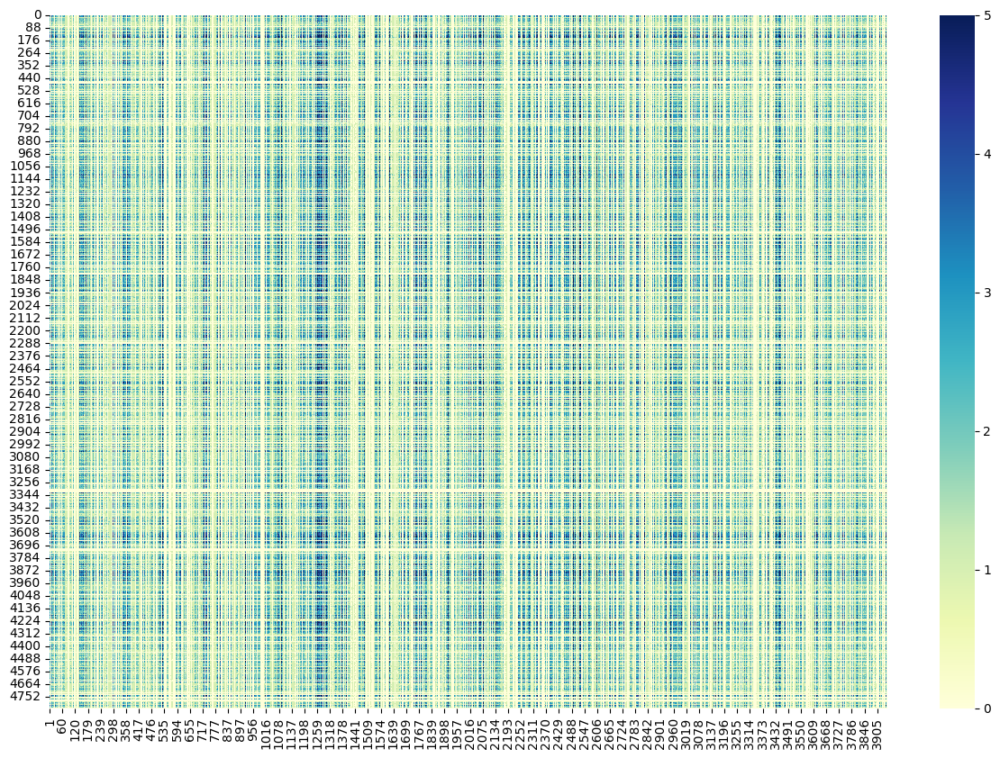

In [ ]:
fig, ax = plt.subplots(figsize=(15, 10))
sns.heatmap(df_ratings_int, cmap='YlGnBu', ax=ax)

In [ ]:
df_new = df_ratings_int.reset_index().melt(id_vars='UserID', value_name='Rating', var_name='MovieID').dropna()

In [ ]:
df_new = df_new[df_new['Rating'] != 0]

In [ ]:
df_new

,UserID,MovieID,Rating
0,0,1,3.0
1,1,1,2.0
2,2,1,3.0
3,3,1,4.0
4,4,1,4.0
...,...,...,...
18762650,4826,3952,2.0
18762651,4827,3952,1.0
18762652,4828,3952,3.0
18762653,4829,3952,5.0


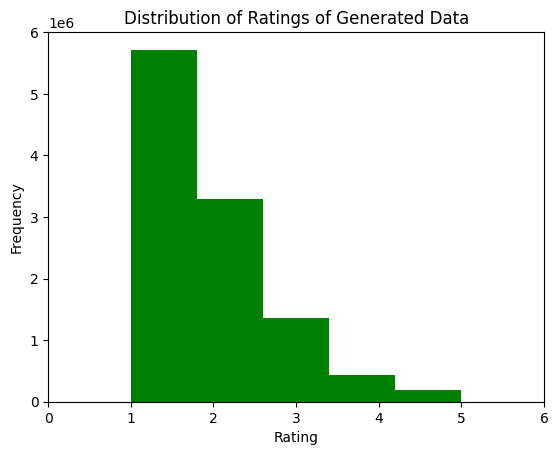

In [ ]:
#df.replace(0, float('nan'), inplace = True)
plt.xlim(0, 6)
plt.hist(df_new['Rating'], bins = 5, color = 'green')
plt.xlabel('Rating')
plt.ylabel('Frequency')
plt.title('Distribution of Ratings of Generated Data')
plt.show()

## binary matrix

In [ ]:
latent_dim1 = 100 # 3883
output_dim1 = 3883
latent_dim2 = 100 # 4832
output_dim2 = 4832

epochs = 50

batch_size1 = 4832
batch_size2 = 3883

lr_d = 0.00006
lr_g = 0.00004


n_iter_D = 1
n_iter_G = 2

In [ ]:
# generator 번갈아 학습

# 생성자 모델
Generator1 = Sequential()
Generator1.add(Dense(128, input_shape=(latent_dim1,), activation=LeakyReLU(0.2)))
Generator1.add(BatchNormalization())

Generator1.add(Dense(512, activation=LeakyReLU(0.2)))
Generator1.add(BatchNormalization())
Generator1.add(Dropout(0.3))

Generator1.add(Dense(1024, activation=LeakyReLU(0.2)))
Generator1.add(BatchNormalization())
Generator1.add(Dropout(0.3))

#output_dim보다 커야함
Generator1.add(Dense(2048, activation=LeakyReLU(0.2)))
Generator1.add(BatchNormalization())

Generator1.add(Dense(output_dim1, activation='relu'))


# 생성자 모델
Generator2 = Sequential()
Generator2.add(Dense(128, input_shape=(latent_dim2,), activation=LeakyReLU(0.2)))
Generator2.add(BatchNormalization())

Generator2.add(Dense(512, activation=LeakyReLU(0.2)))
Generator2.add(BatchNormalization())
Generator2.add(Dropout(0.3))

Generator2.add(Dense(1024, activation=LeakyReLU(0.2)))
Generator2.add(BatchNormalization())
Generator2.add(Dropout(0.3))

#output_dim보다 커야함
Generator2.add(Dense(2048, activation=LeakyReLU(0.2)))
Generator2.add(BatchNormalization())

Generator2.add(Dense(output_dim2, activation='relu'))


# 판별자 모델
Discriminator = Sequential()
Discriminator.add(Dense(2048, input_shape=(output_dim1,), activation=LeakyReLU(0.2)))
Discriminator.add(BatchNormalization())

Discriminator.add(Dense(1024, activation=LeakyReLU(0.2)))
Discriminator.add(BatchNormalization())
Discriminator.add(Dropout(0.3))

Discriminator.add(Dense(512, activation=LeakyReLU(0.2)))
Discriminator.add(BatchNormalization())
Discriminator.add(Dropout(0.3))

Discriminator.add(Dense(128, activation=LeakyReLU(0.2)))
Discriminator.add(BatchNormalization())
Discriminator.add(Dropout(0.3))

Discriminator.add(Dense(1, activation='sigmoid'))


Doptimizer = tf.keras.optimizers.Adam(lr_d)
Goptimizer1 = tf.keras.optimizers.Adam(lr_g)
Goptimizer2 = tf.keras.optimizers.Adam(lr_g)


def get_noise(batch_size,latent_dim):
    return tf.random.normal([batch_size,latent_dim])

loss_D_list = []
loss_G_list = []
loss_GD_list = []

for epoch in tf.range(epochs):
    batch_input = X_train.sample(n=batch_size1)

    inputs = tf.Variable(batch_input.values, tf.float32)
    inputs = tf.cast(inputs, tf.float32)

    check_g = True

    #with tf.GradientTape() as t1, tf.GradientTape() as t2:
    with tf.GradientTape(persistent=True) as t1, tf.GradientTape(persistent=True) as t2:

      for iter in range(n_iter_G):
        generated_data1 = Generator1(get_noise(batch_size1,latent_dim1))
        G1 = generated_data1

        generated_data2 = Generator2(get_noise(batch_size2,latent_dim2))
        G2 = generated_data2
        G2 =tf.transpose(G2)

        # 요소별 곱 -> 요소별 합
        G = G1 * G2
        #G = G1 + G2

        Z = Discriminator(G)

        loss_G = -tf.reduce_mean(tf.math.log(Z))

        if check_g == True:
          Ggradients1 = t2.gradient(loss_G,Generator1.trainable_variables)
          #inf 방지??
          Ggradients1 = [tf.clip_by_value(grad, -1.0, 1.0) for grad in Ggradients1]
          Goptimizer1.apply_gradients(zip(Ggradients1, Generator1.trainable_variables))
          check_g = False

        else:
          Ggradients2 = t2.gradient(loss_G,Generator2.trainable_variables)
          #inf 방지??
          Ggradients2 = [tf.clip_by_value(grad, -1.0, 1.0) for grad in Ggradients2]
          Goptimizer2.apply_gradients(zip(Ggradients2, Generator2.trainable_variables))
          check_g = True

      for iter in range(n_iter_D):
        generated_data1 = Generator1(get_noise(batch_size1,latent_dim1))
        G1 = generated_data1

        generated_data2 = Generator2(get_noise(batch_size2,latent_dim2))
        G2 = generated_data2
        G2 =tf.transpose(G2)

        # 요소별 곱 -> 요소별 합
        G = G1 * G2
        #G = G1 + G2


        Z = Discriminator(G)

        R = Discriminator(inputs)
        # 둘 다 minimize
        loss_D = -tf.reduce_mean(tf.math.log(R) + tf.math.log(1 - Z))
        #loss_G = -tf.reduce_mean(tf.math.log(Z))
        Dgradients = t1.gradient(loss_D, Discriminator.trainable_variables)
        #inf 방지??
        Dgradients = [tf.clip_by_value(grad, -1.0, 1.0) for grad in Dgradients]
        Doptimizer.apply_gradients(zip(Dgradients, Discriminator.trainable_variables))

    loss_D_list.append(loss_D)
    loss_G_list.append(loss_G)
    loss_GD_list.append(loss_D+loss_G)

    del t1
    del t2

    print(f'Epoch: {epoch}, Discriminator Loss: {loss_D}, Generator Loss: {loss_G}, GAN Loss: {loss_D+loss_G}')
    #print(f"epoch: {epoch} d_loss: {loss_D} g_loss: {loss_G}")

Epoch: 0, Discriminator Loss: 1.458749532699585, Generator Loss: 0.6931981444358826, GAN Loss: 2.1519477367401123
Epoch: 1, Discriminator Loss: 1.324004888534546, Generator Loss: 0.6895579099655151, GAN Loss: 2.0135626792907715
Epoch: 2, Discriminator Loss: 1.2253468036651611, Generator Loss: 0.6875731348991394, GAN Loss: 1.9129199981689453
Epoch: 3, Discriminator Loss: 1.1493316888809204, Generator Loss: 0.6858882308006287, GAN Loss: 1.8352198600769043
Epoch: 4, Discriminator Loss: 1.0888117551803589, Generator Loss: 0.68377286195755, GAN Loss: 1.7725846767425537
Epoch: 5, Discriminator Loss: 1.0398436784744263, Generator Loss: 0.6814899444580078, GAN Loss: 1.721333622932434
Epoch: 6, Discriminator Loss: 1.000394344329834, Generator Loss: 0.6779294013977051, GAN Loss: 1.678323745727539
Epoch: 7, Discriminator Loss: 0.9687004089355469, Generator Loss: 0.6734855771064758, GAN Loss: 1.642185926437378
Epoch: 8, Discriminator Loss: 0.9448444247245789, Generator Loss: 0.6674709916114807, GA

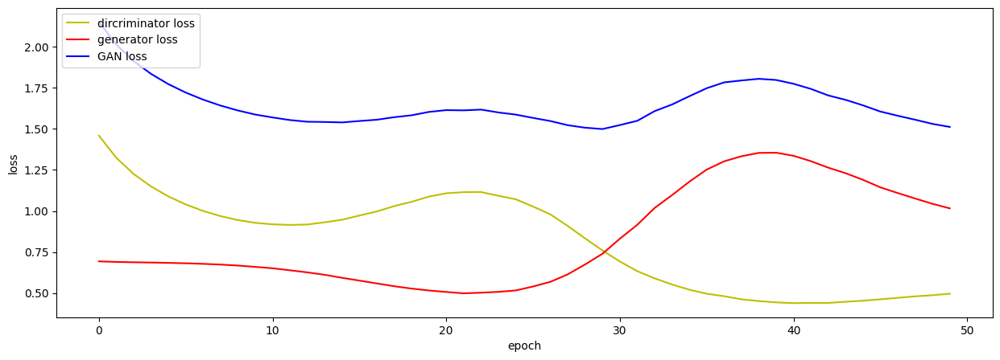

In [ ]:
import matplotlib.pyplot as plt

fig, loss_ax = plt.subplots(figsize = (15,5))

loss_ax.plot(loss_D_list, 'y', label = 'dircriminator loss')
loss_ax.plot(loss_G_list, 'r', label = 'generator loss')
loss_ax.plot(loss_GD_list, 'b', label = 'GAN loss')

loss_ax.set_xlabel('epoch')
loss_ax.set_ylabel('loss')
loss_ax.legend(loc='upper left')

plt.show()

In [ ]:
generated_data1 = Generator1(get_noise(batch_size1,latent_dim1))
generated_data2 = Generator2(get_noise(batch_size2,latent_dim2))
generated_data2 =tf.transpose(generated_data2)
#요소별 곱 -> 요소별 합
new_generated_data = generated_data1 * generated_data2
#new_generated_data = generated_data1 + generated_data2

In [ ]:
df_ratings_binary = pd.DataFrame(new_generated_data, columns = y_train.columns)
df_ratings_binary.index = range(10001, 10001+len(df_ratings_binary))
df_ratings_binary = df_ratings_binary.rename_axis("MovieID")

In [ ]:
df_ratings_binary

MovieID,1,2,3,4,5,6,7,8,9,10,...,3943,3944,3945,3946,3947,3948,3949,3950,3951,3952
MovieID,,,,,,,,,,,,,,,,,,,,,
10001,0.191033,0.002224,0.022849,0.057538,0.000000,0.0,0.035309,0.0,0.0,0.000000,...,0.000000,0.000085,0.0,0.0,0.0,0.077996,0.000000,0.0,0.000000,0.0
10002,0.089562,0.026078,0.018445,0.094713,0.000000,0.0,0.050651,0.0,0.0,0.000000,...,0.000000,0.011823,0.0,0.0,0.0,0.052793,0.018958,0.0,0.000000,0.0
10003,0.012394,0.000000,0.031455,0.049314,0.000000,0.0,0.001107,0.0,0.0,0.000412,...,0.000000,0.014639,0.0,0.0,0.0,0.010259,0.000000,0.0,0.000000,0.0
10004,0.052808,0.000000,0.037515,0.053353,0.001023,0.0,0.022099,0.0,0.0,0.000000,...,0.000000,0.000000,0.0,0.0,0.0,0.077306,0.000000,0.0,0.000000,0.0
10005,0.000000,0.000000,0.011221,0.019738,0.000000,0.0,0.000000,0.0,0.0,0.000000,...,0.000000,0.015836,0.0,0.0,0.0,0.016881,0.000000,0.0,0.000000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14828,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.000000,...,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0
14829,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.003978,0.0,0.0,0.001521,...,0.000137,0.001522,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0
14830,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.000000,...,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0


In [ ]:
max_val = df_ratings_binary.max().max()
print(max_val)

0.5860797


In [ ]:
zero_cols = (df_ratings_binary == 0).all(axis=0).sum()
print(zero_cols)

124


In [ ]:
#저장
df_ratings_binary.to_csv(path + 'df_new_binary.csv', index=False)

<Axes: xlabel='MovieID', ylabel='MovieID'>

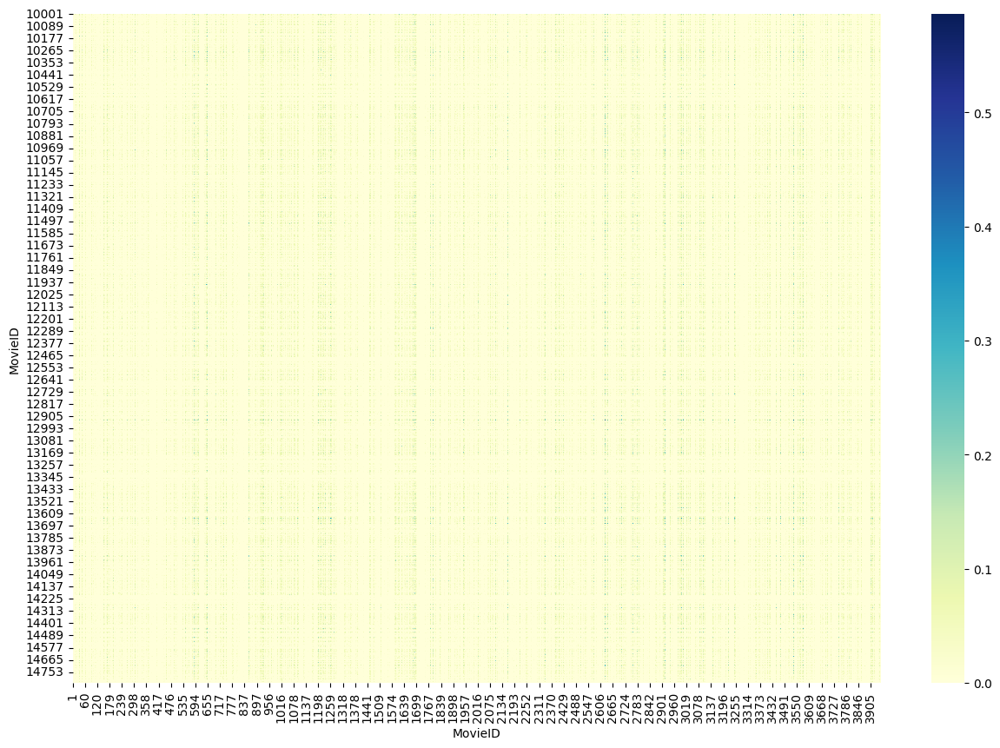

In [ ]:
fig, ax = plt.subplots(figsize=(15, 10))
sns.heatmap(df_ratings_binary, cmap='YlGnBu', ax=ax)

## 합치기

In [ ]:
df = pd.read_csv(path + 'df_new2.csv')
df_missing = pd.read_csv(path + 'df_new_binary.csv')

missing_df에 ['1':'0'] = [1000209 : 21384031] = [1:21] 비율로 존재

In [ ]:
values_flattened = df_missing.values.flatten()
top_values = sorted(set(values_flattened), reverse=True)[:1500000]

In [ ]:
values_flattened = np.where(np.isin(values_flattened, top_values), 1, 0)

# 1차원 배열을 다시 128 * 3706 크기의 데이터프레임으로 변환
df_missing_final = pd.DataFrame(values_flattened.reshape(4832, 3883), index=df.index, columns=df.columns)

In [ ]:
df_missing_final

,1,2,3,4,5,6,7,8,9,10,...,3943,3944,3945,3946,3947,3948,3949,3950,3951,3952
0,1,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
1,1,0,0,1,0,0,1,0,0,0,...,0,0,0,0,0,1,0,0,0,0
2,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,1,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4827,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4828,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4829,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4830,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
df_final = df_missing_final * df

In [ ]:
df_final = np.ceil(df_final)
df_final[df_final > 5] = 5

In [ ]:
counts = df_final.stack().value_counts()

In [ ]:
counts

0.0    17683961
1.0      617684
2.0      337747
3.0       97014
4.0       21149
5.0        5101
dtype: int64

In [ ]:
df_final = df_final.astype(int)

In [ ]:
df_final

,1,2,3,4,5,6,7,8,9,10,...,3943,3944,3945,3946,3947,3948,3949,3950,3951,3952
0,2,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,3,0,0,0,0
1,2,0,0,0,0,0,2,0,0,0,...,0,0,0,0,0,3,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,2,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,2,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4827,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4828,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4829,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4830,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


<Axes: xlabel='MovieID', ylabel='UserID'>

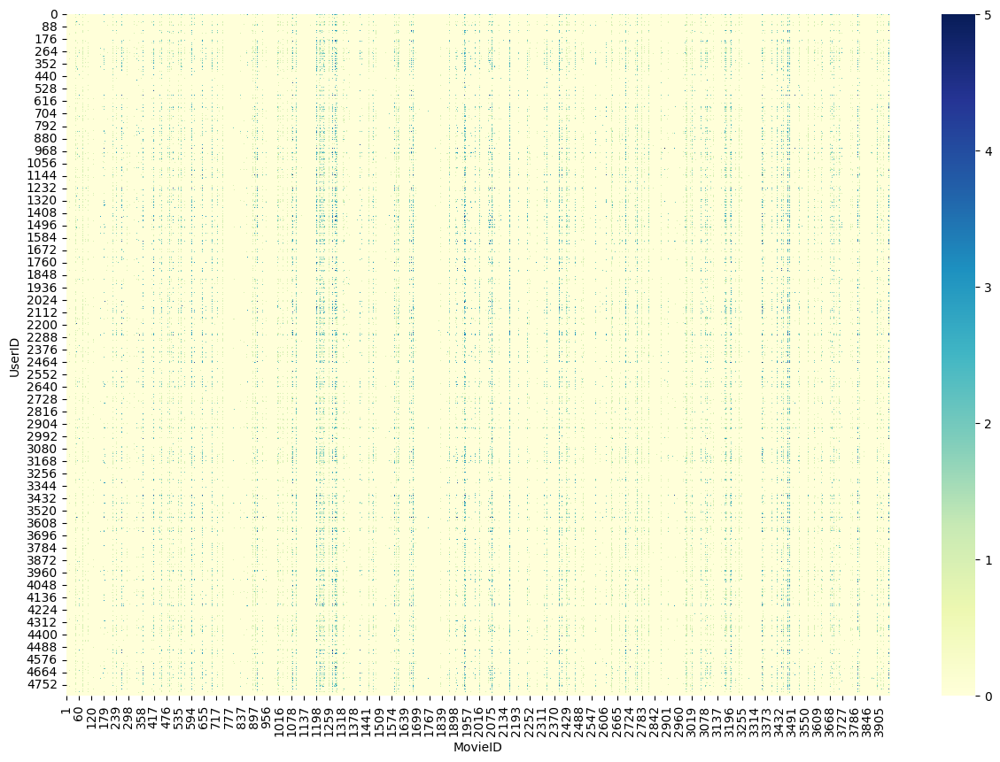

In [ ]:
fig, ax = plt.subplots(figsize=(15, 10))
sns.heatmap(df_final, cmap='YlGnBu', ax=ax)

In [ ]:
df_final.index.name = 'UserID'
df_final.columns.name = 'MovieID'
df_final.name = 'Rating'

In [ ]:
df_fake = df_final.reset_index().melt(id_vars='UserID', value_name='Rating', var_name='MovieID').dropna()

In [ ]:
df_fake = df_fake[df_fake['Rating'] != 0]

In [ ]:
df_fake

,UserID,MovieID,Rating
0,0,1,2
1,1,1,2
3,3,1,2
7,7,1,1
9,9,1,2
...,...,...,...
18752611,4451,3950,2
18753962,970,3951,1
18754458,1466,3951,1
18754624,1632,3951,1


In [ ]:
df_fake.to_csv(path + 'df_fake_GAN.csv', index=False)

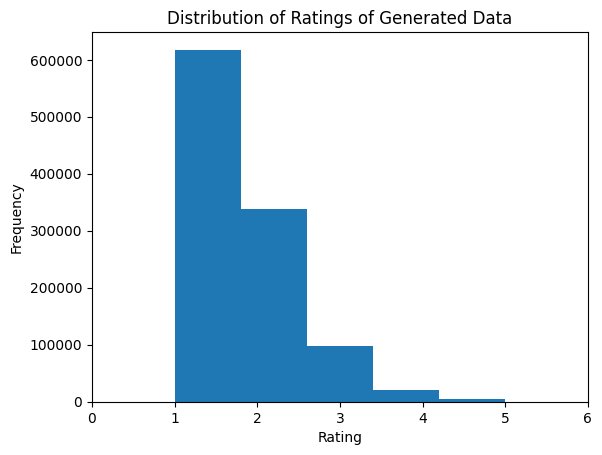

In [ ]:
#df.replace(0, float('nan'), inplace = True)
plt.xlim(0, 6)
colors = ['red', 'green', 'blue', 'orange', 'purple']
plt.hist(df_fake['Rating'], bins = 5)
plt.xlabel('Rating')
plt.ylabel('Frequency')
plt.title('Distribution of Ratings of Generated Data')
plt.show()

## 비교

In [23]:
df_fake_original = pd.read_csv(path + 'df_fake_original.csv')
df_fake_GAN = pd.read_csv(path + 'df_fake_GAN.csv')

In [18]:
# user_id에 10000 추가하기
df_fake_GAN['UserID'] = df_fake_GAN['UserID'] + 10000

In [24]:
df_fake_GAN

,UserID,MovieID,Rating
0,10000,1,2
1,10001,1,2
2,10003,1,2
3,10007,1,1
4,10009,1,2
...,...,...,...
1078690,14451,3950,2
1078691,10970,3951,1
1078692,11466,3951,1
1078693,11632,3951,1


In [22]:
df_fake_GAN.to_csv(path + 'df_fake_GAN.csv', index=False)

In [ ]:
movie_id_list = movies['MovieID'].tolist()
matrix_fake_original = df_fake_original.pivot_table(index='UserID', columns='MovieID', values='Rating', fill_value = 0)
matrix_fake_original = matrix_fake_original.reindex(columns=movie_id_list, fill_value=0)

In [ ]:
matrix_fake_original

MovieID,1,2,3,4,5,6,7,8,9,10,...,3943,3944,3945,3946,3947,3948,3949,3950,3951,3952
UserID,,,,,,,,,,,,,,,,,,,,,
0,1,2,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,2,0,0,0
1,1,2,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,2,0,0,0
2,1,2,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,2,0,0,0
3,1,2,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,2,0,0,0
4,1,2,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,2,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4827,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,2,0,0,0
4828,1,2,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,2,0,0,0
4829,1,2,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,2,0,0,0


In [20]:
matrix_fake_GAN = df_fake_GAN.pivot_table(index='UserID', columns='MovieID', values='Rating', fill_value = 0)
new_index = range(4832)
matrix_fake_GAN = matrix_fake_GAN.reindex(new_index, fill_value=0)
matrix_fake_GAN = matrix_fake_GAN.reindex(columns=movie_id_list, fill_value=0)

In [21]:
matrix_fake_GAN

MovieID,1,2,3,4,5,6,7,8,9,10,...,3943,3944,3945,3946,3947,3948,3949,3950,3951,3952
UserID,,,,,,,,,,,,,,,,,,,,,
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4827,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4828,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4829,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
vector = ratings_df.values.tolist()

# 행 간 코사인 유사도 계산
similarities = cosine_similarity(vector)


# 계산된 유사도 행렬의 요소들을 모두 더합니다.
total_sum = np.sum(similarities)

# 유사도 행렬의 요소 개수를 구합니다.
num_elements = similarities.shape[0] * similarities.shape[1]

# 전체 평균을 계산합니다.
average_similarity = total_sum / num_elements

# 계산된 전체 평균을 출력합니다.
print("전체 평균 유사도:", average_similarity)

전체 평균 유사도: 0.13152659253186688


In [ ]:
vector = matrix_fake_original.values.tolist()

# 행 간 코사인 유사도 계산
similarities = cosine_similarity(vector)

# 계산된 유사도 행렬의 요소들을 모두 더합니다.
total_sum = np.sum(similarities)

# 유사도 행렬의 요소 개수를 구합니다.
num_elements = similarities.shape[0] * similarities.shape[1]

# 전체 평균을 계산합니다.
average_similarity = total_sum / num_elements

# 계산된 전체 평균을 출력합니다.
print("전체 평균 유사도:", average_similarity)

전체 평균 유사도: 0.8164493095953259


In [ ]:
vector = matrix_fake_GAN.values.tolist()

# 행 간 코사인 유사도 계산
similarities = cosine_similarity(vector)

# 계산된 유사도 행렬의 요소들을 모두 더합니다.
total_sum = np.sum(similarities)

# 유사도 행렬의 요소 개수를 구합니다.
num_elements = similarities.shape[0] * similarities.shape[1]

# 전체 평균을 계산합니다.
average_similarity = total_sum / num_elements

# 계산된 전체 평균을 출력합니다.
print("전체 평균 유사도:", average_similarity)

전체 평균 유사도: 0.23189562219037022


In [ ]:
from sklearn.metrics import mean_squared_error
from sklearn.metrics.pairwise import cosine_similarity


# 두 피벗 테이블 데이터프레임을 평탄화하여 배열로 변환
array1 = y_train.values.flatten()
array2 = matrix_fake_original.values.flatten()

# Reshape the arrays
reshaped_array1 = array1.flatten().reshape(1, -1)
reshaped_array2 = array2.flatten().reshape(1, -1)

# 평균 제곱 오차 계산
mse1 = mean_squared_error(array1, array2)
similarity1 = cosine_similarity(reshaped_array1, reshaped_array2)

print(f"MSE: {mse1}")
print(f"Cosine similarity: {similarity1[0, 0]}")

MSE: 0.7593170711012343
Cosine similarity: 0.1401824189613377


In [ ]:
from sklearn.metrics import mean_squared_error

# 두 피벗 테이블 데이터프레임을 평탄화하여 배열로 변환
array1 = y_train.values.flatten()
array2 = matrix_fake_GAN.values.flatten()

# Reshape the arrays
reshaped_array1 = array1.flatten().reshape(1, -1)
reshaped_array2 = array2.flatten().reshape(1, -1)

# 평균 제곱 오차 계산
mse2 = mean_squared_error(array1, array2)
similarity2 = cosine_similarity(reshaped_array1, reshaped_array2)

print(f"MSE: {mse2}")
print(f"Cosine similarity: {similarity2[0, 0]}")

MSE: 0.6901819763683777
Cosine similarity: 0.13089980295383968


<Axes: xlabel='MovieID', ylabel='UserID'>

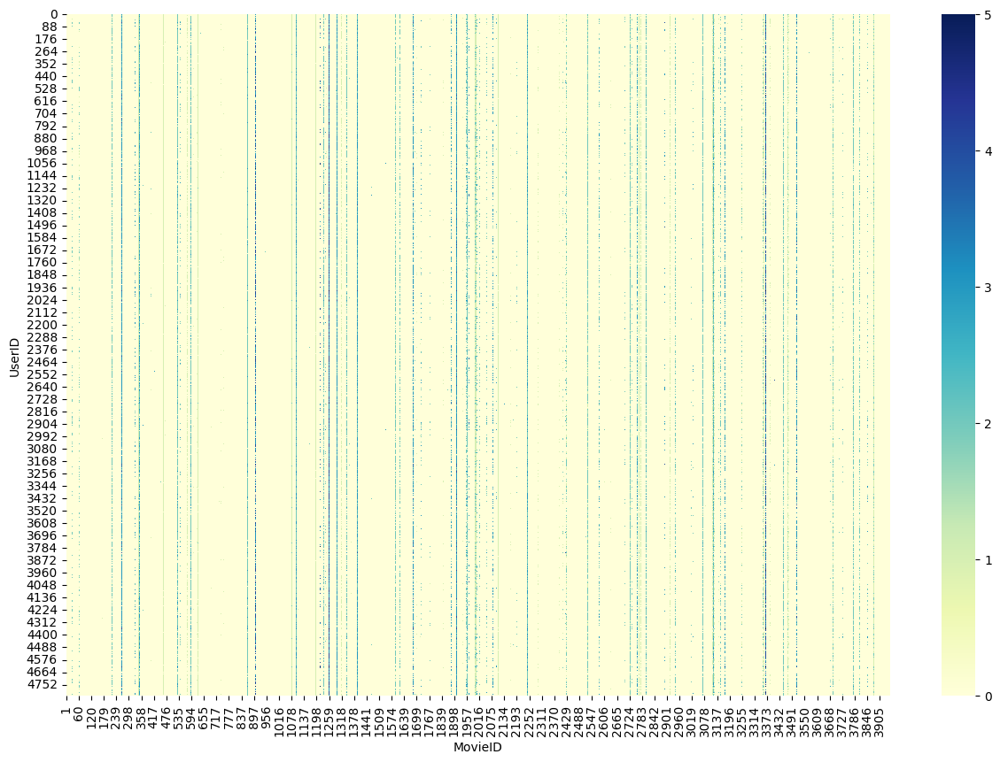

In [ ]:
fig, ax = plt.subplots(figsize=(15, 10))
sns.heatmap(matrix_fake_original, cmap='YlGnBu', ax=ax)

<Axes: xlabel='MovieID', ylabel='UserID'>

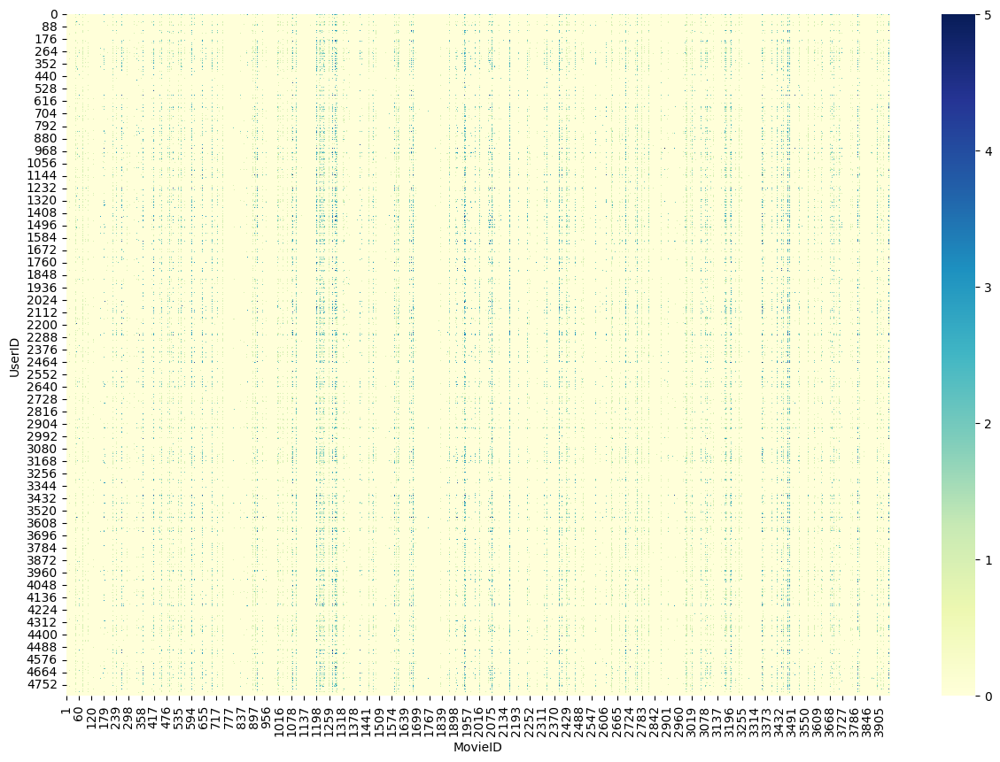

In [ ]:
fig, ax = plt.subplots(figsize=(15, 10))
sns.heatmap(matrix_fake_GAN, cmap='YlGnBu', ax=ax)

<Axes: xlabel='MovieID', ylabel='UserID'>

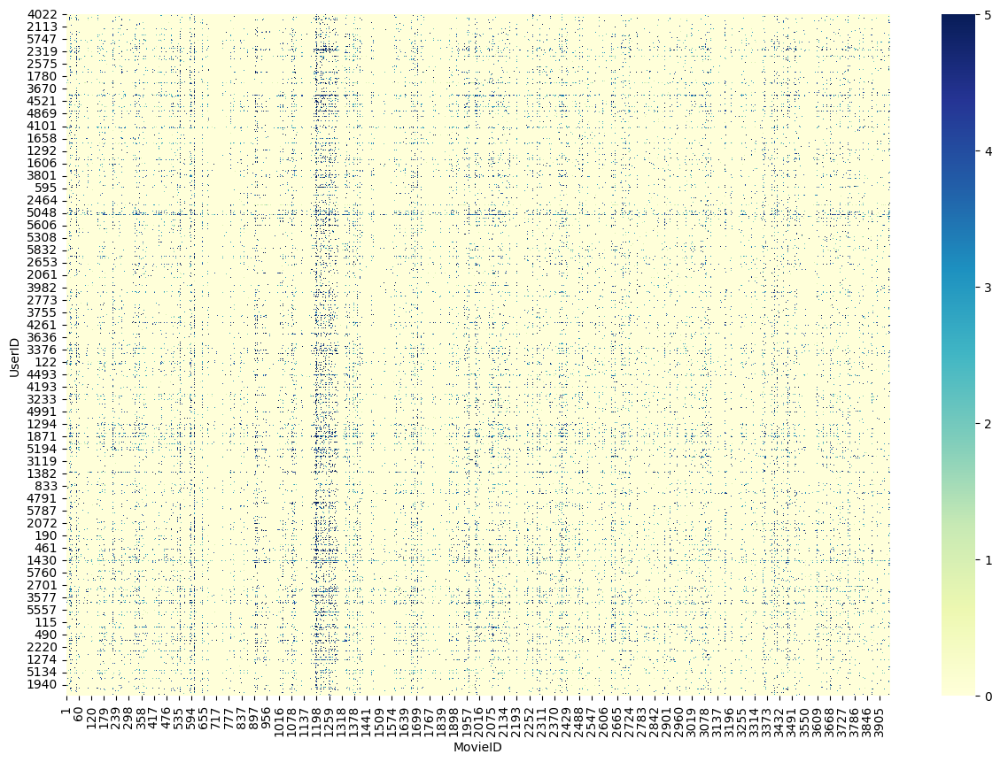

In [ ]:
fig, ax = plt.subplots(figsize=(15, 10))
sns.heatmap(y_train, cmap='YlGnBu', ax=ax)

# 분산 분석

In [ ]:
df_fake_original = pd.read_csv(path + 'df_fake_original.csv')
df_fake_GAN = pd.read_csv(path + 'df_fake_GAN.csv')

In [ ]:
movie_id_list = movies['MovieID'].tolist()
matrix_fake_original = df_fake_original.pivot_table(index='UserID', columns='MovieID', values='Rating', fill_value = 0)
matrix_fake_original = matrix_fake_original.reindex(columns=movie_id_list, fill_value=0)

In [ ]:
matrix_fake_original

MovieID,1,2,3,4,5,6,7,8,9,10,...,3943,3944,3945,3946,3947,3948,3949,3950,3951,3952
UserID,,,,,,,,,,,,,,,,,,,,,
0,1,2,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,2,0,0,0
1,1,2,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,2,0,0,0
2,1,2,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,2,0,0,0
3,1,2,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,2,0,0,0
4,1,2,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,2,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4827,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,2,0,0,0
4828,1,2,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,2,0,0,0
4829,1,2,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,2,0,0,0


In [ ]:
matrix_fake_GAN = df_fake_GAN.pivot_table(index='UserID', columns='MovieID', values='Rating', fill_value = 0)
new_index = range(4832)
matrix_fake_GAN = matrix_fake_GAN.reindex(new_index, fill_value=0)
matrix_fake_GAN = matrix_fake_GAN.reindex(columns=movie_id_list, fill_value=0)

In [ ]:
matrix_fake_GAN

MovieID,1,2,3,4,5,6,7,8,9,10,...,3943,3944,3945,3946,3947,3948,3949,3950,3951,3952
UserID,,,,,,,,,,,,,,,,,,,,,
0,2,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,3,0,0,0,0
1,2,0,0,0,0,0,2,0,0,0,...,0,0,0,0,0,3,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,2,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,2,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4827,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4828,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4829,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
ratings_df

MovieID,1,2,3,4,5,6,7,8,9,10,...,3943,3944,3945,3946,3947,3948,3949,3950,3951,3952
UserID,,,,,,,,,,,,,,,,,,,,,
1,5,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,2,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6036,0,0,0,2,0,3,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6037,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6038,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
import pandas as pd
from scipy.stats import f_oneway

pivot_table = ratings_df

# 각 영화의 평균 평점 계산
mean_ratings = pivot_table.mean()

# ANOVA 분석 수행
f_statistic, p_value = f_oneway(*[pivot_table[col] for col in pivot_table])

# 결과 출력
print("ANOVA 결과:")
print(f"F-통계량: {f_statistic}, p-value: {p_value}")


ANOVA 결과:
F-통계량: 722.7615168162878, p-value: 0.0


In [ ]:
import pandas as pd
from scipy.stats import f_oneway

pivot_table = matrix_fake_original

# 각 영화의 평균 평점 계산
mean_ratings = pivot_table.mean()

# ANOVA 분석 수행
f_statistic, p_value = f_oneway(*[pivot_table[col] for col in pivot_table])

# 결과 출력
print("ANOVA 결과:")
print(f"F-통계량: {f_statistic}, p-value: {p_value}")


ANOVA 결과:
F-통계량: 18412.83309265709, p-value: 0.0


In [ ]:
import pandas as pd
from scipy.stats import f_oneway

# 가상의 pivot table 데이터 생성
data = {'Category': ['A', 'A', 'B', 'B', 'C', 'C'],
        'Value': [1, 2, 4, 5, 7, 8]}
df = pd.DataFrame(data)

# Pivot table 생성
pivot_table = df.pivot_table(index='Us', values='Value', aggfunc='mean')

# 각 그룹 데이터 추출
grouped_data = [df[df['Category'] == category]['Value'] for category in df['Category'].unique()]

# ANOVA 분석 수행
f_statistic, p_value = f_oneway(*grouped_data)

# 결과 출력
print("ANOVA 결과:")
print(f"F-통계량: {f_statistic}, p-value: {p_value}")


In [ ]:
import pandas as pd
from scipy.stats import f_oneway

pivot_table = matrix_fake_GAN

# 각 영화의 평균 평점 계산
mean_ratings = pivot_table.mean()

# ANOVA 분석 수행
f_statistic, p_value = f_oneway(*[pivot_table[col] for col in pivot_table])

# 결과 출력
print("ANOVA 결과:")
print(f"F-통계량: {f_statistic}, p-value: {p_value}")


ANOVA 결과:
F-통계량: 1847.0121042510077, p-value: 0.0


# cGAN

In [ ]:
latent_dim = 3883
output_dim = 3883
epochs = 50
#batch_size = 128
batch_size = 256
lr_d = 0.00005
lr_g = 0.00003
#조정하기~d를 늘려보자
n_iter_D = 1
n_iter_G = 1

## 평점벡터

In [ ]:
# 생성자 모델
Generator = Sequential()

Generator.add(Dense(4096, input_shape=(latent_dim,), activation='relu'))
Generator.add(BatchNormalization())

Generator.add(Dense(1024, activation='relu'))
Generator.add(BatchNormalization())
Generator.add(Dropout(0.3))

Generator.add(Dense(512, activation='relu'))
Generator.add(BatchNormalization())
Generator.add(Dropout(0.3))

Generator.add(Dense(256, activation='relu'))
Generator.add(BatchNormalization())

Generator.add(Dense(512, activation='relu'))
Generator.add(BatchNormalization())
Generator.add(Dropout(0.3))

Generator.add(Dense(1024, activation='relu'))
Generator.add(BatchNormalization())
Generator.add(Dropout(0.3))

Generator.add(Dense(4096, activation='relu'))
Generator.add(BatchNormalization())

Generator.add(Dense(output_dim, activation='relu'))


# 판별자 모델
Discriminator = Sequential()
Discriminator.add(Dense(4096, input_shape=(output_dim,), activation='relu'))
Discriminator.add(BatchNormalization())

Discriminator.add(Dense(2048, activation='relu'))
Discriminator.add(BatchNormalization())
Discriminator.add(Dropout(0.3))

Discriminator.add(Dense(1024, activation='relu'))
Discriminator.add(BatchNormalization())
Discriminator.add(Dropout(0.3))

Discriminator.add(Dense(512, activation='relu'))
Discriminator.add(BatchNormalization())
Discriminator.add(Dropout(0.3))

Discriminator.add(Dense(256, activation='relu'))
Discriminator.add(BatchNormalization())
Discriminator.add(Dropout(0.3))

Discriminator.add(Dense(128, activation='relu'))
Discriminator.add(BatchNormalization())
Discriminator.add(Dropout(0.3))

Discriminator.add(Dense(64, activation='relu'))
Discriminator.add(BatchNormalization())
Discriminator.add(Dropout(0.3))

Discriminator.add(Dense(1, activation='sigmoid'))


Doptimizer = tf.keras.optimizers.Adam(lr_d)
Goptimizer = tf.keras.optimizers.Adam(lr_g)


def get_noise(batch_size,latent_dim):
    return tf.random.normal([batch_size,latent_dim])

loss_D_list = []
loss_G_list = []
loss_GD_list = []

for epoch in tf.range(epochs):
    batch_input = y_train.sample(n=batch_size)
    missing = batch_input.applymap(lambda x: 1 if x > 0 else 0)

    inputs = tf.Variable(batch_input.values, tf.float32)
    missing_array = tf.Variable(missing.values, tf.float32)
    inputs = tf.cast(inputs, tf.float32)
    missing_array = tf.cast(missing_array, tf.float32)

    #with tf.GradientTape() as t1, tf.GradientTape() as t2:
    with tf.GradientTape(persistent=True) as t1, tf.GradientTape(persistent=True) as t2:


      for iter in range(n_iter_G):
        #noise와 cgan_inputs 합치기기

        cgan_data = y_train.sample(n=batch_size//2)
        cgan_inputs = tf.Variable(cgan_data.values, tf.float32)
        cgan_inputs = tf.cast(cgan_inputs, tf.float32)
        noise = get_noise(batch_size//2,latent_dim)
        inputs_add_noise = np.concatenate((noise, cgan_inputs), axis=0)

        generated_data = Generator(inputs_add_noise)
        G = generated_data * missing_array
        Z = Discriminator(G)
        loss_G = -tf.reduce_mean(tf.math.log(Z))
        Ggradients = t2.gradient(loss_G,Generator.trainable_variables)
        #inf 방지??
        Ggradients = [tf.clip_by_value(grad, -1.0, 1.0) for grad in Ggradients]
        Goptimizer.apply_gradients(zip(Ggradients, Generator.trainable_variables))

      for iter in range(n_iter_D):
        cgan_data = y_train.sample(n=batch_size//2)
        cgan_inputs = tf.Variable(cgan_data.values, tf.float32)
        cgan_inputs = tf.cast(cgan_inputs, tf.float32)
        noise = get_noise(batch_size//2,latent_dim)
        inputs_add_noise = np.concatenate((noise, cgan_inputs), axis=0)

        generated_data = Generator(inputs_add_noise)

        G = generated_data * missing_array
        Z = Discriminator(G)
        R = Discriminator(inputs)
        # 둘 다 minimize
        loss_D = -tf.reduce_mean(tf.math.log(R) + tf.math.log(1 - Z))
        #loss_G = -tf.reduce_mean(tf.math.log(Z))
        Dgradients = t1.gradient(loss_D, Discriminator.trainable_variables)
        #inf 방지??
        Dgradients = [tf.clip_by_value(grad, -1.0, 1.0) for grad in Dgradients]
        Doptimizer.apply_gradients(zip(Dgradients, Discriminator.trainable_variables))

    loss_D_list.append(loss_D)
    loss_G_list.append(loss_G)
    loss_GD_list.append(loss_D+loss_G)

    print(f'Epoch: {epoch}, Discriminator Loss: {loss_D}, Generator Loss: {loss_G}, GAN Loss: {loss_D+loss_G}')
    #print(f"epoch: {epoch} d_loss: {loss_D} g_loss: {loss_G}")

Epoch: 0, Discriminator Loss: 1.3713274002075195, Generator Loss: 0.6931267976760864, GAN Loss: 2.0644540786743164
Epoch: 1, Discriminator Loss: 1.2109348773956299, Generator Loss: 0.6917588710784912, GAN Loss: 1.902693748474121
Epoch: 2, Discriminator Loss: 1.1010000705718994, Generator Loss: 0.6905840635299683, GAN Loss: 1.7915841341018677
Epoch: 3, Discriminator Loss: 1.019080638885498, Generator Loss: 0.6895242929458618, GAN Loss: 1.7086049318313599
Epoch: 4, Discriminator Loss: 0.9398910999298096, Generator Loss: 0.686687707901001, GAN Loss: 1.6265788078308105
Epoch: 5, Discriminator Loss: 0.8932763934135437, Generator Loss: 0.6810661554336548, GAN Loss: 1.5743424892425537
Epoch: 6, Discriminator Loss: 0.8589650392532349, Generator Loss: 0.6749846935272217, GAN Loss: 1.5339497327804565
Epoch: 7, Discriminator Loss: 0.8349031209945679, Generator Loss: 0.6670020222663879, GAN Loss: 1.5019052028656006
Epoch: 8, Discriminator Loss: 0.8239752650260925, Generator Loss: 0.652482450008392

epoch 50 : 3분 27초

두 손실 함수 중 하나만 감소하는 것을 선택하는 것은 상황에 따라 다릅니다. 예를 들어, loss_g만 감소하면서 loss_d가 증가하는 경우, 생성자가 더 이상 학습할 부분이 없어지거나 과적합(overfitting)이 발생할 가능성이 높습니다. 따라서 이러한 상황에서는 loss_d를 개선하기 위한 추가적인 학습 전략이 필요합니다.

반면에, loss_d만 감소하면서 loss_g가 증가하는 경우, 생성자가 더 많은 학습을 진행해야 하며, 이러한 상황에서는 생성자의 학습률(learning rate)을 조절하여 개선할 수 있습니다.

loss의 주기성은 g와 d의 레이어 개수가 다르면 발생할 수 있다.

In [ ]:
df_ratings_create = pd.DataFrame(generated_data, columns = ratings_df.columns)
df_ratings_create.index = range(10001, 10001+len(df_ratings_create))

In [ ]:
df_ratings_create

MovieID,1,2,3,4,5,6,7,8,9,10,...,3943,3944,3945,3946,3947,3948,3949,3950,3951,3952
10001,0.00000,0.000696,0.0,0.000000,0.0,0.016180,0.0,0.007776,0.009461,0.000000,...,0.000000,0.005753,0.016986,0.000000,0.0,0.0,0.0,0.002316,0.017284,0.000000
10002,0.01011,0.000000,0.0,0.000000,0.0,0.003641,0.0,0.001983,0.005511,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.010771,0.010526,0.000000
10003,0.00000,0.005996,0.0,0.000000,0.0,0.018012,0.0,0.000240,0.005268,0.000000,...,0.007405,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.015188,0.018390,0.002302
10004,0.00000,0.000000,0.0,0.000000,0.0,0.013885,0.0,0.000000,0.013620,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.019427,0.024064,0.000586
10005,0.00000,0.000000,0.0,0.018875,0.0,0.018265,0.0,0.000000,0.014704,0.004863,...,0.000000,0.003251,0.000000,0.007479,0.0,0.0,0.0,0.014792,0.020850,0.007314
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10252,0.00000,0.000000,0.0,0.000000,0.0,0.002760,0.0,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.004432,0.000000,0.0,0.0,0.0,0.010524,0.007004,0.000000
10253,0.00000,0.002323,0.0,0.000000,0.0,0.002181,0.0,0.000000,0.000000,0.000000,...,0.000867,0.003822,0.000000,0.000000,0.0,0.0,0.0,0.003938,0.007234,0.000000
10254,0.00000,0.000972,0.0,0.002604,0.0,0.014523,0.0,0.007796,0.022408,0.000000,...,0.000000,0.008046,0.000000,0.000000,0.0,0.0,0.0,0.004822,0.035601,0.000000
10255,0.00000,0.000000,0.0,0.007256,0.0,0.012808,0.0,0.002254,0.003254,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.014239,0.014424,0.000000


In [ ]:
max_val = df_ratings_create.max().max()
print(max_val)

0.096402206


In [ ]:
zero_cols = (df_ratings_create == 0).all(axis=0).sum()
print(zero_cols)

159


In [ ]:
df = df_ratings_create.copy()

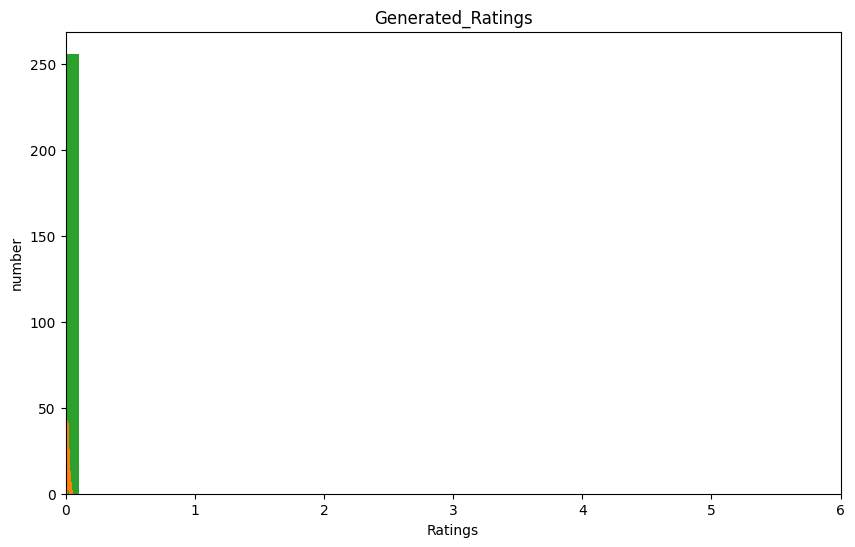

In [ ]:
#df.replace(0, float('nan'), inplace = True)
plt.figure(figsize=(10, 6))
for column_name in df.columns:
  plt.hist(df[column_name])
plt.xlim(0, 6)
plt.xlabel('Ratings') # x축 라벨 설정
plt.ylabel('number') # y축 라벨 설정
plt.title('Generated_Ratings') # 그래프 제목 설정
plt.show() # 그래프 출력

<Axes: xlabel='MovieID'>

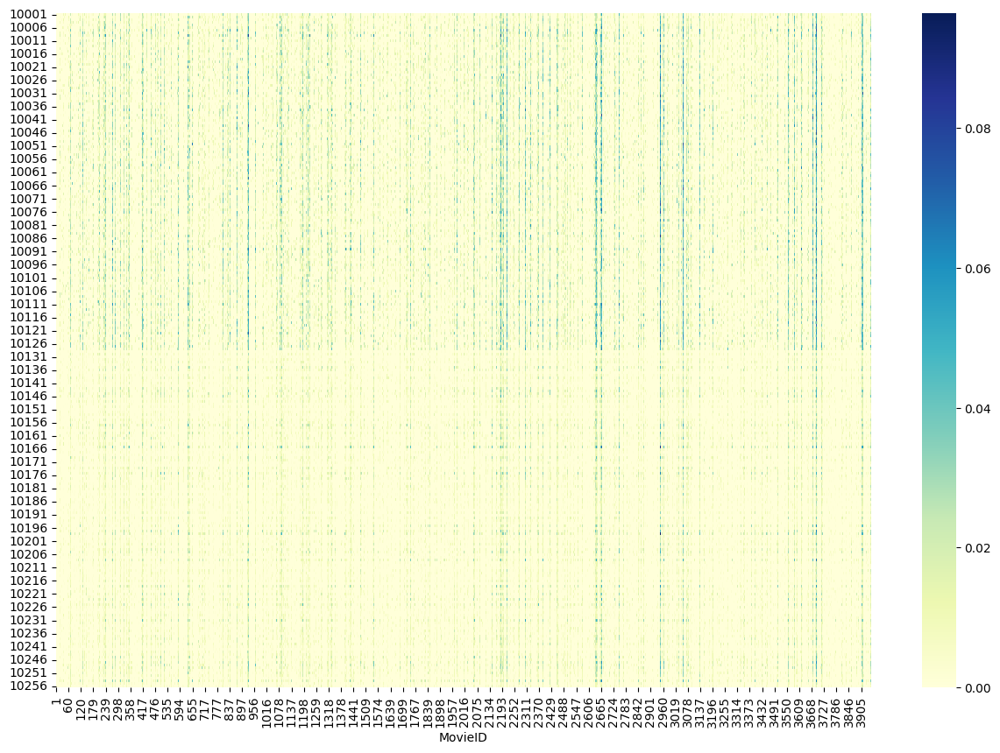

In [ ]:
fig, ax = plt.subplots(figsize=(15, 10))
sns.heatmap(df, cmap='YlGnBu', ax=ax)

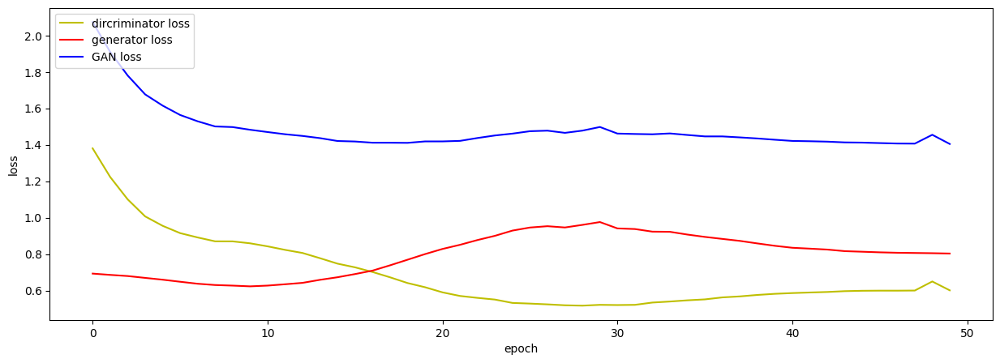

In [ ]:
import matplotlib.pyplot as plt

fig, loss_ax = plt.subplots(figsize = (15,5))

loss_ax.plot(loss_D_list, 'y', label = 'dircriminator loss')
loss_ax.plot(loss_G_list, 'r', label = 'generator loss')
loss_ax.plot(loss_GD_list, 'b', label = 'GAN loss')

loss_ax.set_xlabel('epoch')
loss_ax.set_ylabel('loss')
loss_ax.legend(loc='upper left')

plt.show()

##결측벡터

In [ ]:
latent_dim = 100
output_dim = 3706
epochs = 50
batch_size = 128
lr_d = 0.00005
lr_g = 0.00003
#조정하기~d를 늘려보자
n_iter_D = 2
n_iter_G = 1

In [ ]:
# 생성자 모델
Generator = Sequential()

Generator.add(Dense(128, input_shape=(latent_dim,), activation=LeakyReLU(0.2)))
Generator.add(BatchNormalization())

Generator.add(Dense(512, activation=LeakyReLU(0.2)))
Generator.add(BatchNormalization())
Generator.add(Dropout(0.3))

Generator.add(Dense(2048, activation=LeakyReLU(0.2)))
Generator.add(BatchNormalization())
Generator.add(Dropout(0.3))

#output_dim보다 커야함
Generator.add(Dense(4096, activation=LeakyReLU(0.2)))
Generator.add(BatchNormalization())

Generator.add(Dense(output_dim, activation='relu'))


# 판별자 모델
Discriminator = Sequential()
Discriminator.add(Dense(1028, input_shape=(output_dim,), activation=LeakyReLU(0.2)))
Discriminator.add(BatchNormalization())

Discriminator.add(Dense(512, activation=LeakyReLU(0.2)))
Discriminator.add(BatchNormalization())
Discriminator.add(Dropout(0.3))

Discriminator.add(Dense(256, activation=LeakyReLU(0.2)))
Discriminator.add(BatchNormalization())
Discriminator.add(Dropout(0.3))

Discriminator.add(Dense(128, activation=LeakyReLU(0.2)))
Discriminator.add(BatchNormalization())
Discriminator.add(Dropout(0.3))

Discriminator.add(Dense(1, activation='sigmoid'))


Doptimizer = tf.keras.optimizers.Adam(lr_d)
Goptimizer = tf.keras.optimizers.Adam(lr_g)


def get_noise(batch_size,latent_dim):
    return tf.random.normal([batch_size,latent_dim])

loss_D_list = []
loss_G_list = []
loss_GD_list = []

for epoch in tf.range(epochs):
    batch_input = X_train.sample(n=batch_size)


    #with tf.GradientTape() as t1, tf.GradientTape() as t2:
    with tf.GradientTape(persistent=True) as t1, tf.GradientTape(persistent=True) as t2:


      for iter in range(n_iter_G):
        generated_data = Generator(get_noise(batch_size,latent_dim))
        Z = Discriminator(generated_data)
        loss_G = -tf.reduce_mean(tf.math.log(Z))
        Ggradients = t2.gradient(loss_G,Generator.trainable_variables)
        #inf 방지??
        Ggradients = [tf.clip_by_value(grad, -1.0, 1.0) for grad in Ggradients]
        Goptimizer.apply_gradients(zip(Ggradients, Generator.trainable_variables))

      for iter in range(n_iter_D):
        generated_data = Generator(get_noise(batch_size,latent_dim))
        Z = Discriminator(generated_data)
        R = Discriminator(inputs)
        # 둘 다 minimize
        loss_D = -tf.reduce_mean(tf.math.log(R) + tf.math.log(1 - Z))
        #loss_G = -tf.reduce_mean(tf.math.log(Z))
        Dgradients = t1.gradient(loss_D, Discriminator.trainable_variables)
        #inf 방지??
        Dgradients = [tf.clip_by_value(grad, -1.0, 1.0) for grad in Dgradients]
        Doptimizer.apply_gradients(zip(Dgradients, Discriminator.trainable_variables))

    loss_D_list.append(loss_D)
    loss_G_list.append(loss_G)
    loss_GD_list.append(loss_D+loss_G)

    print(f'Epoch: {epoch}, Discriminator Loss: {loss_D}, Generator Loss: {loss_G}, GAN Loss: {loss_D+loss_G}')
    #print(f"epoch: {epoch} d_loss: {loss_D} g_loss: {loss_G}")

Epoch: 0, Discriminator Loss: 1.4291062355041504, Generator Loss: 0.7161720991134644, GAN Loss: 2.1452784538269043
Epoch: 1, Discriminator Loss: 1.376314401626587, Generator Loss: 0.6930912733078003, GAN Loss: 2.0694055557250977
Epoch: 2, Discriminator Loss: 1.3093664646148682, Generator Loss: 0.682380199432373, GAN Loss: 1.9917466640472412
Epoch: 3, Discriminator Loss: 1.2749483585357666, Generator Loss: 0.6720225811004639, GAN Loss: 1.9469709396362305
Epoch: 4, Discriminator Loss: 1.2267889976501465, Generator Loss: 0.6669814586639404, GAN Loss: 1.893770456314087
Epoch: 5, Discriminator Loss: 1.187170386314392, Generator Loss: 0.6633678674697876, GAN Loss: 1.8505382537841797
Epoch: 6, Discriminator Loss: 1.1297106742858887, Generator Loss: 0.6638801097869873, GAN Loss: 1.793590784072876
Epoch: 7, Discriminator Loss: 1.1258471012115479, Generator Loss: 0.6686474680900574, GAN Loss: 1.79449462890625
Epoch: 8, Discriminator Loss: 1.0840392112731934, Generator Loss: 0.6754561066627502, G

In [ ]:
df_missing_create = pd.DataFrame(generated_data, columns = ratings_df.columns)
df_missing_create.index = range(10001, 10001+len(df_missing_create))
df_missing_create = df_missing_create.rename_axis("UserID")

In [ ]:
df_missing_create

MovieID,1,2,3,4,5,6,7,8,9,10,...,3943,3944,3945,3946,3947,3948,3949,3950,3951,3952
UserID,,,,,,,,,,,,,,,,,,,,,
10001,0.0,0.000000,0.077285,0.0,0.000000,0.000000,0.0,0.0,0.0,0.010808,...,0.009251,0.0,0.009669,0.069953,0.0,0.093072,0.001897,0.0,0.0,0.000000
10002,0.0,0.000000,0.193691,0.0,0.044566,0.000000,0.0,0.0,0.0,0.159283,...,0.102340,0.0,0.000000,0.003332,0.0,0.133527,0.000000,0.0,0.0,0.004817
10003,0.0,0.000000,0.147183,0.0,0.000000,0.000000,0.0,0.0,0.0,0.117508,...,0.000000,0.0,0.000000,0.000000,0.0,0.096322,0.002516,0.0,0.0,0.000000
10004,0.0,0.060832,0.135926,0.0,0.008075,0.000000,0.0,0.0,0.0,0.151864,...,0.000991,0.0,0.000000,0.028022,0.0,0.060761,0.087388,0.0,0.0,0.000000
10005,0.0,0.023628,0.052314,0.0,0.014147,0.000000,0.0,0.0,0.0,0.042297,...,0.009039,0.0,0.000000,0.000000,0.0,0.061937,0.018287,0.0,0.0,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10124,0.0,0.000000,0.134200,0.0,0.000000,0.000000,0.0,0.0,0.0,0.181036,...,0.067120,0.0,0.024598,0.010674,0.0,0.038000,0.034621,0.0,0.0,0.000000
10125,0.0,0.000000,0.114342,0.0,0.000000,0.025255,0.0,0.0,0.0,0.155743,...,0.059226,0.0,0.000000,0.000000,0.0,0.090542,0.000000,0.0,0.0,0.000000
10126,0.0,0.102329,0.163641,0.0,0.068486,0.000000,0.0,0.0,0.0,0.147880,...,0.093636,0.0,0.008807,0.000000,0.0,0.088301,0.000000,0.0,0.0,0.000000


In [ ]:
max_val = df_missing_create.max().max()
print(max_val)

0.59774226


In [ ]:
zero_cols = (df_missing_create == 0).all(axis=0).sum()
print(zero_cols)

814


In [ ]:
df_missing = df_missing_create.copy()

In [ ]:
df_missing.to_csv(path + 'df_missing.csv', index=True, header=True)

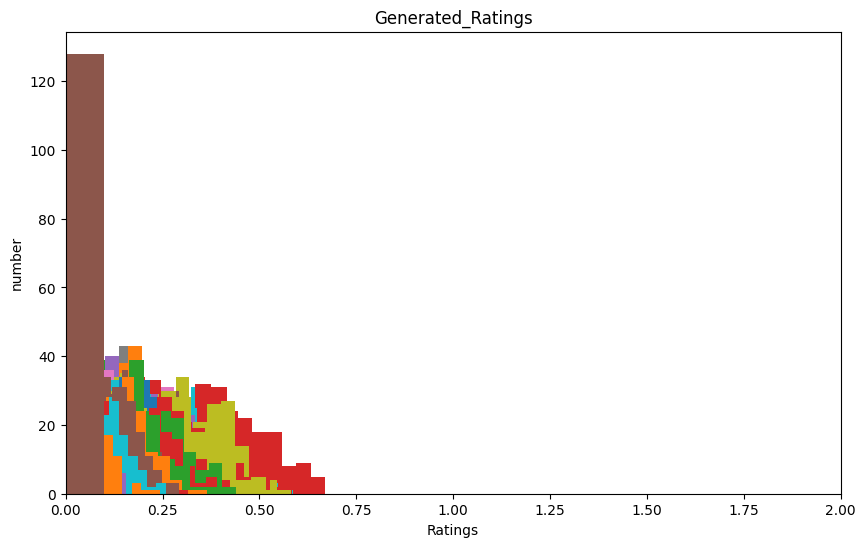

In [ ]:
#df.replace(0, float('nan'), inplace = True)
plt.figure(figsize=(10, 6))
for column_name in df_missing.columns:
  plt.hist(df_missing[column_name])
plt.xlim(0, 2)
plt.xlabel('Ratings') # x축 라벨 설정
plt.ylabel('number') # y축 라벨 설정
plt.title('Generated_Ratings') # 그래프 제목 설정
plt.show() # 그래프 출력

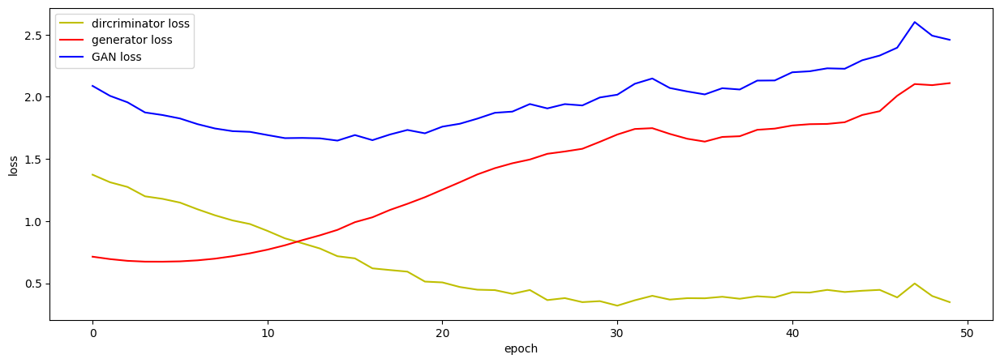

In [ ]:
import matplotlib.pyplot as plt

fig, loss_ax = plt.subplots(figsize = (15,5))

loss_ax.plot(loss_D_list, 'y', label = 'dircriminator loss')
loss_ax.plot(loss_G_list, 'r', label = 'generator loss')
loss_ax.plot(loss_GD_list, 'b', label = 'GAN loss')

loss_ax.set_xlabel('epoch')
loss_ax.set_ylabel('loss')
loss_ax.legend(loc='upper left')

plt.show()

## 둘이 합치기

In [ ]:
df = pd.read_csv(path + 'df.csv')
df_missing = pd.read_csv(path + 'df_missing.csv')

missing_df에 ['1':'0'] = [1000209 : 21384031] = [1:21] 비율로 존재

In [ ]:
#20000개 정도 threshold 해볼까
values_flattened = df_missing.values.flatten()  # DataFrame을 1차원 배열로 변환합니다
top_values = sorted(set(values_flattened), reverse=True)[:25000]

In [ ]:
values_flattened = np.where(np.isin(values_flattened, top_values), 1, 0)

# 1차원 배열을 다시 128 * 3706 크기의 데이터프레임으로 변환
df_missing_final = pd.DataFrame(values_flattened.reshape(128, 3706), index=df.index, columns=df.columns)

In [ ]:
df_final = df_missing_final * df

In [ ]:
df_final = np.ceil(df_final)

In [ ]:
counts = df_final.stack().value_counts()

In [ ]:
counts

0.0    459047
2.0      7030
1.0      3753
3.0      3462
4.0       802
5.0       235
6.0        39
dtype: int64

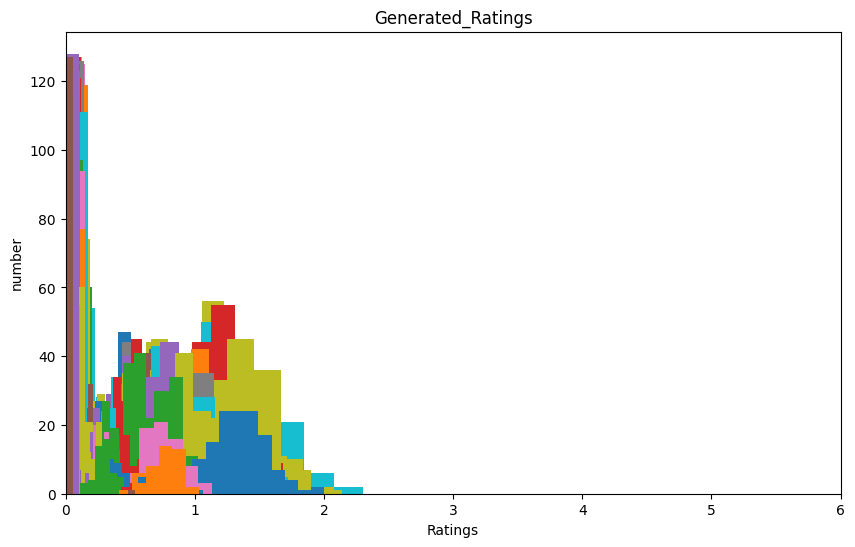

In [ ]:
#df.replace(0, float('nan'), inplace = True)
plt.figure(figsize=(10, 6))
for column_name in df_final.columns:
  plt.hist(df_final[column_name])
plt.xlim(0, 6)
plt.xlabel('Ratings') # x축 라벨 설정
plt.ylabel('number') # y축 라벨 설정
plt.title('Generated_Ratings') # 그래프 제목 설정
plt.show() # 그래프 출력

In [ ]:
df_final.index.name = 'UserID'
df_final.columns.name = 'MovieID'
df_final.name = 'Rating'

# New GAN

https://github.com/eriklindernoren/PyTorch-GAN/blob/master/implementations/cgan/cgan.py

## 변형

In [ ]:
import tensorflow as tf
from tensorflow.keras.layers import Input, Conv2D, BatchNormalization, ReLU, UpSampling2D
from tensorflow.keras.models import Model

# Encoder 정의
def build_encoder(input_shape):
    inputs = Input(shape=input_shape)

    # 1st Convolutional 층
    x = Conv2D(1, (3, 3), strides=(2, 2), padding='same')(inputs)
    x = BatchNormalization()(x)
    x = ReLU()(x)

    # 2nd Convolutional 층
    x = Conv2D(16, (3, 3), strides=(2, 2), padding='same')(x)
    x = BatchNormalization()(x)
    x = ReLU()(x)

    # 3rd Convolutional 층
    x = Conv2D(32, (3, 3), strides=(2, 2), padding='same')(x)
    x = BatchNormalization()(x)
    x = ReLU()(x)

    # 4th Convolutional 층
    x = Conv2D(64, (3, 3), strides=(2, 2), padding='same')(x)
    x = BatchNormalization()(x)
    x = ReLU()(x)

    # 5th Convolutional 층
    x = Conv2D(128, (3, 3), strides=(2, 2), padding='same')(x)
    x = BatchNormalization()(x)
    x = ReLU()(x)

    # 6th Convolutional 층
    x = Conv2D(256, (3, 3), strides=(2, 2), padding='same')(x)
    x = BatchNormalization()(x)
    x = ReLU()(x)

    return Model(inputs, x)

# Decoder 정의
def build_decoder(encoded_shape):
    inputs = Input(shape=encoded_shape)

    # 1st Convolutional 층
    x = Conv2D(256, (3, 3), padding='same')(inputs)
    x = BatchNormalization()(x)
    x = ReLU()(x)

    x = UpSampling2D((2, 2))(x)

    # 2nd Convolutional 층
    x = Conv2D(128, (3, 3), padding='same')(x)
    x = BatchNormalization()(x)
    x = ReLU()(x)

    x = UpSampling2D((2, 2))(x)

    # 3rd Convolutional 층
    x = Conv2D(64, (3, 3), padding='same')(x)
    x = BatchNormalization()(x)
    x = ReLU()(x)

    # Upsampling 층
    x = UpSampling2D((2, 2))(x)

    # 4th Convolutional 층
    x = Conv2D(32, (3, 3), padding='same')(x)
    x = BatchNormalization()(x)
    x = ReLU()(x)

    # Upsampling 층
    x = UpSampling2D((2, 2))(x)

    # 5th Convolutional 층
    x = Conv2D(16, (3, 3), padding='same')(x)
    x = BatchNormalization()(x)
    x = ReLU()(x)

    # Upsampling 층
    x = UpSampling2D((2, 2))(x)

    # 6th Convolutional 층
    x = Conv2D(1, (3, 3), padding='same')(x)  # 3개의 채널로 디코딩 (RGB 이미지)
    x = BatchNormalization()(x)
    x = ReLU()(x)

    x = UpSampling2D((2, 2))(x)

    return Model(inputs, x)

# 모델 구축
input_data = np.random.rand(3883,1)
batch_size = 1

data_3d = np.expand_dims(y_train.sample(n=128), axis=-1)

# 모델 구축
input_shape = input_data.shape
input_shape = Input(batch_shape=(batch_size,)+input_shape)

#input_shape = (6040, 3883, 1)  # 입력 이미지 크기
encoded_shape = (2, 61, 256)  # 인코딩된 특성 맵 크기

encoder = build_encoder(input_shape)
decoder = build_decoder(encoded_shape)

# 오토인코더 모델 정의
inputs = Input(shape=input_shape)
encoded = encoder(inputs)
decoded = decoder(encoded)
autoencoder = Model(inputs, decoded)

# 모델 요약
autoencoder.summary()


autoencoder.compile(optimizer=Adam(lr=0.001), loss='mean_squared_error')

autoencoder.fit(input_data, data_3d, epochs=10, batch_size=128)

# 재구성 테스트 (디코더만 사용하여 입력 데이터 재구성)
encoded_data = encoder.predict(input_data)
decoded_data = decoder.predict(encoded_data)

print("Input Data Shape:", input_data.shape)
print("Encoded Data Shape:", encoded_data.shape)
print("Decoded Data Shape:", decoded_data.shape)

TypeError: ignored

In [ ]:
data_3d.shape

(128, 3883, 1)

In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.layers import Input, Dense, BatchNormalization
from tensorflow.keras.models import Model

# 랜덤한 6040x3883 크기의 피벗 테이블 데이터 생성 (임의로 생성한 예시 데이터)
# 실제 데이터를 사용하려면 이 부분을 실제 데이터 로딩 및 전처리로 대체해야 합니다.
input_data = np.random.rand(6040, 3883)

# 모델 구축
input_shape = input_data.shape

# 인코더 정의
encoder_inputs = Input(shape=input_shape)
encoded = Dense(128, activation='relu')(encoder_inputs)
encoded = BatchNormalization()(encoded)

encoded = Dense(128, activation='relu')(encoded)
encoded = BatchNormalization()(encoded)

encoded = Dense(512, activation='relu')(encoded)
encoded = BatchNormalization()(encoded)

encoded = Dense(1024, activation='relu')(encoded)
encoded = BatchNormalization()(encoded)

encoded = Dense(2048, activation='relu')(encoded)
encoded = BatchNormalization()(encoded)

encoded = Dense(4096, activation='relu')(encoded)

# 디코더 정의
decoded = Dense(4096, activation='relu')(encoded)

decoded = Dense(4096, activation='relu')(encoded)

decoded = Dense(4096, activation='relu')(encoded)

decoded = Dense(input_shape[1], activation='sigmoid')(decoded)  # 출력 데이터의 크기에 맞는 활성화 함수 사용

# 오토인코더 모델 정의
autoencoder = Model(encoder_inputs, decoded)

# 모델 컴파일
autoencoder.compile(optimizer='adam', loss='mean_squared_error')

# 모델 학습
autoencoder.fit(input_data, input_data, epochs=10, batch_size=32)

# 인코더와 디코더 분리 (훈련 후 디코더만 사용하거나 재구성용으로 인코더만 사용 가능)
encoder = Model(encoder_inputs, encoded)
decoder_input = Input(shape=(4096,))  # 디코더의 입력 크기에 맞게 입력 셰이프 정의
decoder_layer = autoencoder.layers[-1]  # 디코더의 마지막 레이어를 가져옴
decoder = Model(decoder_input, decoder_layer(decoder_input))

# 재구성 테스트 (디코더만 사용하여 입력 데이터 재구성)
encoded_data = encoder.predict(input_data)
decoded_data = decoder.predict(encoded_data)

print("Input Data Shape:", input_data.shape)
print("Encoded Data Shape:", encoded_data.shape)
print("Decoded Data Shape:", decoded_data.shape)


Epoch 1/10


ValueError: ignored

In [ ]:
input_shape

(6040, 3883)

In [ ]:
latent_dim = 3883
output_dim = 3883
epochs = 50
batch_size = 1024
lr_d = 0.00005
lr_g = 0.00003
n_iter_D = 1
n_iter_G = 1

In [ ]:
import argparse
import os
import numpy as np
import math

import torchvision.transforms as transforms
from torchvision.utils import save_image

from torch.utils.data import DataLoader
from torchvision import datasets
from torch.autograd import Variable

import torch.nn as nn
import torch.nn.functional as F
import torch

os.makedirs("images", exist_ok=True)

parser = argparse.ArgumentParser()
parser.add_argument("--n_epochs", type=int, default=50, help="number of epochs of training")
parser.add_argument("--batch_size", type=int, default=64, help="size of the batches")
parser.add_argument("--lr", type=float, default=0.0002, help="adam: learning rate")
parser.add_argument("--b1", type=float, default=0.5, help="adam: decay of first order momentum of gradient")
parser.add_argument("--b2", type=float, default=0.999, help="adam: decay of first order momentum of gradient")
parser.add_argument("--n_cpu", type=int, default=8, help="number of cpu threads to use during batch generation")
parser.add_argument("--latent_dim", type=int, default=100, help="dimensionality of the latent space")
parser.add_argument("--img_size", type=int, default=28, help="size of each image dimension")
parser.add_argument("--channels", type=int, default=1, help="number of image channels")
parser.add_argument("--sample_interval", type=int, default=400, help="interval betwen image samples")
opt = parser.parse_args()
print(opt)

img_shape = (opt.channels, opt.img_size, opt.img_size)

cuda = True if torch.cuda.is_available() else False


class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()

        def block(in_feat, out_feat, normalize=True):
            layers = [nn.Linear(in_feat, out_feat)]
            if normalize:
                layers.append(nn.BatchNorm1d(out_feat, 0.8))
            layers.append(nn.LeakyReLU(0.2, inplace=True))
            return layers

        self.model = nn.Sequential(
            *block(opt.latent_dim, 128, normalize=False),
            *block(128, 256),
            *block(256, 512),
            *block(512, 1024),
            nn.Linear(1024, int(np.prod(img_shape))),
            nn.Tanh()
        )

    def forward(self, z):
        img = self.model(z)
        img = img.view(img.size(0), *img_shape)
        return img


class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()

        self.model = nn.Sequential(
            nn.Linear(int(np.prod(img_shape)), 512),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(512, 256),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(256, 1),
            nn.Sigmoid(),
        )

    def forward(self, img):
        img_flat = img.view(img.size(0), -1)
        validity = self.model(img_flat)

        return validity


# Loss function
adversarial_loss = torch.nn.BCELoss()

# Initialize generator and discriminator
generator = Generator()
discriminator = Discriminator()

if cuda:
    generator.cuda()
    discriminator.cuda()
    adversarial_loss.cuda()

# Configure data loader
os.makedirs("../../data/mnist", exist_ok=True)
dataloader = torch.utils.data.DataLoader(
    datasets.MNIST(
        "../../data/mnist",
        train=True,
        download=True,
        transform=transforms.Compose(
            [transforms.Resize(opt.img_size), transforms.ToTensor(), transforms.Normalize([0.5], [0.5])]
        ),
    ),
    batch_size=opt.batch_size,
    shuffle=True,
)

# Optimizers
optimizer_G = torch.optim.Adam(generator.parameters(), lr=opt.lr, betas=(opt.b1, opt.b2))
optimizer_D = torch.optim.Adam(discriminator.parameters(), lr=opt.lr, betas=(opt.b1, opt.b2))

Tensor = torch.cuda.FloatTensor if cuda else torch.FloatTensor

# ----------
#  Training
# ----------

for epoch in range(opt.n_epochs):
    for i, (imgs, _) in enumerate(dataloader):

        # Adversarial ground truths
        valid = Variable(Tensor(imgs.size(0), 1).fill_(1.0), requires_grad=False)
        fake = Variable(Tensor(imgs.size(0), 1).fill_(0.0), requires_grad=False)

        # Configure input
        real_imgs = Variable(imgs.type(Tensor))

        # -----------------
        #  Train Generator
        # -----------------

        optimizer_G.zero_grad()

        # Sample noise as generator input
        z = Variable(Tensor(np.random.normal(0, 1, (imgs.shape[0], opt.latent_dim))))

        # Generate a batch of images
        gen_imgs = generator(z)

        # Loss measures generator's ability to fool the discriminator
        g_loss = adversarial_loss(discriminator(gen_imgs), valid)

        g_loss.backward()
        optimizer_G.step()

        # ---------------------
        #  Train Discriminator
        # ---------------------

        optimizer_D.zero_grad()

        # Measure discriminator's ability to classify real from generated samples
        real_loss = adversarial_loss(discriminator(real_imgs), valid)
        fake_loss = adversarial_loss(discriminator(gen_imgs.detach()), fake)
        d_loss = (real_loss + fake_loss) / 2

        d_loss.backward()
        optimizer_D.step()

        print(
            "[Epoch %d/%d] [Batch %d/%d] [D loss: %f] [G loss: %f]"
            % (epoch, opt.n_epochs, i, len(dataloader), d_loss.item(), g_loss.item())
        )

        batches_done = epoch * len(dataloader) + i
        if batches_done % opt.sample_interval == 0:
            save_image(gen_imgs.data[:25], "images/%d.png" % batches_done, nrow=5, normalize=True)

# 새로운 GAN

In [ ]:
# 피봇테이블을 이미지로 처리
image_array = ratings_df.to_numpy()

# 이미지를 0~255 범위로 정규화
image_np_array = (image_array / np.max(image_array) * 255).astype(np.uint8)

# 이미지를 GAN에 대입할 수 있는 형태로 변환 (예: (1, 64, 64, 1))
image_size = (6040, 3883)

image_np_array = image_np_array.reshape(1, *image_size, 1)

In [ ]:
image_np_array.shape

(1, 6040, 3883, 1)

In [ ]:
# Generator
Generator = tf.keras.Sequential([
    tf.keras.layers.Input(256,30),
    tf.keras.layers.Dense(256, activation='relu'),
    tf.keras.layers.Dense(784, activation='sigmoid')])

# Discriminator
Discriminator = tf.keras.Sequential([
    tf.keras.layers.Input(784),
    tf.keras.layers.Dense(256, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')])

Doptimizer = tf.keras.optimizers.Adam(0.001)
Goptimizer = tf.keras.optimizers.Adam(0.001)

def get_noise(batch_size,n_noise):
    return tf.random.normal([batch_size,n_noise])

@tf.function
def train_step(inputs):

    with tf.GradientTape() as t1, tf.GradientTape() as t2:

        G = Generator(get_noise(30,256))

        Z = Discriminator(G)
        R = Discriminator(inputs)
        loss_D = -tf.reduce_mean(tf.math.log(R) + tf.math.log(1 - Z))
        loss_G = -tf.reduce_mean(tf.math.log(Z))

    Dgradients = t1.gradient(loss_D, Discriminator.trainable_variables)
    Doptimizer.apply_gradients(zip(Dgradients, Discriminator.trainable_variables))

    Ggradients = t2.gradient(loss_G,Generator.trainable_variables)
    Goptimizer.apply_gradients(zip(Ggradients, Generator.trainable_variables))


total_batch = int(60000/30)

for epoch in tf.range(15):
    k = 0
    for i in tf.range(total_batch):
        batch_input = mnist_x.T[i*30:(i+1)*30]

        inputs = tf.Variable([batch_input],tf.float32)
        train_step(inputs)
        print(k)
        k = k + 1

        if k%100 == 0:
            G = Generator(get_noise(10,256))

            fig, ax = plt.subplots(1,10 ,figsize=(10, 1))

            for j in range(10):
                ax[j].set_axis_off()
                ax[j].imshow(np.reshape(G[j], (28, 28)).T,cmap='gray')
            plt.pause(0.001)
            plt.show()

In [ ]:
import itertools
import math
import time

import torch
import torchvision
import torch.nn as nn
import torchvision.datasets as dsets
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
from IPython import display
from torch.autograd import Variable

%matplotlib inline

In [ ]:
class Discriminator(nn.Module):
    def __init__(self):
        super().__init__()
        self.model = nn.Sequential(
            nn.Linear(23453320, 4096),                 # MNIST 이미지 사이즈: 28*28 => 일렬로 늘이면 784인 벡터 => 얘를 input으로 받아 1024로 확장
            nn.LeakyReLU(0.2, inplace=True),      # Leaky ReLU => x if x>0 else a*x, 여기서 a는 0.2
            nn.Dropout(0.3),                      # 30% drop out

            nn.Linear(4096, 512),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Dropout(0.3),

            nn.Linear(512, 256),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Dropout(0.3),

            nn.Linear(256, 1),
            nn.Sigmoid()                          # 시그모이드를 통해 "진짜 이미지일 확률" 추출
        )

    def forward(self, x):
        out = self.model(x.view(x.size(0), 784))  #
        out = out.view(out.size(0), -1)           # 배치사이즈 * 1의 벡터가 결과값으로 나오게 됨
        return out

In [ ]:
class Generator(nn.Module):
    def __init__(self):
        super().__init__()
        self.model = nn.Sequential(
            nn.Linear(100, 256),                  # size가 100인 noise를 인풋으로 받는다, 가중치 벡터를 곱해 256차원 벡터로 확장
            nn.LeakyReLU(0.2, inplace=True),      # Leaky ReLU

            nn.Linear(256, 512),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Linear(512, 4096),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Linear(4096, 23453320),
            nn.Tanh()
        )

    def forward(self, x):
        x = x.view(x.size(0), 100)
        out = self.model(x)
        return out

In [ ]:
discriminator = Discriminator().cuda()
generator = Generator().cuda()

In [ ]:
criterion = nn.BCELoss()
lr = 0.0002
d_optimizer = torch.optim.Adam(discriminator.parameters(), lr=lr)
g_optimizer = torch.optim.Adam(generator.parameters(), lr=lr)

# UMAP

In [ ]:
!pip install umap-learn

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 90.8/90.8 kB 1.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 24.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for umap-learn: filename=umap_learn-0.5.4-py3-none-any.whl size=86770 sha256=1ddbb8fbeecb5feab4b9ca0faeeeeabbdae5d8c255f99e7e7ec78686eacb3a78
  Stored in directory: /root/.cache/pip/wheels/fb/66/29/199acf5784d0f7b8add6d466175ab45506c96e386ed5dd0633
  Created wheel for pynndescent: filename=pynndescent-0.5.10-py3-none-any.whl size=55615 sha256=996840f464f23f9284e1d43920dbe29032149463bccec7c1accaca1d852848c2
  Stored in directory: /root/.cache/pip/wheels/4a/38/5d/f60a40a66a9512b7e5e83517ebc2d1b42d857be97d135f1096
Successfully built umap-learn pynndescent


In [ ]:
import umap

In [ ]:
df_fake = pd.read_csv(path + 'df_fake_GAN.csv')

/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_spectral_embedding.py:274: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


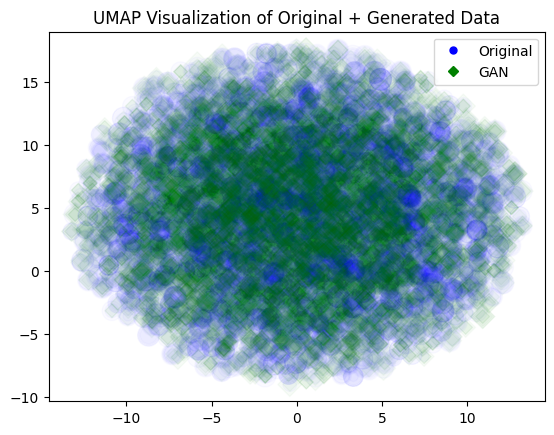

In [ ]:
size = 10000

ratings_sample = ratings.sample(size, random_state=100).reset_index(drop=True)
fake_sample = df_fake.sample(size, random_state=100).reset_index(drop=True)

merged_sample = pd.concat([ratings_sample, fake_sample], axis = 0).reset_index(drop=True)

# 평점 데이터를 가져와서 점의 크기로 사용할 수 있도록 전처리
ratings_real = merged_sample['Rating'].values
# 점의 크기는 평점에 비례하도록 설정

# sizes_real = ratings_real[:size]**3
# sizes_fake = ratings_real[size:]**3

sizes_real = ratings_real[:size]*50
sizes_fake = ratings_real[size:]*50

# umap을 사용하여 데이터를 저차원으로 투영
reducer_real = umap.UMAP(n_neighbors = 3, random_state=100)
embedding_real = reducer_real.fit_transform(merged_sample[['MovieID', 'UserID']].values)


# movie_id = 1
# movie_index = merged_sample[merged_sample['MovieID'] == movie_id].index[0]
# movie_name = movies.loc[movies['MovieID'] == movie_id, 'Title'].item()
# plt.annotate(movie_name,
#              xy=(embedding_real[movie_index, 0], embedding_real[movie_index, 1]),
#              xytext=(embedding_real[movie_index, 0]-1, embedding_real[movie_index, 1]+1),
#              xycoords='data',
#              arrowprops=dict(facecolor='black', arrowstyle = 'simple'),
#              horizontalalignment='right', verticalalignment='top',
#             )

# movie_id = 356
# movie_index = merged_sample[merged_sample['MovieID'] == movie_id].index[0]
# movie_name = movies.loc[movies['MovieID'] == movie_id, 'Title'].item()
# plt.annotate(movie_name,
#              xy=(embedding_real[movie_index, 0], embedding_real[movie_index, 1]),
#              xytext=(embedding_real[movie_index, 0]-1, embedding_real[movie_index, 1]+1),
#              xycoords='data',
#              arrowprops=dict(facecolor='black', arrowstyle = 'simple'),
#              horizontalalignment='right', verticalalignment='top',
#             )

# movie_id = 3114
# movie_index = merged_sample[merged_sample['MovieID'] == movie_id].index[0]
# movie_name = movies.loc[movies['MovieID'] == movie_id, 'Title'].item()
# plt.annotate(movie_name,
#              xy=(embedding_real[movie_index, 0], embedding_real[movie_index, 1]),
#              xytext=(embedding_real[movie_index, 0]-1, embedding_real[movie_index, 1]+1),
#              xycoords='data',
#              arrowprops=dict(facecolor='black', arrowstyle = 'simple'),
#              horizontalalignment='right', verticalalignment='top',
#             )

# # 새로 생성된 데이터
# movie_id = 1159
# movie_index = merged_sample[merged_sample['MovieID'] == movie_id].index[0]
# movie_name = movies.loc[movies['MovieID'] == movie_id, 'Title'].item()
# plt.annotate(movie_name,
#              xy=(embedding_real[movie_index, 0], embedding_real[movie_index, 1]),
#              xytext=(embedding_real[movie_index, 0]-1, embedding_real[movie_index, 1]-3),
#              xycoords='data',
#              arrowprops=dict(facecolor='black', arrowstyle = 'simple'),
#              horizontalalignment='right', verticalalignment='top',
#             )


# 시각화
plt.scatter(embedding_real[:size, 0], embedding_real[:size, 1], s=sizes_real, alpha=0.01, color='blue', label='Original')
plt.scatter(embedding_real[size:, 0], embedding_real[size:, 1], s=sizes_fake, alpha=0.03, color='green', marker='D', label='GAN')
plt.title('UMAP Visualization of Original + Generated Data')
# 범례 추가
legend_markers = [plt.Line2D([0], [0], color='blue', marker='o', linestyle='', markersize=5),
                  plt.Line2D([0], [0], color='green', marker='D', linestyle='', markersize=5)]
legend_labels = ['Original', 'GAN']
plt.legend(legend_markers, legend_labels)
plt.show()

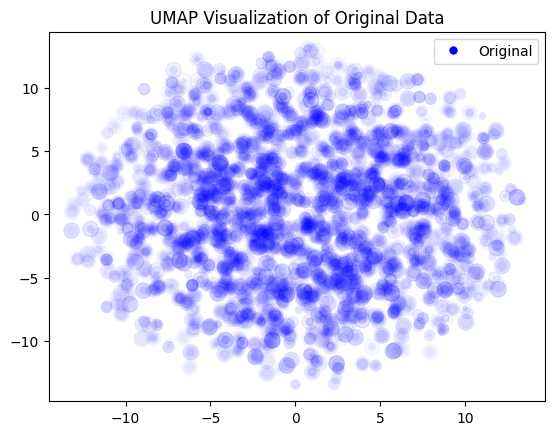

In [ ]:
# movie_id = 1
# movie_index = merged_sample[merged_sample['MovieID'] == movie_id].index[0]
# movie_name = movies.loc[movies['MovieID'] == movie_id, 'Title'].item()
# plt.annotate(movie_name,
#              xy=(embedding_real[movie_index, 0], embedding_real[movie_index, 1]),
#              xytext=(embedding_real[movie_index, 0]-1, embedding_real[movie_index, 1]+1),
#              xycoords='data',
#              arrowprops=dict(facecolor='black', arrowstyle = 'simple'),
#              horizontalalignment='right', verticalalignment='top',
#             )

# movie_id = 356
# movie_index = merged_sample[merged_sample['MovieID'] == movie_id].index[0]
# movie_name = movies.loc[movies['MovieID'] == movie_id, 'Title'].item()
# plt.annotate(movie_name,
#              xy=(embedding_real[movie_index, 0], embedding_real[movie_index, 1]),
#              xytext=(embedding_real[movie_index, 0]-1, embedding_real[movie_index, 1]+1),
#              xycoords='data',
#              arrowprops=dict(facecolor='black', arrowstyle = 'simple'),
#              horizontalalignment='right', verticalalignment='top',
#             )

# movie_id = 3114
# movie_index = merged_sample[merged_sample['MovieID'] == movie_id].index[0]
# movie_name = movies.loc[movies['MovieID'] == movie_id, 'Title'].item()
# plt.annotate(movie_name,
#              xy=(embedding_real[movie_index, 0], embedding_real[movie_index, 1]),
#              xytext=(embedding_real[movie_index, 0]-1, embedding_real[movie_index, 1]+1),
#              xycoords='data',
#              arrowprops=dict(facecolor='black', arrowstyle = 'simple'),
#              horizontalalignment='right', verticalalignment='top',
#             )

# # 새로 생성된 데이터
# movie_id = 1159
# movie_index = merged_sample[merged_sample['MovieID'] == movie_id].index[0]
# movie_name = movies.loc[movies['MovieID'] == movie_id, 'Title'].item()
# plt.annotate(movie_name,
#              xy=(embedding_real[movie_index, 0], embedding_real[movie_index, 1]),
#              xytext=(embedding_real[movie_index, 0]-1, embedding_real[movie_index, 1]-3),
#              xycoords='data',
#              arrowprops=dict(facecolor='black', arrowstyle = 'simple'),
#              horizontalalignment='right', verticalalignment='top',
#             )




# 시각화
plt.scatter(embedding_real[:size, 0], embedding_real[:size, 1], s=sizes_real, alpha=0.03, color='blue', label='Original')
plt.title('UMAP Visualization of Original Data')
# 범례 추가
legend_markers = [plt.Line2D([0], [0], color='blue', marker='o', linestyle='', markersize=5)]
legend_labels = ['Original']
plt.legend(legend_markers, legend_labels)
plt.show()

In [ ]:
movie_id_list = movies['MovieID'].tolist()
ratings_movie_list = ratings['MovieID'].tolist()

not_in_movie_list = []
for movie_id in movie_id_list:
  if movie_id not in ratings_movie_list:
    not_in_movie_list.append(movie_id)

In [ ]:
# 'title' 열에서 'toy story' 단어가 포함된 영화 찾기
toy_story_movies = movies[movies['Title'].str.contains('toy story', case=False)]

print(toy_story_movies)

      MovieID               Title                       Genres
0           1    Toy Story (1995)  Animation|Children's|Comedy
3045     3114  Toy Story 2 (1999)  Animation|Children's|Comedy


/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_spectral_embedding.py:274: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


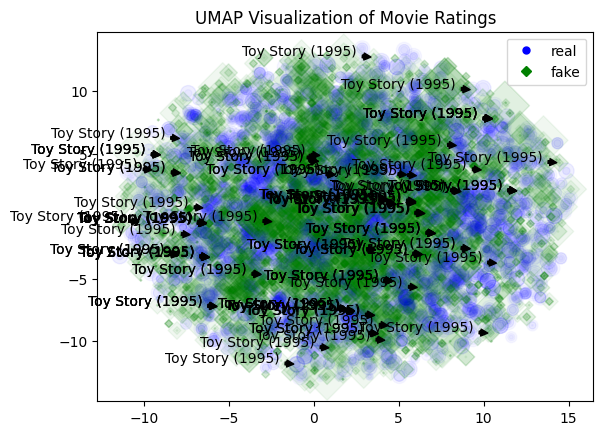

In [ ]:
size = 10000

ratings_sample = ratings.sample(size, random_state=100).reset_index(drop=True)
fake_sample = df_fake.sample(size, random_state=100).reset_index(drop=True)

merged_sample = pd.concat([ratings_sample, fake_sample], axis = 0).reset_index(drop=True)

# 평점 데이터를 가져와서 점의 크기로 사용할 수 있도록 전처리
ratings_real = merged_sample['Rating'].values
# 점의 크기는 평점에 비례하도록 설정

sizes_real = ratings_real[:size]**3
sizes_fake = ratings_real[size:]**4

# umap을 사용하여 데이터를 저차원으로 투영
reducer_real = umap.UMAP(n_neighbors = 3, random_state=100)
embedding_real = reducer_real.fit_transform(merged_sample[['MovieID', 'UserID']].values)


movie_id = 1
movie_index = merged_sample[merged_sample['MovieID'] == movie_id].index
movie_name = movies.loc[movies['MovieID'] == movie_id, 'Title'].item()
for movie_index_one in movie_index:
  plt.annotate(movie_name,
              xy=(embedding_real[movie_index_one, 0], embedding_real[movie_index_one, 1]),
              xytext=(embedding_real[movie_index_one, 0]-1, embedding_real[movie_index_one, 1]+1),
              xycoords='data',
              arrowprops=dict(facecolor='black', arrowstyle = 'simple'),
              horizontalalignment='right', verticalalignment='top',
              )



# 시각화
plt.scatter(embedding_real[:size, 0], embedding_real[:size, 1], s=sizes_real, alpha=0.03, color='blue', label='real')
plt.scatter(embedding_real[size:, 0], embedding_real[size:, 1], s=sizes_fake, alpha=0.06, color='green', marker='D', label='real')
plt.title('UMAP Visualization of Movie Ratings')
# 범례 추가
legend_markers = [plt.Line2D([0], [0], color='blue', marker='o', linestyle='', markersize=5),
                  plt.Line2D([0], [0], color='green', marker='D', linestyle='', markersize=5)]
legend_labels = ['real', 'fake']
plt.legend(legend_markers, legend_labels)
plt.show()

/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_spectral_embedding.py:274: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


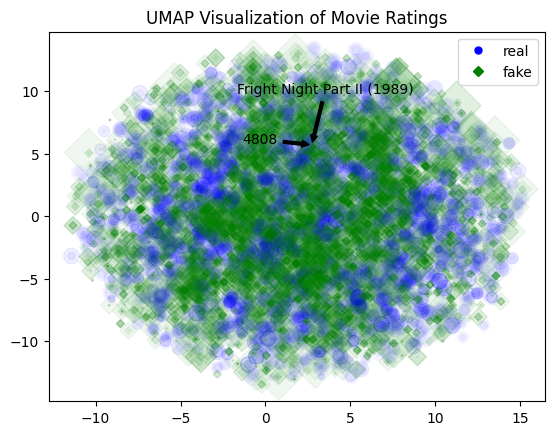

In [ ]:
size = 10000

ratings_sample = ratings.sample(size, random_state=100).reset_index(drop=True)
fake_sample = df_fake.sample(size, random_state=100).reset_index(drop=True)

merged_sample = pd.concat([ratings_sample, fake_sample], axis = 0).reset_index(drop=True)

# 평점 데이터를 가져와서 점의 크기로 사용할 수 있도록 전처리
ratings_real = merged_sample['Rating'].values
# 점의 크기는 평점에 비례하도록 설정

sizes_real = ratings_real[:size]**3
sizes_fake = ratings_real[size:]**4

# umap을 사용하여 데이터를 저차원으로 투영
reducer_real = umap.UMAP(n_neighbors = 3, random_state=100)
embedding_real = reducer_real.fit_transform(merged_sample[['MovieID', 'UserID']].values)


user_id = 4808
user_index = merged_sample[merged_sample['UserID'] == user_id].index[1]
plt.annotate(user_id,
            xy=(embedding_real[user_index, 0], embedding_real[user_index, 1]),
            xytext=(embedding_real[user_index, 0]-2, embedding_real[user_index, 1]+1),
            xycoords='data',
            arrowprops=dict(facecolor='black', arrowstyle = 'simple'),
            horizontalalignment='right', verticalalignment='top',
            )
# for user_index_one in user_index:
#   plt.annotate(user_id,
#               xy=(embedding_real[user_index_one, 0], embedding_real[user_index_one, 1]),
#               xytext=(embedding_real[user_index_one, 0]-1, embedding_real[user_index_one, 1]+1),
#               xycoords='data',
#               arrowprops=dict(facecolor='black', arrowstyle = 'simple'),
#               horizontalalignment='right', verticalalignment='top',
#               )


movie_id = 2868
movie_index = merged_sample[merged_sample['MovieID'] == movie_id].index[0]
movie_name = movies.loc[movies['MovieID'] == movie_id, 'Title'].item()
plt.annotate(movie_name,
            xy=(embedding_real[movie_index, 0], embedding_real[movie_index, 1]),
            xytext=(embedding_real[movie_index, 0]+6, embedding_real[movie_index, 1]+5),
            xycoords='data',
            arrowprops=dict(facecolor='black', arrowstyle = 'simple'),
            horizontalalignment='right', verticalalignment='top',
            )
# for movie_index_one in movie_index:
#   plt.annotate(movie_name,
#               xy=(embedding_real[movie_index_one, 0], embedding_real[movie_index_one, 1]),
#               xytext=(embedding_real[movie_index_one, 0]+3, embedding_real[movie_index_one, 1]+3),
#               xycoords='data',
#               arrowprops=dict(facecolor='black', arrowstyle = 'simple'),
#               horizontalalignment='right', verticalalignment='top',
#               )


# 시각화
plt.scatter(embedding_real[:size, 0], embedding_real[:size, 1], s=sizes_real, alpha=0.03, color='blue', label='real')
plt.scatter(embedding_real[size:, 0], embedding_real[size:, 1], s=sizes_fake, alpha=0.06, color='green', marker='D', label='real')
plt.title('UMAP Visualization of Movie Ratings')
# 범례 추가
legend_markers = [plt.Line2D([0], [0], color='blue', marker='o', linestyle='', markersize=5),
                  plt.Line2D([0], [0], color='green', marker='D', linestyle='', markersize=5)]
legend_labels = ['real', 'fake']
plt.legend(legend_markers, legend_labels)
plt.show()

### pivot

In [ ]:
#평점 df
movie_id_list = movies['MovieID'].tolist()
df_pivot = ratings.pivot_table(index='UserID', columns='MovieID', values='Rating', fill_value = 0)
df_pivot = df_pivot.reindex(columns=movie_id_list, fill_value=0)

In [ ]:
df_pivot

MovieID,1,2,3,4,5,6,7,8,9,10,...,3943,3944,3945,3946,3947,3948,3949,3950,3951,3952
UserID,,,,,,,,,,,,,,,,,,,,,
1,5,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,2,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6036,0,0,0,2,0,3,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6037,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6038,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
#평점 df
df_fake_pivot = df_fake.pivot_table(index='UserID', columns='MovieID', values='Rating', fill_value = 0)
df_fake_pivot = df_fake_pivot.reindex(columns=movie_id_list, fill_value=0)

In [ ]:
df_fake_pivot

MovieID,1,2,3,4,5,6,7,8,9,10,...,3943,3944,3945,3946,3947,3948,3949,3950,3951,3952
UserID,,,,,,,,,,,,,,,,,,,,,
10001,3,0,3,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10002,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10003,3,0,3,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10004,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10005,3,0,3,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14092,2,0,2,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
14093,3,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
14094,0,0,3,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


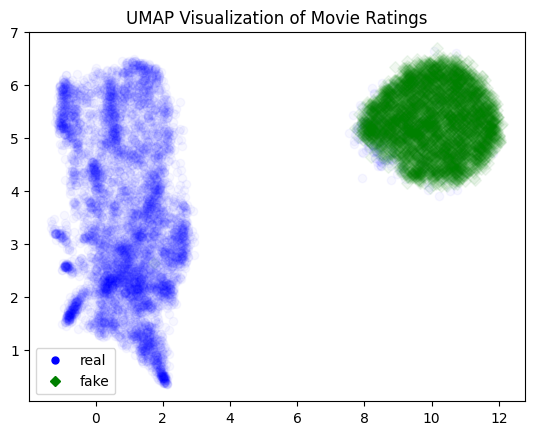

In [ ]:
size = df_pivot.shape[0]

merged_sample = pd.concat([df_pivot, df_fake_pivot], axis = 0).reset_index(drop=True)


# 평점 데이터를 가져와서 점의 크기로 사용할 수 있도록 전처리
#ratings_real = merged_sample['Rating'].values
# 점의 크기는 평점에 비례하도록 설정

#sizes_real = ratings_real[:size]**3
#sizes_fake = ratings_real[size:]**4

# umap을 사용하여 데이터를 저차원으로 투영
reducer_real = umap.UMAP(n_neighbors = 15, random_state=100)
embedding_real = reducer_real.fit_transform(merged_sample.values)


# 시각화
plt.scatter(embedding_real[:size, 0], embedding_real[:size, 1],  alpha=0.03, color='blue', label='real')
plt.scatter(embedding_real[size:, 0], embedding_real[size:, 1],  alpha=0.06, color='green', marker='D', label='real')
plt.title('UMAP Visualization of Movie Ratings')
# 범례 추가
legend_markers = [plt.Line2D([0], [0], color='blue', marker='o', linestyle='', markersize=5),
                  plt.Line2D([0], [0], color='green', marker='D', linestyle='', markersize=5)]
legend_labels = ['real', 'fake']
plt.legend(legend_markers, legend_labels)
plt.show()

# 발표 준비

In [ ]:
ratings

,UserID,MovieID,Rating,Timestamp
0,1,1193,5,978300760
1,1,661,3,978302109
2,1,914,3,978301968
3,1,3408,4,978300275
4,1,2355,5,978824291
...,...,...,...,...
1000204,6040,1091,1,956716541
1000205,6040,1094,5,956704887
1000206,6040,562,5,956704746
1000207,6040,1096,4,956715648


In [ ]:
counts = ratings_df.stack().value_counts()

In [ ]:
counts

0    22453111
4      348971
3      261197
5      226310
2      107557
1       56174
dtype: int64

In [ ]:
df_fake = df_new.sample(n=2000418)

In [ ]:
df_fake

,UserID,MovieID,Rating
4532687,271,950,1.0
5982669,653,1258,1.0
12917136,1200,2742,1.0
13356868,1220,2833,1.0
9430862,3630,2020,4.0
...,...,...,...
8883100,1884,1907,1.0
5412347,507,1136,2.0
3306787,1699,693,1.0
1943386,922,406,2.0


In [ ]:
#df_fake = pd.read_csv(path + 'df_fake.csv')

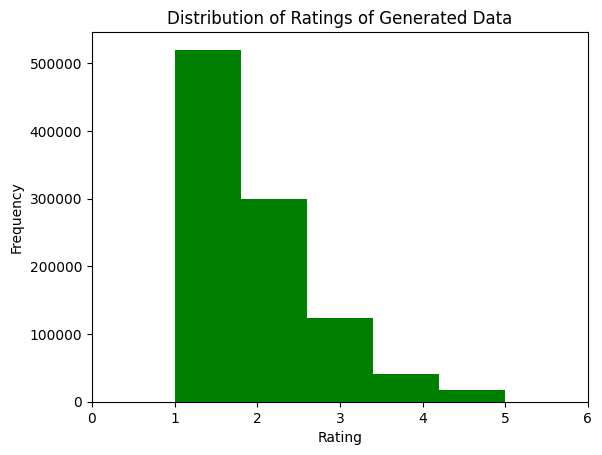

In [ ]:
#df.replace(0, float('nan'), inplace = True)
plt.xlim(0, 6)
plt.hist(df_fake['Rating'], bins = 5, color = 'green')
plt.xlabel('Rating')
plt.ylabel('Frequency')
plt.title('Distribution of Ratings of Generated Data')
plt.show()

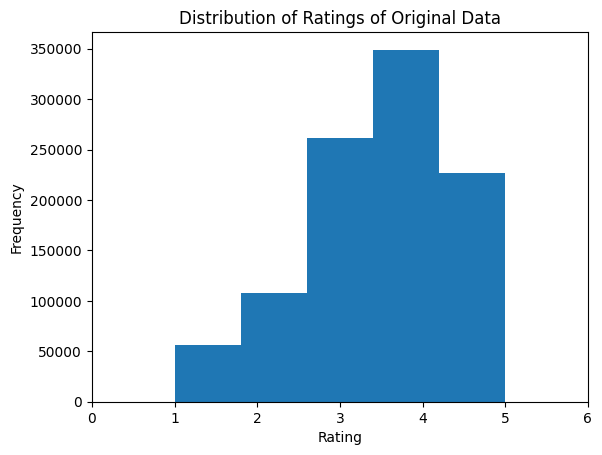

In [ ]:
#df.replace(0, float('nan'), inplace = True)
plt.xlim(0, 6)
plt.hist(ratings['Rating'], bins = 5)
plt.xlabel('Rating')
plt.ylabel('Frequency')
plt.title('Distribution of Ratings of Original Data')
plt.show()

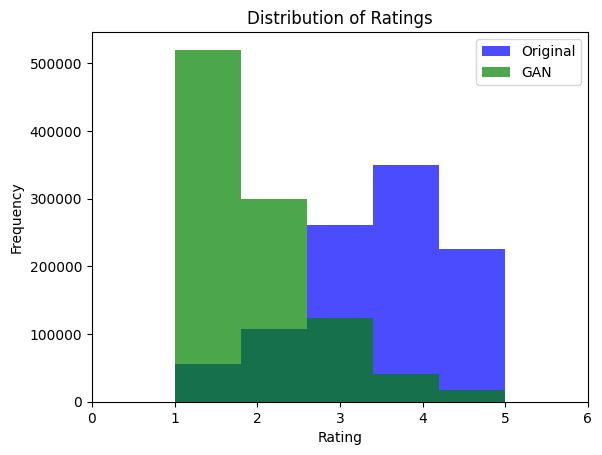

In [ ]:
#df.replace(0, float('nan'), inplace = True)
plt.xlim(0, 6)
plt.hist(ratings['Rating'], bins = 5, color = 'blue', alpha=0.7, label = 'Original')
plt.hist(df_fake['Rating'], bins = 5, color = 'green', alpha = 0.7, label = 'GAN')
plt.xlabel('Rating')
plt.ylabel('Frequency')
plt.legend()
plt.title('Distribution of Ratings')
plt.show()

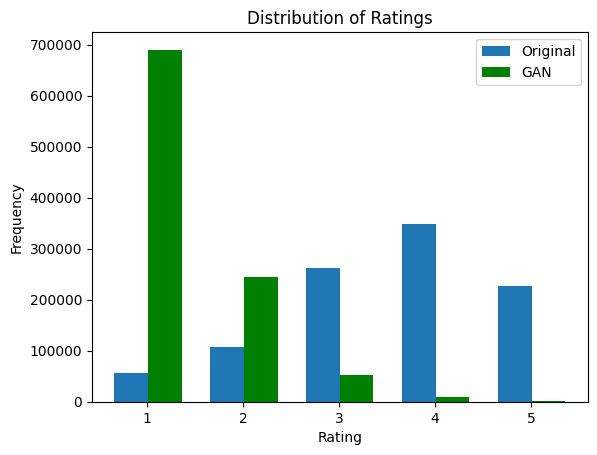

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# 두 번째 히스토그램 데이터
ratings_original = ratings['Rating']
bins_original = 5

# 첫 번째 히스토그램 데이터
ratings_fake = df_fake['Rating']
bins_fake = 5


# 막대 폭과 오프셋 설정
bar_width = 0.35
bar_offset = 0.175

# x 좌표 계산
x_original = np.arange(bins_original) + bar_offset
x_fake = np.arange(bins_fake) + bar_offset + bar_width

# 막대 그래프 그리기
plt.bar(x_original, np.histogram(ratings_original, bins=bins_original)[0], bar_width, label='Original')
plt.bar(x_fake, np.histogram(ratings_fake, bins=bins_fake)[0], bar_width, label='GAN', color = 'green')

# # x 축 설정
x_ticks = np.arange(bins_fake) + 0.34
x_labels = np.arange(1, bins_fake + 1)
plt.xticks(x_ticks, x_labels)


# 축과 제목 설정
plt.xlabel('Rating')
plt.ylabel('Frequency')
plt.title('Distribution of Ratings')
plt.legend()

# 그림 표시
plt.show()


In [ ]:
ratings.drop('Timestamp', axis=1, inplace=True)

In [ ]:
df_combined = pd.concat([ratings, df_fake], axis=0, ignore_index=True)

In [ ]:
df_combined

,UserID,MovieID,Rating
0,1,1193,5.0
1,1,661,3.0
2,1,914,3.0
3,1,3408,4.0
4,1,2355,5.0
...,...,...,...
3000622,1884,1907,1.0
3000623,507,1136,2.0
3000624,1699,693,1.0
3000625,922,406,2.0


In [ ]:
df_combined.to_csv(path + 'df_combined1.csv', index=False)

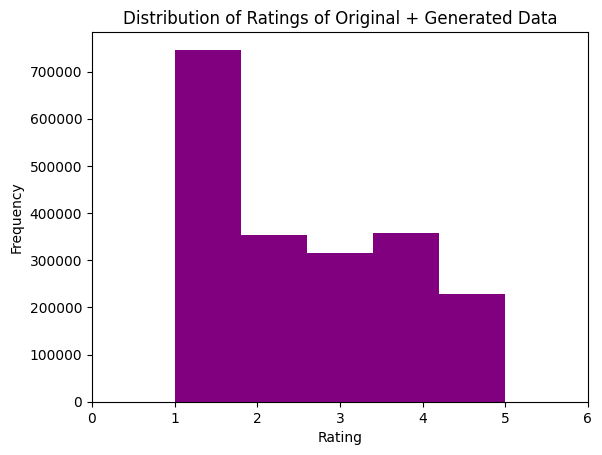

In [ ]:
#df.replace(0, float('nan'), inplace = True)
plt.xlim(0, 6)
plt.hist(df_combined['Rating'], bins = 5, color = 'purple')
plt.xlabel('Rating')
plt.ylabel('Frequency')
plt.title('Distribution of Ratings of Original + Generated Data')
plt.show()